### Import Library

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

!pip install scorecardpy
import scorecardpy as sc

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import plot_roc_curve
from sklearn.metrics import roc_auc_score, roc_curve, RocCurveDisplay, precision_recall_curve, PrecisionRecallDisplay
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.metrics import accuracy_score
from sklearn import metrics
from sklearn.feature_selection import VarianceThreshold
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_validate
!pip install feature_engine
from feature_engine.selection import DropCorrelatedFeatures, SmartCorrelatedSelection

import warnings
warnings.filterwarnings("ignore")

sns.set(style='whitegrid')
sns.set_palette("bright")

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


### Load Data Set

In [3]:
apptes = pd.read_csv("/content/drive/MyDrive/application_test.csv")
apptes

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,456221,Cash loans,F,N,Y,0,121500.0,412560.0,17473.5,270000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
48740,456222,Cash loans,F,N,N,2,157500.0,622413.0,31909.5,495000.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
48741,456223,Cash loans,F,Y,Y,1,202500.0,315000.0,33205.5,315000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,3.0,1.0
48742,456224,Cash loans,M,N,N,0,225000.0,450000.0,25128.0,450000.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,2.0


In [4]:
apptrain = pd.read_csv("/content/drive/MyDrive/application_train.csv")
apptrain

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,0,0,1.0,0.0,0.0,1.0,0.0,1.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [5]:
bureau = pd.read_csv("/content/drive/MyDrive/bureau.csv")
bureau

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.00,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.00,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.50,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.00,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.00,NaN,NaN,0.0,Consumer credit,-21,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1716423,259355,5057750,Active,currency 1,-44,0,-30.0,NaN,0.0,0,11250.00,11250.0,0.0,0.0,Microloan,-19,NaN
1716424,100044,5057754,Closed,currency 1,-2648,0,-2433.0,-2493.0,5476.5,0,38130.84,0.0,0.0,0.0,Consumer credit,-2493,NaN
1716425,100044,5057762,Closed,currency 1,-1809,0,-1628.0,-970.0,NaN,0,15570.00,NaN,NaN,0.0,Consumer credit,-967,NaN
1716426,246829,5057770,Closed,currency 1,-1878,0,-1513.0,-1513.0,NaN,0,36000.00,0.0,0.0,0.0,Consumer credit,-1508,NaN


In [6]:
prev = pd.read_csv("/content/drive/MyDrive/previous_application.csv")
prev

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,...,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,...,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,...,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,...,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,...,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,...,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670209,2300464,352015,Consumer loans,14704.290,267295.5,311400.0,0.0,267295.5,WEDNESDAY,12,...,Furniture,30.0,low_normal,POS industry with interest,365243.0,-508.0,362.0,-358.0,-351.0,0.0
1670210,2357031,334635,Consumer loans,6622.020,87750.0,64291.5,29250.0,87750.0,TUESDAY,15,...,Furniture,12.0,middle,POS industry with interest,365243.0,-1604.0,-1274.0,-1304.0,-1297.0,0.0
1670211,2659632,249544,Consumer loans,11520.855,105237.0,102523.5,10525.5,105237.0,MONDAY,12,...,Consumer electronics,10.0,low_normal,POS household with interest,365243.0,-1457.0,-1187.0,-1187.0,-1181.0,0.0
1670212,2785582,400317,Cash loans,18821.520,180000.0,191880.0,NaN,180000.0,WEDNESDAY,9,...,XNA,12.0,low_normal,Cash X-Sell: low,365243.0,-1155.0,-825.0,-825.0,-817.0,1.0


In [7]:
prev_app = prev.groupby(['SK_ID_CURR'])['SK_ID_CURR'].agg(['count']).reset_index()
prev_app.columns = ['SK_ID_CURR','TOTAL_PREV_APP']
prev_app

,SK_ID_CURR,TOTAL_PREV_APP
0,100001,1
1,100002,1
2,100003,3
3,100004,1
4,100005,2
...,...,...
338852,456251,1
338853,456252,1
338854,456253,2
338855,456254,2


In [8]:
bureau_cred = bureau.groupby(['SK_ID_CURR'])['SK_ID_CURR'].agg(['count']).reset_index()
bureau_cred.columns = ['SK_ID_CURR','TOTAL_BUREAU_LOAN']
bureau_cred

,SK_ID_CURR,TOTAL_BUREAU_LOAN
0,100001,7
1,100002,8
2,100003,4
3,100004,2
4,100005,3
...,...,...
305806,456249,13
305807,456250,3
305808,456253,4
305809,456254,1


In [9]:
df = (apptrain.merge(prev_app, how='left', on='SK_ID_CURR')).merge(bureau_cred, how='left', on='SK_ID_CURR')
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,8.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,4.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,456251,0,Cash loans,M,N,N,0,157500.0,254700.0,27558.0,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
307507,456252,0,Cash loans,F,N,Y,0,72000.0,269550.0,12001.5,...,0,0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
307508,456253,0,Cash loans,F,N,Y,0,153000.0,677664.0,29979.0,...,0,0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,4.0
307509,456254,1,Cash loans,F,N,Y,0,171000.0,370107.0,20205.0,...,0,0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0


### Data Cleaning

In [10]:
# Cek setiap kolom data untuk mengetahui kolom yg memiliki missing value diatas 30%
total = df.isnull().sum().sort_values(ascending = False)
percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
missing_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).reset_index()
missing_data.loc[missing_data['Percent'] >30]

,index,Total,Percent
0,COMMONAREA_MODE,214865,69.872297
1,COMMONAREA_AVG,214865,69.872297
2,COMMONAREA_MEDI,214865,69.872297
3,NONLIVINGAPARTMENTS_AVG,213514,69.432963
4,NONLIVINGAPARTMENTS_MODE,213514,69.432963
5,NONLIVINGAPARTMENTS_MEDI,213514,69.432963
6,FONDKAPREMONT_MODE,210295,68.386172
7,LIVINGAPARTMENTS_MEDI,210199,68.354953
8,LIVINGAPARTMENTS_AVG,210199,68.354953
9,LIVINGAPARTMENTS_MODE,210199,68.354953


In [11]:
(missing_data.loc[missing_data['Percent'] >0]).shape

(69, 3)

In [12]:
df.duplicated().sum()

0

In [13]:
df.dtypes.value_counts()

float64    67
int64      41
object     16
dtype: int64

In [14]:
df.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

Data categorical diatas relatif kecil nilainya, jadi nanti akan dilakukan feature encoding untuk menyelesaikanya

### EDA

0: will repay on time
1: will have difficulty repaying loan


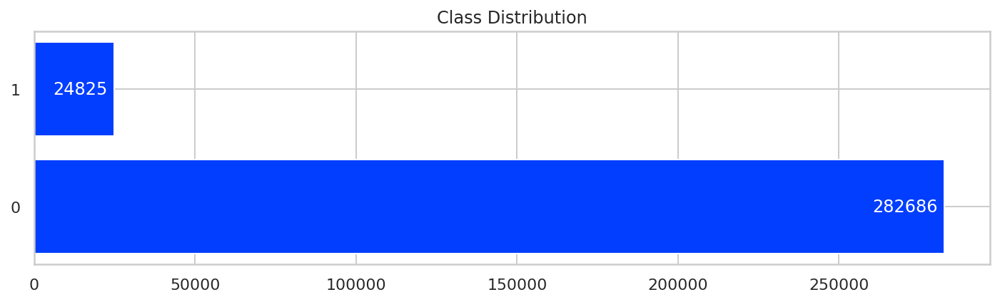

In [15]:
print("0: will repay on time")
print("1: will have difficulty repaying loan")

class_dist = df['TARGET'].value_counts()

plt.figure(figsize=(12,3))
plt.title('Class Distribution')
plt.barh(class_dist.index, class_dist.values)
plt.yticks([0, 1])

for i, value in enumerate(class_dist.values):
    plt.text(value-2000, i, str(value), fontsize=12, color='white',
             horizontalalignment='right', verticalalignment='center')

plt.show()

- 1 : Bad Customer
- 2 : Good Customer

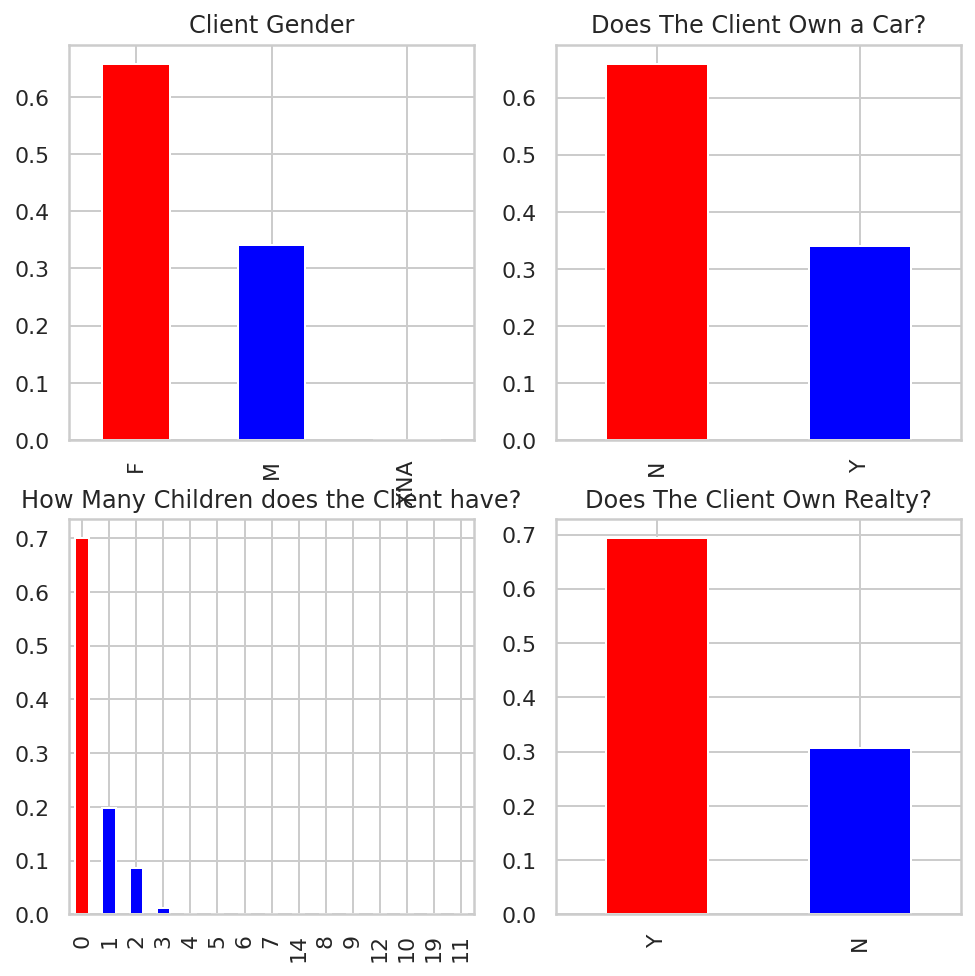

In [16]:
plt.figure(1)
plt.subplot(221)
df['CODE_GENDER'].value_counts(normalize=True).plot.bar(figsize=(8,8), title= 'Client Gender', color=['red','blue'])
plt.subplot(222)
df['FLAG_OWN_CAR'].value_counts(normalize=True).plot.bar(title= 'Does The Client Own a Car?', color=['red','blue'])
plt.subplot(223)
df['CNT_CHILDREN'].value_counts(normalize=True).plot.bar(title= 'How Many Children does the Client have?', color=['red','blue','blue','blue'])
plt.subplot(224)
df['FLAG_OWN_REALTY'].value_counts(normalize=True).plot.bar(figsize=(8,8), title= 'Does The Client Own Realty?', color=['red','blue'])

plt.show()

In [17]:
df['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

In [18]:
df['CNT_CHILDREN'].value_counts()

0     215371
1      61119
2      26749
3       3717
4        429
5         84
6         21
7          7
14         3
8          2
9          2
12         2
10         2
19         2
11         1
Name: CNT_CHILDREN, dtype: int64

In [19]:
df['FLAG_OWN_CAR'].value_counts()

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

In [20]:
df['FLAG_OWN_REALTY'].value_counts()

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

In [21]:
df['EXT_SOURCE_1'].describe()

count    134133.000000
mean          0.502130
std           0.211062
min           0.014568
25%           0.334007
50%           0.505998
75%           0.675053
max           0.962693
Name: EXT_SOURCE_1, dtype: float64

In [22]:
data_EX1 = df[['TARGET', 'EXT_SOURCE_1']]
data_EX1['EXT_SOURCE_1_GROUP'] = pd.cut(data_EX1['EXT_SOURCE_1'], bins = np.linspace(0, 1, num=6))
data_EX1 = (data_EX1.groupby(['EXT_SOURCE_1_GROUP']).mean()).sort_values('TARGET')
data_EX1

,TARGET,EXT_SOURCE_1
EXT_SOURCE_1_GROUP,,
"(0.8, 1.0]",0.024551,0.846599
"(0.6, 0.8]",0.041637,0.696240
"(0.4, 0.6]",0.064229,0.500625
"(0.2, 0.4]",0.103121,0.305683
"(0.0, 0.2]",0.182317,0.141402


<BarContainer object of 5 artists>

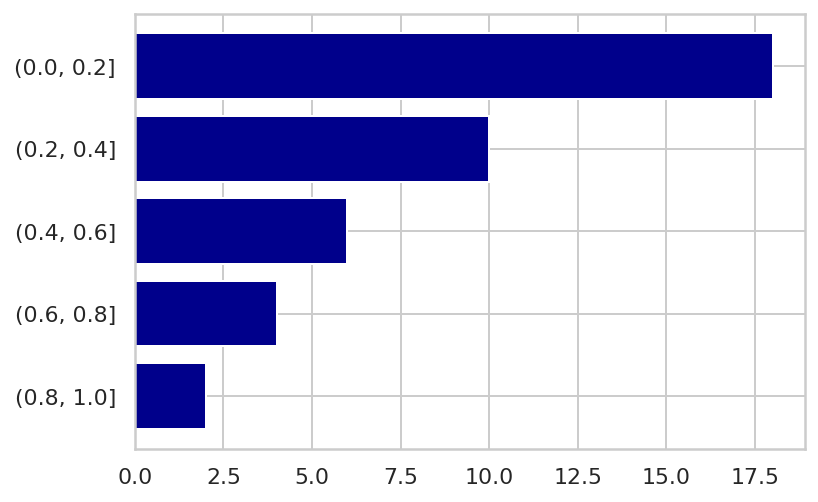

In [23]:
plt.barh(data_EX1.index.astype(str), round(100*data_EX1['TARGET']), color='darkblue')

In [24]:
df['EXT_SOURCE_2'].describe()

count    3.068510e+05
mean     5.143927e-01
std      1.910602e-01
min      8.173617e-08
25%      3.924574e-01
50%      5.659614e-01
75%      6.636171e-01
max      8.549997e-01
Name: EXT_SOURCE_2, dtype: float64

In [25]:
data_EX2 = df[['TARGET', 'EXT_SOURCE_2']]
data_EX2['EXT_SOURCE_2_GROUP'] = pd.cut(data_EX2['EXT_SOURCE_2'], bins = np.linspace(0, 1, num=6))
data_EX2 = (data_EX2.groupby(['EXT_SOURCE_2_GROUP']).mean()).sort_values('TARGET')
data_EX2

,TARGET,EXT_SOURCE_2
EXT_SOURCE_2_GROUP,,
"(0.8, 1.0]",0.017575,0.807577
"(0.6, 0.8]",0.045715,0.681445
"(0.4, 0.6]",0.077942,0.515838
"(0.2, 0.4]",0.116156,0.306879
"(0.0, 0.2]",0.188444,0.113479


<BarContainer object of 5 artists>

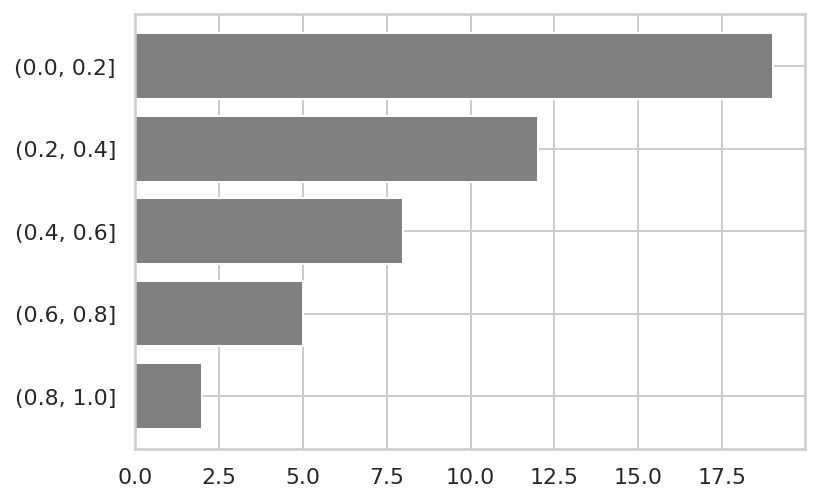

In [26]:
plt.barh(data_EX2.index.astype(str), round(100*data_EX2['TARGET']), color='grey')

In [27]:
df['EXT_SOURCE_3'].describe()

count    246546.000000
mean          0.510853
std           0.194844
min           0.000527
25%           0.370650
50%           0.535276
75%           0.669057
max           0.896010
Name: EXT_SOURCE_3, dtype: float64

In [28]:
data_EX3 = df[['TARGET', 'EXT_SOURCE_3']]
data_EX3['EXT_SOURCE_3_GROUP'] = pd.cut(data_EX3['EXT_SOURCE_3'], bins = np.linspace(0, 1, num=6))
data_EX3 = (data_EX3.groupby(['EXT_SOURCE_3_GROUP']).mean()).sort_values('TARGET')
data_EX3

,TARGET,EXT_SOURCE_3
EXT_SOURCE_3_GROUP,,
"(0.8, 1.0]",0.028729,0.825140
"(0.6, 0.8]",0.039989,0.691383
"(0.4, 0.6]",0.065192,0.506095
"(0.2, 0.4]",0.117779,0.311368
"(0.0, 0.2]",0.209439,0.128083


<BarContainer object of 5 artists>

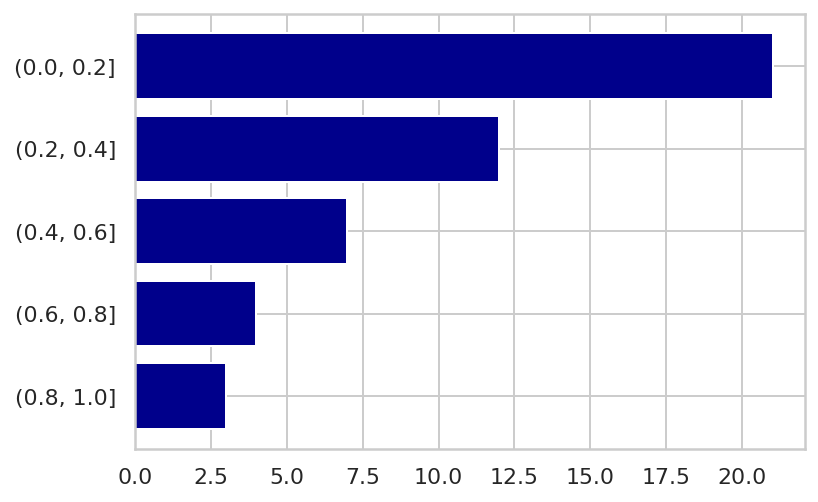

In [29]:
plt.barh(data_EX3.index.astype(str), round(100*data_EX3['TARGET']), color='darkblue')

## Data Prepocessing Data Training

In [79]:
df = (apptrain.merge(prev_app, how='left', on='SK_ID_CURR')).merge(bureau_cred, how='left', on='SK_ID_CURR')
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,8.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,4.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

In [80]:
df['DAYS_BIRTH']

0         -9461
1        -16765
2        -19046
3        -19005
4        -19932
          ...  
307506    -9327
307507   -20775
307508   -14966
307509   -11961
307510   -16856
Name: DAYS_BIRTH, Length: 307511, dtype: int64

In [81]:
df['AGE'] = df['DAYS_BIRTH']/-365
df.drop(columns='DAYS_BIRTH', inplace=True)

In [82]:
df['AGE'].describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: AGE, dtype: float64

In [83]:
df['DAYS_EMPLOYED']

0           -637
1          -1188
2           -225
3          -3039
4          -3038
           ...  
307506      -236
307507    365243
307508     -7921
307509     -4786
307510     -1262
Name: DAYS_EMPLOYED, Length: 307511, dtype: int64

In [84]:
df['DAYS_EMPLOYED'].describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

In [85]:
df['YEARS_EMPLOYED'] = df['DAYS_EMPLOYED']/-365
df.drop(columns='DAYS_EMPLOYED', inplace=True)

df['YEARS_EMPLOYED'].describe()

count    307511.000000
mean       -174.835742
std         387.056895
min       -1000.665753
25%           0.791781
50%           3.323288
75%           7.561644
max          49.073973
Name: YEARS_EMPLOYED, dtype: float64

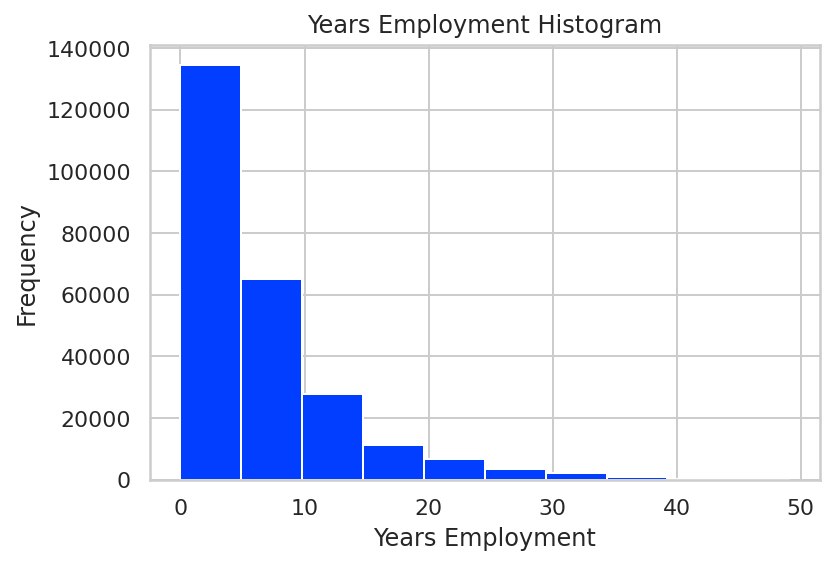

In [86]:
df['YEARS_EMPLOYED'].replace({df['YEARS_EMPLOYED'].min(): np.nan}, inplace=True)
df['YEARS_EMPLOYED'].plot.hist(title = 'Years Employment Histogram');
plt.xlabel('Years Employment');

In [87]:
data_employed = df[['TARGET', 'YEARS_EMPLOYED','AGE']]
data_employed['YEARS_EMPLOYED_GROUP'] = pd.cut(data_employed['YEARS_EMPLOYED'], bins = np.linspace(0, 50, num=6))
data_employed = ((data_employed.groupby(['YEARS_EMPLOYED_GROUP']).mean())).sort_values('TARGET')
data_employed

,TARGET,YEARS_EMPLOYED,AGE
YEARS_EMPLOYED_GROUP,,,
"(40.0, 50.0]",0.004274,42.419588,62.777719
"(30.0, 40.0]",0.034645,33.725897,55.769764
"(20.0, 30.0]",0.044917,23.945354,49.161998
"(10.0, 20.0]",0.055133,13.662366,44.636523
"(0.0, 10.0]",0.095392,3.928111,39.017162


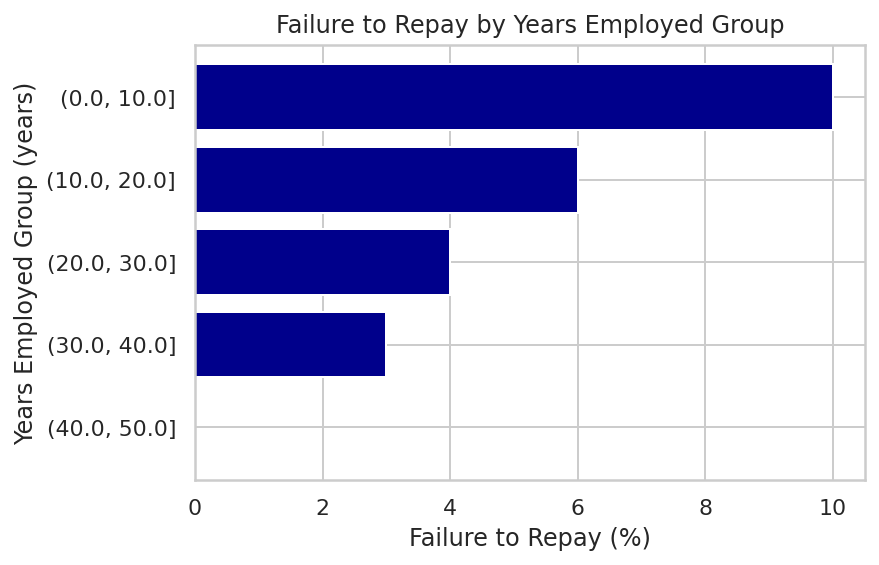

In [88]:
plt.barh(data_employed.index.astype(str), round(100*data_employed['TARGET']), color='darkblue')

plt.ylabel('Years Employed Group (years)')
plt.xlabel('Failure to Repay (%)')
plt.title('Failure to Repay by Years Employed Group');
plt.show()

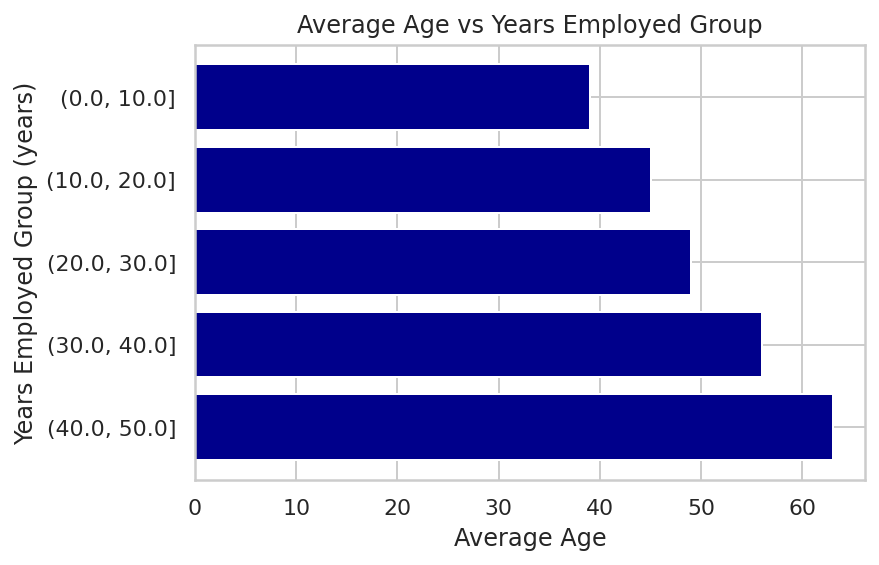

In [89]:
plt.barh(data_employed.index.astype(str), round(data_employed['AGE']), color='darkblue')

plt.ylabel('Years Employed Group (years)')
plt.xlabel('Average Age')
plt.title('Average Age vs Years Employed Group');
plt.show()

**Number of documents provided by a customer**

In [90]:
import re

regex = re.compile('FLAG_DOCUMENT_')
col = [i for i in df.columns if re.match(regex, i)]

In [91]:
df['TOTAL_DOCUMENT'] = df['FLAG_DOCUMENT_2'] + df['FLAG_DOCUMENT_3'] + df['FLAG_DOCUMENT_4'] + df['FLAG_DOCUMENT_5'] + df['FLAG_DOCUMENT_6'] + df['FLAG_DOCUMENT_7'] + df['FLAG_DOCUMENT_8'] + df['FLAG_DOCUMENT_9'] + df['FLAG_DOCUMENT_10'] + df['FLAG_DOCUMENT_11'] + df['FLAG_DOCUMENT_12'] + df['FLAG_DOCUMENT_13'] + df['FLAG_DOCUMENT_14'] + df['FLAG_DOCUMENT_15'] + df['FLAG_DOCUMENT_16'] + df['FLAG_DOCUMENT_17'] + df['FLAG_DOCUMENT_18'] + df['FLAG_DOCUMENT_19'] + df['FLAG_DOCUMENT_20'] + df['FLAG_DOCUMENT_21'] 

In [92]:
df.drop(columns = [i for i in df.columns if re.match(regex, i)], inplace=True)

In [93]:
df['TOTAL_DOCUMENT'].value_counts()

1    270056
0     29549
2      7742
3       163
4         1
Name: TOTAL_DOCUMENT, dtype: int64

In [94]:
doc_list = []
for index, column in df.iterrows():
    if column['TOTAL_DOCUMENT'] >= 1:
        doc = 1
    else:
        doc = 0
    doc_list.append(doc)

df['DOC_PROVIDED'] = doc_list

In [95]:
doc_data = df.groupby(['DOC_PROVIDED'])['TARGET'].mean().reset_index()
doc_data

,DOC_PROVIDED,TARGET
0,0,0.055230
1,1,0.083439


In [96]:
doc_data['DOC_PROVIDED'] = doc_data['DOC_PROVIDED'].astype('int')

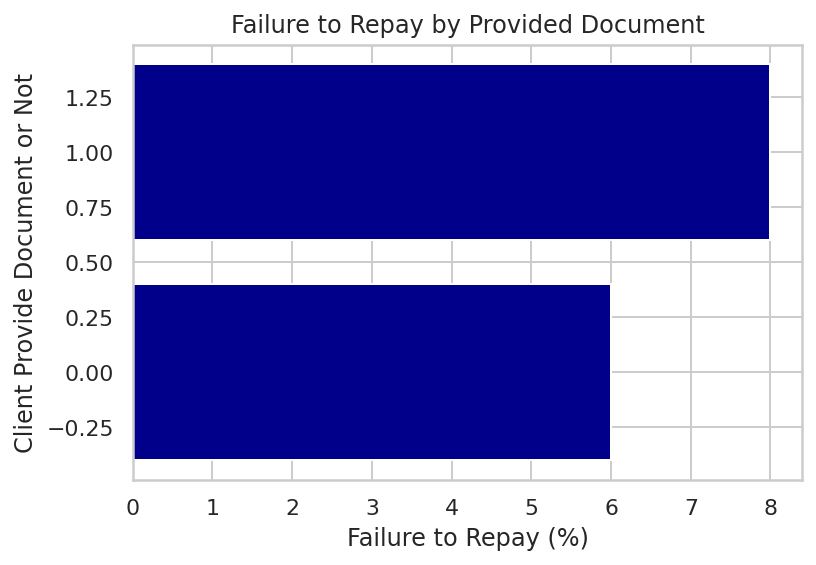

In [97]:
plt.barh(range(0,2), round(100*doc_data['TARGET']), color='darkblue')

plt.ylabel('Client Provide Document or Not')
plt.xlabel('Failure to Repay (%)')
plt.title('Failure to Repay by Provided Document')
plt.show()

**Income Annuity Percentage** : persentase anuitas relatif terhadap pendapatan klien

Anuitas pendapatan adalah jaminan pendapatan seumur hidup yang Anda beli dari perusahaan asuransi untuk mengurangi risiko kehabisan uang di masa pensiun. Sama seperti Anda mengasuransikan rumah Anda, Anda dapat memastikan umur panjang Anda dengan meneruskan risiko pengeluaran tabungan Anda ke perusahaan asuransi.

Source: https://www.blueprintincome.com/resources/income-annuities/

In [98]:
df['INCOME_ANNUITY_PERCENT'] = (df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL'])*100

In [99]:
df['INCOME_ANNUITY_PERCENT'].describe()

count    307499.000000
mean         18.093001
std           9.457380
min           0.022388
25%          11.478182
50%          16.283333
75%          22.906667
max         187.596491
Name: INCOME_ANNUITY_PERCENT, dtype: float64

In [100]:
income_list = []
for index, column in df.iterrows():
    if column['INCOME_ANNUITY_PERCENT'] > 150:
        income = 150
    else:
        income = column['INCOME_ANNUITY_PERCENT']
    income_list.append(income)

df['INCOME_ANNUITY_PERCENT_NEW'] = income_list

In [101]:
income_annuity = df[['TARGET', 'INCOME_ANNUITY_PERCENT_NEW']]
income_annuity['INCOME_ANNUITY_PERCENT_NEW_GROUP'] = pd.cut(income_annuity['INCOME_ANNUITY_PERCENT_NEW'], bins = np.linspace(0, 200, num=5))
income_annuity = (income_annuity.groupby(['INCOME_ANNUITY_PERCENT_NEW_GROUP']).mean()).sort_values('TARGET')
income_annuity

,TARGET,INCOME_ANNUITY_PERCENT_NEW
INCOME_ANNUITY_PERCENT_NEW_GROUP,,
"(50.0, 100.0]",0.074489,59.974851
"(0.0, 50.0]",0.080775,17.739247
"(100.0, 150.0]",0.151515,116.888560
"(150.0, 200.0]",NaN,NaN


**Earned Income Tax Credit (EITC)**

EITC sama dengan persentase tetap ("tingkat kredit") dari pendapatan yang diperoleh sampai kredit mencapai jumlah maksimumnya.

Source: https://sgp.fas.org/crs/misc/R43805.pdf

In [102]:
df['EITC'] = df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL']

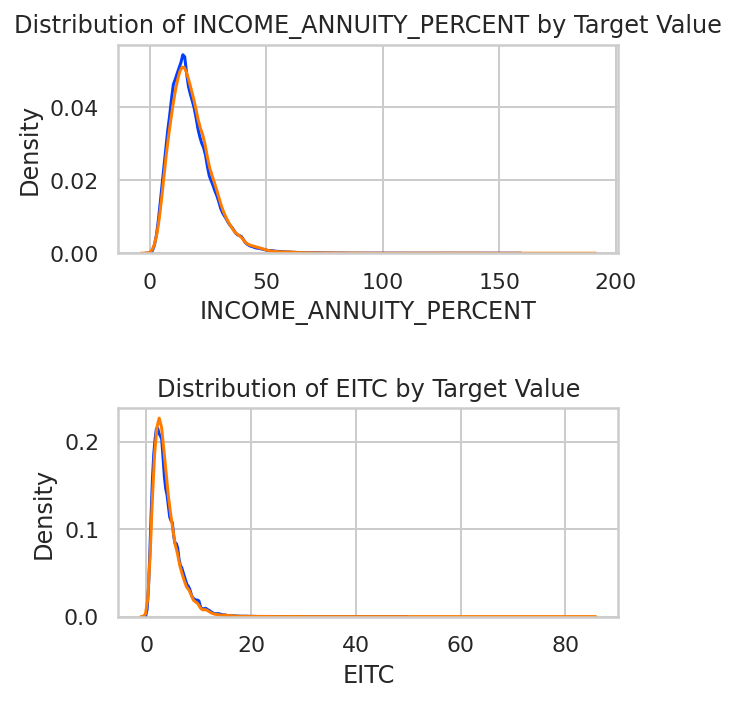

In [103]:
plt.figure(figsize = (5,5))
# iterate through the new features
for i, feature in enumerate(['INCOME_ANNUITY_PERCENT', 'EITC']):
    
    # create a new subplot for each source
    plt.subplot(2, 1, i + 1)
    # plot repaid loans
    sns.kdeplot(df.loc[df['TARGET'] == 0, feature], label = 'target == 0')
    # plot loans that were not repaid
    sns.kdeplot(df.loc[df['TARGET'] == 1, feature], label = 'target == 1')
    
    # Label the plots
    plt.title('Distribution of %s by Target Value' % feature)
    plt.xlabel('%s' % feature); plt.ylabel('Density');
    
plt.tight_layout(h_pad = 2.5)

In [104]:
pd.set_option('display.max_columns', None)
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,DOC_PROVIDED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW,EITC
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.0220,0.0198,0.0,0.0000,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.0000,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,8.0,25.920548,1.745205,1,1,12.197778,12.197778,2.007889
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.0790,0.0554,0.0,0.0000,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.0100,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,4.0,45.931507,3.254795,1,1,13.221667,13.221667,4.790750
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,52.180822,0.616438,0,0,10.000000,10.000000,2.000000
3,100006,0,Cash loans,F,N,Y,0,13500

***Ganti nilai XNA dengan NaN***

In [105]:
for col in df.select_dtypes(include = ["object"]).columns:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Value count kolom NAME_CONTRACT_TYPE:
Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

Value count kolom CODE_GENDER:
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

Value count kolom FLAG_OWN_CAR:
N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

Value count kolom FLAG_OWN_REALTY:
Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

Value count kolom NAME_TYPE_SUITE:
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

Value count kolom NAME_INCOME_TYPE:
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

Va

In [106]:
df.CODE_GENDER.replace("XNA", np.nan, inplace=True)

#### Menjaga kolom yang kurang dari sama dengan 60% dari nilai yang hilang

Melihat di himpunan data ketika ada lebih dari 60% data hilang, biasanya variabel drop yang paling disukai ketika melibatkan dan mengambil pilihan untuk menjatuhkan variabel yang seharusnya tidak memengaruhi analisis keseluruhan.

Source: https://www.analyticsvidhya.com/blog/2021/10/guide-to-deal-with-missing-values/

In [107]:
df.shape

(307511, 109)

In [108]:
total = df.isnull().sum().sort_values(ascending = False)
percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
missing_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).reset_index()
missing_data.loc[missing_data['Percent'] >60]

,index,Total,Percent
0,COMMONAREA_MEDI,214865,69.872297
1,COMMONAREA_MODE,214865,69.872297
2,COMMONAREA_AVG,214865,69.872297
3,NONLIVINGAPARTMENTS_AVG,213514,69.432963
4,NONLIVINGAPARTMENTS_MODE,213514,69.432963
5,NONLIVINGAPARTMENTS_MEDI,213514,69.432963
6,FONDKAPREMONT_MODE,210295,68.386172
7,LIVINGAPARTMENTS_MODE,210199,68.354953
8,LIVINGAPARTMENTS_AVG,210199,68.354953
9,LIVINGAPARTMENTS_MEDI,210199,68.354953


In [109]:
df.drop(columns=list(missing_data['index'].loc[missing_data['Percent'] >60]),inplace=True)
df.shape

(307511, 92)

### Isi missing value dengan imputation

In [110]:
null = df.isnull().sum().reset_index()
null_table = null.loc[null[0] > 0]
null_table.shape

(56, 2)

ada 56 kolom yang memiliki missing value

In [111]:
data_null = df[null_table['index'].tolist()]
data_null

,CODE_GENDER,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,YEARS_EMPLOYED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW
0,M,24700.5,351000.0,Unaccompanied,Laborers,1.0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0252,0.0383,0.9722,0.0000,0.0690,0.0833,0.0377,0.0198,0.0000,0.0250,0.0369,0.9722,0.00,0.0690,0.0833,0.0375,0.0193,0.0000,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,8.0,1.745205,12.197778,12.197778
1,F,35698.5,1129500.0,Family,Core staff,2.0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.08,0.0345,0.2917,0.0130,0.0549,0.0098,0.0924,0.0538,0.9851,0.0806,0.0345,0.2917,0.0128,0.0554,0.0000,0.0968,0.0529,0.9851,0.08,0.0345,0.2917,0.0132,0.0558,0.0100,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,4.0,3.254795,13.221667,13.221667
2,M,6750.0,135000.0,Unaccompanied,Laborers,1.0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.616438,10.000000,10.000000
3,F,29686.5,297000.0,Unaccompanied,Laborers,2.0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,NaN,NaN,NaN,NaN,NaN,NaN,9.0,NaN,8.326027,21.990000,21.990000
4,M,21865.5,513000.0,Unaccompanied,Core staff,1.0,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0,1.0,8.323288,17.996296,17.996296
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,M,27558.0,225000.0,Unaccompanied,Sales staff,1.0,0.145570,0.681632,NaN,0.2021,0.0887,0.9876,0.22,0.1034,0.6042,0.0594,0.1965,0.1095,0.1008,0.0172,0.9782,0.0806,0.0345,0.4583,0.0094,0.0853,0.0125,0.2040,0.0887,0.9876,0.22,0.1034,0.6042,0.0605,0.2001,0.1118,block of flats,0.2898,"Stone, brick",No,0.0,0.0,0.0,0.0,-273.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,0.646575,17.497143,17.497143
307507,F,12001.5,225000.0,Unaccompanied,NaN,1.0,NaN,0.115992,NaN,0.0247,0.0435,0.9727,0.00,0.1034,0.0833,0.0579,0.0257,0.0000,0.0252,0.0451,0.9727,0.0000,0.1034,0.0833,0.0592,0.0267,0.0000,0.0250,0.0435,0.9727,0.00,0.1034,0.0833,0.0589,0.0261,0.0000,block of flats,0.0214,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,16.668750,16.668750
307508,F,29979.0,585000.0,Unaccompanied,Managers,1.0,0.744026,0.535722,0.218859,0.1031,0.0862,0.9816,0.00,0.2069,0.1667,NaN,0.9279,0.0000,0.1050,0.0894,0.9816,0.0000,0.2069,0.1667,NaN,0.9667,0.0000,0.1041,0.0862,0.9816,0.00,0.2069,0.1667,NaN,0.9445,0.0000,block of flats,0.7970,Panel,No,6.0,0.0,6.0,0.0,-1909.0,1.0,0.0,0.0,1.0,0.0,1.0,2.0,4.0,21.701370,19.594118,19.594118
307509,F,20205.0,319500.0,Unac

In [112]:
data_null.select_dtypes(exclude = ["object"] ).shape[1]

50

In [113]:
data_null.select_dtypes(include = ["object"] ).shape[1]

6

In [114]:
def miss_numerical(df):
    
    numerical_features = df.select_dtypes(exclude = ["object"] ).columns
    for f in numerical_features:
        df[f] = df[f].fillna(df[f].median())
    return df

def miss_categorical(df):
    
    categorical_features = df.select_dtypes(include = ["object"]).columns
    for f in categorical_features:
        df[f] = df[f].fillna(df[f].mode()[0])
    return df

def transform_feature(df):
    df = miss_numerical(df)
    df = miss_categorical(df)
    return df

df = transform_feature(df)
df

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,DOC_PROVIDED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW,EITC
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-3648.0,-2120,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0252,0.0383,0.9722,0.0000,0.0690,0.0833,0.0377,0.0198,0.0000,0.0250,0.0369,0.9722,0.00,0.0690,0.0833,0.0375,0.0193,0.0000,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,8.0,25.920548,1.745205,1,1,12.197778,12.197778,2.007889
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-1186.0,-291,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,0.535276,0.0959,0.0529,0.9851,0.08,0.0345,0.2917,0.0130,0.0549,0.0098,0.0924,0.0538,0.9851,0.0806,0.0345,0.2917,0.0128,0.0554,0.0000,0.0968,0.0529,0.9851,0.08,0.0345,0.2917,0.0132,0.0558,0.0100,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,4.0,45.931507,3.254795,1,1,13.221667,13.221667,4.790750
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-4260.0,-2531,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,0.505998,0.555912,0.729567,0.0876,0.0763,0.9816,0.00,0.1379,0.1667,0.0481,0.0745,0.0036,0.0840,0.0746,0.9816,0.0000,0.1379,0.1667,0.0458,0.0731,0.0011,0.0864,0.0758,0.9816,0.00,0.1379,0.1667,0.0487,0.0749,0.0031,block of flats,0.0688,Panel,No,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,52.180822,0.616438,0,0,10.000000,10.000000,2.000000
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-9833.0,-2437,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,0.505998,0.650442,0.535276,0.0876,0.0763,0.9816,0.00,0.1379,0.1667,0.0481,0.0745,0.0036,0.0840,0.0746,0.9816,0.0000,0.1379,0.1667,0.0458,0.0731,0.0011,0.0864,0.0758,0.9816,0.00,0.1379,0.1667,0.0487,0.0749,0.0031,block of flats,0.0688,Panel,No,2.0,0.0,2.0,0.0,-617.0,0.0,0.0,0.0,0.0,0.0,1.0,9.0,4.0,52.068493,8

kita cek lagi apakah masih terdapat missing value atau tidak

In [115]:
null = df.isnull().sum().reset_index()
null_table = null.loc[null[0] > 0]
null_table.shape[0]

0

tidak ada missing value

### Scaling Numerical Features

In [116]:
from sklearn.preprocessing import MinMaxScaler


def encoder(df):
    scaler = MinMaxScaler()
    numerical = df.select_dtypes(exclude = ["object"]).columns
    numerical1 = numerical[2:4]
    numerical2 = numerical[5:]
    numerical_all = numerical1 | numerical2
    features_transform = pd.DataFrame(data=df)
    features_transform[numerical_all] = scaler.fit_transform(df[numerical_all])
    display(features_transform.head(n = 5))
    return df

df = encoder(df)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,DOC_PROVIDED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW,EITC
0,100002,1,Cash loans,M,N,Y,0.0,0.001512,406597.5,0.090032,0.077441,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.256321,0.852140,0.705433,1.0,1.0,0.0,1.0,1.0,0.0,Laborers,0.000000,0.5,0.5,WEDNESDAY,0.434783,0.0,0.0,0.0,0.0,0.0,0.0,Business Entity Type 3,0.072215,0.307542,0.155054,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0252,0.0383,0.9722,0.0000,0.0690,0.0833,0.0377,0.0198,0.0000,0.0250,0.0369,0.9722,0.00,0.0690,0.0833,0.0375,0.0193,0.0000,block of flats,0.0149,"Stone, brick",No,0.005747,0.058824,0.005814,0.083333,0.735788,0.0,0.0,0.0,0.0,0.0,0.04,0.000000,0.060870,0.111161,0.035563,0.25,1.0,0.064910,0.081181,0.023640
1,100003,0,Cash loans,F,N,N,0.0,0.002089,1293502.5,0.132924,0.271605,Family,State servant,Higher education,Married,House / apartment,0.045016,0.951929,0.959566,1.0,1.0,0.0,1.0,1.0,0.0,Core staff,0.052632,0.0,0.0,MONDAY,0.478261,0.0,0.0,0.0,0.0,0.0,0.0,School,0.312933,0.727773,0.597163,0.0959,0.0529,0.9851,0.08,0.0345,0.2917,0.0130,0.0549,0.0098,0.0924,0.0538,0.9851,0.0806,0.0345,0.2917,0.0128,0.0554,0.0000,0.0968,0.0529,0.9851,0.08,0.0345,0.2917,0.0132,0.0558,0.0100,block of flats,0.0714,Block,No,0.002874,0.000000,0.002907,0.000000,0.807083,0.0,0.0,0.0,0.0,0.0,0.00,0.027778,0.026087,0.522886,0.066324,0.25,1.0,0.070368,0.088008,0.056483
2,100004,0,Revolving loans,M,Y,Y,0.0,0.000358,135000.0,0.020025,0.023569,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.134897,0.827335,0.648326,1.0,1.0,1.0,1.0,1.0,0.0,Laborers,0.000000,0.5,0.5,MONDAY,0.391304,0.0,0.0,0.0,0.0,0.0,0.0,Government,0.518318,0.650190,0.814130,0.0876,0.0763,0.9816,0.00,0.1379,0.1667,0.0481,0.0745,0.0036,0.0840,0.0746,0.9816,0.0000,0.1379,0.1667,0.0458,0.0731,0.0011,0.0864,0.0758,0.9816,0.00,0.1379,0.1667,0.0487,0.0749,0.0031,block of flats,0.0688,Panel,No,0.000000,0.000000,0.000000,0.000000,0.810112,0.0,0.0,0.0,0.0,0.0,0.00,0.000000,0.008696,0.651466,0.012561,0.00,0.0,0.053193,0.066527,0.023547
3,100006,0,Cash loans,F,N,Y,0.0,0.000935,312682.5,0.109477,0.063973,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.107023,0.601451,0.661387,1.0,1.0,0.0,1.0,0.0,0.0,Laborers,0.052632,0.5,0.5,WEDNESDAY,0.739130,0.0,0.0,0.0,0.0,0.0,0.0,Business Entity Type 3,0.518318,0.760751,

In [117]:
scaler_AMT_CREDIT = MinMaxScaler()
scaler_AMT_CREDIT.fit(df['AMT_CREDIT'].values.reshape(len(df), 1))

df['AMT_CREDIT'] = scaler_AMT_CREDIT.transform(df['AMT_CREDIT'].values.reshape(len(df), 1))

In [118]:
df.shape

(307511, 92)

### Feature Encoding

kategori yg memiliki 2 kategori unik menggunakan label encoding, sedangkan untuk yang lebih dari 2 kategori unik menggunakan one-hot encoding

In [119]:
df[df.select_dtypes(include = ["object"]).columns].head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,block of flats,Panel,No
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,block of flats,Panel,No
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,block of flats,Panel,No


In [120]:
for col in df.select_dtypes(include = ["object"]).columns:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Value count kolom NAME_CONTRACT_TYPE:
Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

Value count kolom CODE_GENDER:
F    202452
M    105059
Name: CODE_GENDER, dtype: int64

Value count kolom FLAG_OWN_CAR:
N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

Value count kolom FLAG_OWN_REALTY:
Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

Value count kolom NAME_TYPE_SUITE:
Unaccompanied      249818
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

Value count kolom NAME_INCOME_TYPE:
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

Value count kolom NA

In [121]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le_count = 0

for col in df:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])            
            le_count += 1
           
print('Total label encoded columns: %d' % le_count)

Total label encoded columns: 5


In [122]:
df.shape

(307511, 92)

In [123]:
le_count = 0

for col in df:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) > 2:
            onehots = pd.get_dummies(df[col])
            df = df.join(onehots)
            df.drop(columns=col, inplace=True)
            le_count += 1
           
print('Total one hot encoded columns: %d' % le_count)

Total one hot encoded columns: 10


In [124]:
df.shape

(307511, 207)

In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Columns: 207 entries, SK_ID_CURR to Wooden
dtypes: float64(75), int64(7), uint8(125)
memory usage: 239.4 MB


In [126]:
df_train = df.iloc[:,1:]

In [127]:
DF_TRAIN = df_train
DF_TRAIN

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,DOC_PROVIDED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW,EITC,Children,Family,Group of people,Other_A,Other_B,"Spouse, partner",Unaccompanied,Businessman,Commercial associate,Maternity leave,Pensioner,State servant,Student,Unemployed,Working,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special,Civil marriage,Married,Separated,Single / not married,Unknown,Widow,Co-op apartment,House / apartment,Municipal apartment,Office apartment,Rented apartment,With parents,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business Entity Type 1,Business Entity Type 2,Business Entity Type 3,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry: type 1,Industry: type 10,Industry: type 11,Industry: type 12,Industry: type 13,Industry: type 2,Industry: type 3,Industry: type 4,Industry: type 5,Industry: type 6,Industry: type 7,Industry: type 8,Industry: type 9,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade: type 1,Trade: type 2,Trade: type 3,Trade: type 4,Trade: type 5,Trade: type 6,Trade: type 7,Transport: type 1,Transport: type 2,Transport: type 3,Transport: type 4,University,XNA,block of flats,specific housing,terraced house,Block,Mixed,Monolithic,Others,Panel,"Stone, brick",Wooden
0,1,0,1,0,1,0.0,0.001512,0.090287,0.090032,0.077441,0.256321,0.852140,0.705433,1.0,1.0,0.0,1.0,1.0,0.0,0.000000,0.5,0.5,0.434783,0.0,0.0,0.0,0.0,0.0,0.0,0.072215,0.307542,0.155054,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0252,0.0383,0.9722,0.0000,0.0690,0.0833,0.0377,0.0198,0.0000,0.0250,0.0369,0.9722,0.00,0.0690,0.0833,0.0375,0.0193,0.0000,0.0149,0,0.005747,0.058824,0.005814,0.083333,0.735788,0.00,0.0,0.0,0.000000,0.0,0.04,0.000000,0.060870,0.111161,0.035563,0.25,1.0,0.064910,0.081181,0.023640,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0.0,0.002089,0.311736,0.132924,0.271605,0.045016,0.951929,0.959566,1.0,1.0,0.0,1.0,1.0,0.0,0.052632,0.0,0.0,0.478261,0.0,0.0

## Data Processing Data Test

In [128]:
df = (apptes.merge(prev_app, how='left', on='SK_ID_CURR')).merge(bureau_cred, how='left', on='SK_ID_CURR')
df

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-19241,-2329,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-18064,-4469,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,3.0
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-20038,-4458,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0

Konvert DAYS_BIRTH menjadi AGE utk mendapatkan umur klien

In [129]:
df['AGE'] = df['DAYS_BIRTH']/-365
df.drop(columns='DAYS_BIRTH', inplace=True)

In [130]:
df['YEARS_EMPLOYED'] = df['DAYS_EMPLOYED']/-365
df.drop(columns='DAYS_EMPLOYED', inplace=True)

In [131]:
df['YEARS_EMPLOYED'].replace({df['YEARS_EMPLOYED'].min(): np.nan}, inplace=True)

#### Number of documents provided by a customer

In [132]:
regex = re.compile('FLAG_DOCUMENT_')
col = [i for i in df.columns if re.match(regex, i)]

In [133]:
df['TOTAL_DOCUMENT'] = df['FLAG_DOCUMENT_2'] + df['FLAG_DOCUMENT_3'] + df['FLAG_DOCUMENT_4'] + df['FLAG_DOCUMENT_5'] + df['FLAG_DOCUMENT_6'] + df['FLAG_DOCUMENT_7'] + df['FLAG_DOCUMENT_8'] + df['FLAG_DOCUMENT_9'] + df['FLAG_DOCUMENT_10'] + df['FLAG_DOCUMENT_11'] + df['FLAG_DOCUMENT_12'] + df['FLAG_DOCUMENT_13'] + df['FLAG_DOCUMENT_14'] + df['FLAG_DOCUMENT_15'] + df['FLAG_DOCUMENT_16'] + df['FLAG_DOCUMENT_17'] + df['FLAG_DOCUMENT_18'] + df['FLAG_DOCUMENT_19'] + df['FLAG_DOCUMENT_20'] + df['FLAG_DOCUMENT_21'] 

In [134]:
df.drop(columns = [i for i in df.columns if re.match(regex, i)], inplace=True)

### Income Annuity Percentage
persentase anuitas relatif terhadap pendapatan klien

Anuitas pendapatan adalah jaminan pendapatan seumur hidup yang Anda beli dari perusahaan asuransi untuk mengurangi risiko kehabisan uang di masa pensiun. Sama seperti Anda mengasuransikan rumah Anda, Anda dapat memastikan umur panjang Anda dengan meneruskan risiko pengeluaran tabungan Anda ke perusahaan asuransi.

Source: https://www.blueprintincome.com/resources/income-annuities/

In [135]:
df['INCOME_ANNUITY_PERCENT'] = df['AMT_ANNUITY'] / df['AMT_INCOME_TOTAL']

In [136]:
df['INCOME_ANNUITY_PERCENT'].describe()

count    48720.000000
mean         0.182984
std          0.095479
min          0.005730
25%          0.116333
50%          0.165923
75%          0.229872
max          2.024714
Name: INCOME_ANNUITY_PERCENT, dtype: float64

### Earned Income Tax Credit (EITC)

EITC sama dengan persentase tetap ("tingkat kredit") dari pendapatan yang diperoleh sampai kredit mencapai jumlah maksimumnya.

Source: https://sgp.fas.org/crs/misc/R43805.pdf

In [137]:
df['EITC'] = df['AMT_CREDIT'] / df['AMT_INCOME_TOTAL']
df

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,INCOME_ANNUITY_PERCENT,EITC
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-5170.0,-812,NaN,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0505,NaN,NaN,0.0672,0.0612,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0526,NaN,NaN,0.0666,0.0590,0.9732,NaN,NaN,NaN,0.1379,0.1250,NaN,NaN,NaN,0.0514,NaN,NaN,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0,52.715068,6.380822,1,0.152300,4.213333
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-9118.0,-1623,NaN,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,3.0,49.490411,12.243836,1,0.175455,2.250182
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-2175.0,-3503,5.0,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,54.898630,12.213699,1,0.344578,3.275378
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-2000.0,-4208,NaN,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,0.525734,0.509677,0.612704,0.3052,0.1974,0.9970,0.9592,0.1165,0.32,0.2759,0.3750,0.0417,0.2042,0.2404,0.3673,0.0386,0.0800,0.3109,0.2049,0.9970,0.960

In [138]:
for col in df.select_dtypes(include = ["object"]).columns:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Value count kolom NAME_CONTRACT_TYPE:
Cash loans         48305
Revolving loans      439
Name: NAME_CONTRACT_TYPE, dtype: int64

Value count kolom CODE_GENDER:
F    32678
M    16066
Name: CODE_GENDER, dtype: int64

Value count kolom FLAG_OWN_CAR:
N    32311
Y    16433
Name: FLAG_OWN_CAR, dtype: int64

Value count kolom FLAG_OWN_REALTY:
Y    33658
N    15086
Name: FLAG_OWN_REALTY, dtype: int64

Value count kolom NAME_TYPE_SUITE:
Unaccompanied      39727
Family              5881
Spouse, partner     1448
Children             408
Other_B              211
Other_A              109
Group of people       49
Name: NAME_TYPE_SUITE, dtype: int64

Value count kolom NAME_INCOME_TYPE:
Working                 24533
Commercial associate    11402
Pensioner                9273
State servant            3532
Student                     2
Businessman                 1
Unemployed                  1
Name: NAME_INCOME_TYPE, dtype: int64

Value count kolom NAME_EDUCATION_TYPE:
Secondary / secondary special    3

In [139]:
df.ORGANIZATION_TYPE.replace("XNA", np.nan, inplace=True)

#### Menjaga kolom yang kurang dari sama dengan 60% dari nilai yang hilang

Melihat di himpunan data ketika ada lebih dari 60% data hilang, biasanya variabel drop yang paling disukai ketika melibatkan dan mengambil pilihan untuk menjatuhkan variabel yang seharusnya tidak memengaruhi analisis keseluruhan.

Source: https://www.analyticsvidhya.com/blog/2021/10/guide-to-deal-with-missing-values/

In [140]:
df.shape

(48744, 106)

In [141]:
total = df.isnull().sum().sort_values(ascending = False)
percent = (df.isnull().sum()/df.isnull().count()*100).sort_values(ascending = False)
missing_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent']).reset_index()
missing_data.loc[missing_data['Percent'] >60]

,index,Total,Percent
0,COMMONAREA_MODE,33495,68.716150
1,COMMONAREA_AVG,33495,68.716150
2,COMMONAREA_MEDI,33495,68.716150
3,NONLIVINGAPARTMENTS_AVG,33347,68.412523
4,NONLIVINGAPARTMENTS_MEDI,33347,68.412523
5,NONLIVINGAPARTMENTS_MODE,33347,68.412523
6,FONDKAPREMONT_MODE,32797,67.284179
7,LIVINGAPARTMENTS_AVG,32780,67.249302
8,LIVINGAPARTMENTS_MODE,32780,67.249302
9,LIVINGAPARTMENTS_MEDI,32780,67.249302


In [142]:
df.drop(columns=list(missing_data['index'].loc[missing_data['Percent'] >60]),inplace=True)
df.shape

(48744, 89)

In [143]:
df.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,INCOME_ANNUITY_PERCENT,EITC
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-5170.0,-812,1,1,0,1,0,1,NaN,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,0.1379,0.125,NaN,0.0505,NaN,0.0672,0.0612,0.9732,NaN,0.1379,0.125,NaN,0.0526,NaN,0.0666,0.0590,0.9732,NaN,0.1379,0.125,NaN,0.0514,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0,52.715068,6.380822,1,0.152300,4.213333
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-9118.0,-1623,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,3.0,49.490411,12.243836,1,0.175455,2.250182
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,NaN,Working,Higher education,Married,House / apartment,0.019101,-2175.0,-3503,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-856.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,54.898630,12.213699,1,0.344578,3.275378
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-2000.0,-4208,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,0.525734,0.509677,0.612704,0.3052,0.1974,0.9970,0.32,0.2759,0.375,0.2042,0.3673,0.08,0.3109,0.2049,0.9970,0.3222,0.2759,0.375,0.2089,0.3827,0.0847,0.3081,0.1974,0.9970,0.32,0.2759,0.375,0.2078,0.3739,0.0817,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,-1805.0,0.0,0.0,0.0,0.0,0.0,3.0,5.0,12.0,38.290411,5.112329,1,0.155614,5.000000
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.010032,-4000.0,-4262,1,1,1,1,0,0,NaN,3.0,2,2,FRIDAY,5,0,0,0,0,1,1,Business Entity Type 3,0.202145,0.425687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

#### isi missing values dengan imputasi

In [144]:
null = df.isnull().sum().reset_index()
null_table = null.loc[null[0] > 0]
null_table.shape

(52, 2)

terdapat 53 kolom memiliki missing value

In [145]:
data_null = df[null_table['index'].tolist()]
data_null

,AMT_ANNUITY,NAME_TYPE_SUITE,OCCUPATION_TYPE,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,YEARS_EMPLOYED,INCOME_ANNUITY_PERCENT
0,20560.5,Unaccompanied,NaN,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,NaN,0.1379,0.1250,NaN,0.0505,NaN,0.0672,0.0612,0.9732,NaN,0.1379,0.1250,NaN,0.0526,NaN,0.0666,0.0590,0.9732,NaN,0.1379,0.1250,NaN,0.0514,NaN,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0,6.380822,0.152300
1,17370.0,Unaccompanied,Low-skill Laborers,Self-employed,0.564990,0.291656,0.432962,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,3.0,12.243836,0.175455
2,69777.0,NaN,Drivers,Transport: type 3,NaN,0.699787,0.610991,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,12.213699,0.344578
3,49018.5,Unaccompanied,Sales staff,Business Entity Type 3,0.525734,0.509677,0.612704,0.3052,0.1974,0.9970,0.32,0.2759,0.3750,0.2042,0.3673,0.0800,0.3109,0.2049,0.9970,0.3222,0.2759,0.3750,0.2089,0.3827,0.0847,0.3081,0.1974,0.9970,0.32,0.2759,0.3750,0.2078,0.3739,0.0817,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,5.0,12.0,5.112329,0.155614
4,32067.0,Unaccompanied,NaN,Business Entity Type 3,0.202145,0.425687,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,6.002740,0.178150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,17473.5,Unaccompanied,NaN,Other,NaN,0.648575,0.643026,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,5.0,14.161644,0.143815
48740,31909.5,Unaccompanied,Sales staff,Trade: type 7,NaN,0.684596,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,4.0,NaN,3.147945,0.202600
48741,33205.5,Unaccompanied,NaN,Business Entity Type 3,0.733503,0.632770,0.283712,0.1113,0.1364,0.9955,0.16,0.1379,0.3333,NaN,0.1383,0.0542,0.1134,0.1415,0.9955,0.1611,0.1379,0.3333,NaN,0.1441,0.0574,0.1124,0.1364,0.9955,0.16,0.1379,0.3333,NaN,0.1408,0.0554,block of flats,0.1663,"Stone, brick",No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,1.0,2.0,5.0,8.320548,0.163978
48742,25128.0,Family,Managers,Self-employed,0.373090,0.445701,0.595456,0.1629,0.0723,0.9896,0.16,0.0690,0.6250,NaN,0.1563,0.1490,0.1660,0.0750,0.9896,0.1611,0.0690,0.6250,NaN,0.1204,0.1577,0.1645,0.0723,0.9896,0.16,0.0690,0.6250,NaN,0.1591,0.1521,block of flats,0.1974,Panel,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,5.0,17.0,7.482192,0.111680


In [146]:
data_null.select_dtypes(exclude = ["object"] ).shape[1]

46

In [147]:
data_null.select_dtypes(include = ["object"] ).shape[1]

6

In [148]:
def miss_numerical(df):
    
    numerical_features = df.select_dtypes(exclude = ["object"] ).columns
    for f in numerical_features:
        df[f] = df[f].fillna(df[f].median())
    return df

def miss_categorical(df):
    
    categorical_features = df.select_dtypes(include = ["object"]).columns
    for f in categorical_features:
        df[f] = df[f].fillna(df[f].mode()[0])
    return df

def transform_feature(df):
    df = miss_numerical(df)
    df = miss_categorical(df)
    return df

df = transform_feature(df)
df

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,INCOME_ANNUITY_PERCENT,EITC
0,100001,Cash loans,F,N,Y,0,135000.0,568800.0,20560.5,450000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.018850,-5170.0,-812,1,1,0,1,0,1,Laborers,2.0,2,2,TUESDAY,18,0,0,0,0,0,0,Kindergarten,0.752614,0.789654,0.159520,0.0660,0.0590,0.9732,0.00,0.1379,0.1250,0.0483,0.0505,0.0038,0.0672,0.0612,0.9732,0.0000,0.1379,0.1250,0.0462,0.0526,0.0012,0.0666,0.0590,0.9732,0.00,0.1379,0.1250,0.0488,0.0514,0.0031,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,-1740.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,7.0,52.715068,6.380822,1,0.152300,4.213333
1,100005,Cash loans,M,N,Y,0,99000.0,222768.0,17370.0,180000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.035792,-9118.0,-1623,1,1,0,1,0,0,Low-skill Laborers,2.0,2,2,FRIDAY,9,0,0,0,0,0,0,Self-employed,0.564990,0.291656,0.432962,0.0928,0.0781,0.9816,0.00,0.1379,0.1667,0.0483,0.0770,0.0038,0.0851,0.0770,0.9816,0.0000,0.1379,0.1667,0.0462,0.0751,0.0012,0.0926,0.0778,0.9816,0.00,0.1379,0.1667,0.0488,0.0776,0.0031,block of flats,0.0707,Panel,No,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,3.0,49.490411,12.243836,1,0.175455,2.250182
2,100013,Cash loans,M,Y,Y,0,202500.0,663264.0,69777.0,630000.0,Unaccompanied,Working,Higher education,Married,House / apartment,0.019101,-2175.0,-3503,1,1,0,1,0,0,Drivers,2.0,2,2,MONDAY,14,0,0,0,0,0,0,Transport: type 3,0.506771,0.699787,0.610991,0.0928,0.0781,0.9816,0.00,0.1379,0.1667,0.0483,0.0770,0.0038,0.0851,0.0770,0.9816,0.0000,0.1379,0.1667,0.0462,0.0751,0.0012,0.0926,0.0778,0.9816,0.00,0.1379,0.1667,0.0488,0.0776,0.0031,block of flats,0.0707,Panel,No,0.0,0.0,0.0,0.0,-856.0,0.0,0.0,0.0,0.0,1.0,4.0,4.0,4.0,54.898630,12.213699,1,0.344578,3.275378
3,100028,Cash loans,F,N,Y,2,315000.0,1575000.0,49018.5,1575000.0,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.026392,-2000.0,-4208,1,1,0,1,1,0,Sales staff,4.0,2,2,WEDNESDAY,11,0,0,0,0,0,0,Business Entity Type 3,0.525734,0.509677,0.612704,0.3052,0.1974,0.9970,0.32,0.2759,0.3750,0.2042,0.3673,0.0800,0.3109,0.2049,0.9970,0.3222,0.2759,0.3750,0.2089,0.3827,0.0847,0.3081,0.1974,0.9970,0.32,0.2759,0.3750,0.2078,0.3739,0.0817,block of flats,0.3700,Panel,No,0.0,0.0,0.0,0.0,-1805.0,0.0,0.0,0.0,0.0,0.0,3.0,5.0,12.0,38.290411,5.112329,1,0.155614,5.000000
4,100038,Cash loans,M,Y,N,1,180000.0,625500.0,32067.0,625500.0,Unaccompanied,Working,Secondary / secon

cek missing value lagi

In [149]:
null = df.isnull().sum().reset_index()
null_table = null.loc[null[0] > 0]
null_table.shape[0]

0

tidak ada missing value

### Scaling numerical features

In [150]:
def encoder(df):
    scaler = MinMaxScaler()
    numerical = df.select_dtypes(exclude = ["object"]).columns
    numerical = numerical[1:]
    features_transform = pd.DataFrame(data=df)
    features_transform[numerical] = scaler.fit_transform(df[numerical])
    display(features_transform.head(n = 5))
    return df

df = encoder(df)

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,INCOME_ANNUITY_PERCENT,EITC
0,100001,Cash loans,F,N,Y,0.00,0.024654,0.238037,0.102453,0.184049,Unaccompanied,Working,Higher education,Married,House / apartment,0.257380,0.782059,0.872086,1.0,1.0,0.0,1.0,0.0,1.0,Laborers,0.05,0.5,0.75,TUESDAY,0.782609,0.0,0.0,0.0,0.0,0.0,0.0,Kindergarten,0.798495,0.923572,0.180263,0.0660,0.0590,0.9732,0.00,0.1379,0.1250,0.0483,0.0505,0.0038,0.0672,0.0612,0.9732,0.0000,0.1379,0.1250,0.0462,0.0526,0.0012,0.0666,0.0590,0.9732,0.00,0.1379,0.1250,0.0488,0.0514,0.0031,block of flats,0.0392,"Stone, brick",No,0.0,0.0,0.0,0.0,0.601009,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.077922,0.666573,0.133318,1.0,0.072596,0.135766
1,100005,Cash loans,M,N,Y,0.00,0.016440,0.080785,0.084558,0.061350,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.491855,0.615631,0.744329,1.0,1.0,0.0,1.0,0.0,0.0,Low-skill Laborers,0.05,0.5,0.75,FRIDAY,0.391304,0.0,0.0,0.0,0.0,0.0,0.0,Self-employed,0.595809,0.341111,0.490287,0.0928,0.0781,0.9816,0.00,0.1379,0.1667,0.0483,0.0770,0.0038,0.0851,0.0770,0.9816,0.0000,0.1379,0.1667,0.0462,0.0751,0.0012,0.0926,0.0778,0.9816,0.00,0.1379,0.1667,0.0488,0.0776,0.0031,block of flats,0.0707,Panel,No,0.0,0.0,0.0,0.0,1.000000,0.0,0.0,0.0,0.0,0.000000,0.176471,0.013158,0.025974,0.600661,0.255870,1.0,0.084064,0.071087
2,100013,Cash loans,M,Y,Y,0.00,0.040054,0.280965,0.378515,0.265849,Unaccompanied,Working,Higher education,Married,House / apartment,0.260854,0.908313,0.448173,1.0,1.0,0.0,1.0,0.0,0.0,Drivers,0.05,0.5,0.75,MONDAY,0.608696,0.0,0.0,0.0,0.0,0.0,0.0,Transport: type 3,0.532916,0.818463,0.692134,0.0928,0.0781,0.9816,0.00,0.1379,0.1667,0.0483,0.0770,0.0038,0.0851,0.0770,0.9816,0.0000,0.1379,0.1667,0.0462,0.0751,0.0012,0.0926,0.0778,0.9816,0.00,0.1379,0.1667,0.0488,0.0776,0.0031,block of flats,0.0707,Panel,No,0.0,0.0,0.0,0.0,0.803715,0.0,0.0,0.0,0.0,0.142857,0.235294,0.039474,0.038961,0.711206,0.255240,1.0,0.167831,0.104864
3,100028,Cash loans,F,N,Y,0.10,0.065721,0.695297,0.262078,0.695297,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,0.361760,0.915690,0.337114,1.0,1.0,0.0,1.0,1.0,0.0,Sales staff,0.15,0.5,0.75,WEDNESDAY,0.478261,0.0,0.0,0.0,0.0,0.0,0.0,Business Entity Type 3,0.553401,0.596110,0.694076,0.3052,0.1974,0.9970,0.32,0.2759,0.3750,0.2042,0.3673,0.0800,0.3109,0.2049,0.9970,0.3222,0.2759,0.3750,0.2089,0.3827,0.0847,0.3081,0.1974,0.9970,0.32,0.2759,0.3750,0.20

In [151]:
df.shape

(48744, 89)

### Feature Encoding

kategori yg memiliki 2 kategori unik menggunakan label encoding, sedangkan untuk yang lebih dari 2 kategori unik menggunakan one-hot encoding

In [152]:
df[df.select_dtypes(include = ["object"]).columns].head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Married,House / apartment,Laborers,TUESDAY,Kindergarten,block of flats,"Stone, brick",No
1,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Low-skill Laborers,FRIDAY,Self-employed,block of flats,Panel,No
2,Cash loans,M,Y,Y,Unaccompanied,Working,Higher education,Married,House / apartment,Drivers,MONDAY,Transport: type 3,block of flats,Panel,No
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Sales staff,WEDNESDAY,Business Entity Type 3,block of flats,Panel,No
4,Cash loans,M,Y,N,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,FRIDAY,Business Entity Type 3,block of flats,Panel,No


In [153]:
for col in df.select_dtypes(include = ["object"]).columns:
    print(f'''Value count kolom {col}:''')
    print(df[col].value_counts())
    print()

Value count kolom NAME_CONTRACT_TYPE:
Cash loans         48305
Revolving loans      439
Name: NAME_CONTRACT_TYPE, dtype: int64

Value count kolom CODE_GENDER:
F    32678
M    16066
Name: CODE_GENDER, dtype: int64

Value count kolom FLAG_OWN_CAR:
N    32311
Y    16433
Name: FLAG_OWN_CAR, dtype: int64

Value count kolom FLAG_OWN_REALTY:
Y    33658
N    15086
Name: FLAG_OWN_REALTY, dtype: int64

Value count kolom NAME_TYPE_SUITE:
Unaccompanied      40638
Family              5881
Spouse, partner     1448
Children             408
Other_B              211
Other_A              109
Group of people       49
Name: NAME_TYPE_SUITE, dtype: int64

Value count kolom NAME_INCOME_TYPE:
Working                 24533
Commercial associate    11402
Pensioner                9273
State servant            3532
Student                     2
Businessman                 1
Unemployed                  1
Name: NAME_INCOME_TYPE, dtype: int64

Value count kolom NAME_EDUCATION_TYPE:
Secondary / secondary special    3

In [154]:
le = LabelEncoder()
le_count = 0

for col in df:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) <= 2:
            le.fit(df[col])
            df[col] = le.transform(df[col])            
            le_count += 1
           
print('%d columns were label encoded.' % le_count)

5 columns were label encoded.


In [155]:
df.shape

(48744, 89)

In [156]:
le_count = 0

for col in df:
    if df[col].dtype == 'object':
        if len(list(df[col].unique())) > 2:
            onehots = pd.get_dummies(df[col])
            df = df.join(onehots)
            df.drop(columns=col, inplace=True)
            le_count += 1
           
print('%d columns were one hot encoded.' % le_count)

10 columns were one hot encoded.


In [157]:
df.shape

(48744, 201)

In [158]:
df.head()

,SK_ID_CURR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,INCOME_ANNUITY_PERCENT,EITC,Children,Family,Group of people,Other_A,Other_B,"Spouse, partner",Unaccompanied,Businessman,Commercial associate,Pensioner,State servant,Student,Unemployed,Working,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special,Civil marriage,Married,Separated,Single / not married,Widow,Co-op apartment,House / apartment,Municipal apartment,Office apartment,Rented apartment,With parents,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business Entity Type 1,Business Entity Type 2,Business Entity Type 3,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry: type 1,Industry: type 10,Industry: type 11,Industry: type 12,Industry: type 13,Industry: type 2,Industry: type 3,Industry: type 4,Industry: type 5,Industry: type 6,Industry: type 7,Industry: type 8,Industry: type 9,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade: type 1,Trade: type 2,Trade: type 3,Trade: type 4,Trade: type 5,Trade: type 6,Trade: type 7,Transport: type 1,Transport: type 2,Transport: type 3,Transport: type 4,University,block of flats,specific housing,terraced house,Block,Mixed,Monolithic,Others,Panel,"Stone, brick",Wooden
0,100001,0,0,0,1,0.00,0.024654,0.238037,0.102453,0.184049,0.257380,0.782059,0.872086,1.0,1.0,0.0,1.0,0.0,1.0,0.05,0.5,0.75,0.782609,0.0,0.0,0.0,0.0,0.0,0.0,0.798495,0.923572,0.180263,0.0660,0.0590,0.9732,0.00,0.1379,0.1250,0.0483,0.0505,0.0038,0.0672,0.0612,0.9732,0.0000,0.1379,0.1250,0.0462,0.0526,0.0012,0.0666,0.0590,0.9732,0.00,0.1379,0.1250,0.0488,0.0514,0.0031,0.0392,0,0.0,0.0,0.0,0.0,0.601009,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.077922,0.666573,0.133318,1.0,0.072596,0.135766,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,100005,0,1,0,1,0.00,0.016440,0.080785,0.084558,0.061350,0.491855,0.615631,0.744329,1.0,1.0,0.0,1.0,0.0,0.0,0.05,0.5,0.75,0.391304,0.0,0.0,0.0,0.0,0.0,0.0,0.595809,0.341111,0.490287,0.0928,0.0781,0.9816,0.00,0.1379,0.1667,0.0483,0.07

In [159]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48744 entries, 0 to 48743
Columns: 201 entries, SK_ID_CURR to Wooden
dtypes: float64(73), int64(6), uint8(122)
memory usage: 36.4 MB


In [160]:
df_test = df.iloc[:,1:]
df_test

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,INCOME_ANNUITY_PERCENT,EITC,Children,Family,Group of people,Other_A,Other_B,"Spouse, partner",Unaccompanied,Businessman,Commercial associate,Pensioner,State servant,Student,Unemployed,Working,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special,Civil marriage,Married,Separated,Single / not married,Widow,Co-op apartment,House / apartment,Municipal apartment,Office apartment,Rented apartment,With parents,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business Entity Type 1,Business Entity Type 2,Business Entity Type 3,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry: type 1,Industry: type 10,Industry: type 11,Industry: type 12,Industry: type 13,Industry: type 2,Industry: type 3,Industry: type 4,Industry: type 5,Industry: type 6,Industry: type 7,Industry: type 8,Industry: type 9,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade: type 1,Trade: type 2,Trade: type 3,Trade: type 4,Trade: type 5,Trade: type 6,Trade: type 7,Transport: type 1,Transport: type 2,Transport: type 3,Transport: type 4,University,block of flats,specific housing,terraced house,Block,Mixed,Monolithic,Others,Panel,"Stone, brick",Wooden
0,0,0,0,1,0.00,0.024654,0.238037,0.102453,0.184049,0.257380,0.782059,0.872086,1.0,1.0,0.0,1.0,0.0,1.0,0.05,0.5,0.75,0.782609,0.0,0.0,0.0,0.0,0.0,0.0,0.798495,0.923572,0.180263,0.0660,0.0590,0.9732,0.00,0.1379,0.1250,0.0483,0.0505,0.0038,0.0672,0.0612,0.9732,0.0000,0.1379,0.1250,0.0462,0.0526,0.0012,0.0666,0.0590,0.9732,0.00,0.1379,0.1250,0.0488,0.0514,0.0031,0.0392,0,0.000000,0.0,0.000000,0.0,0.601009,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.077922,0.666573,0.133318,1.0,0.072596,0.135766,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,0,1,0,1,0.00,0.016440,0.080785,0.084558,0.061350,0.491855,0.615631,0.744329,1.0,1.0,0.0,1.0,0.0,0.0,0.05,0.5,0.75,0.391304,0.0,0.0,0.0,0.0,0.0,0.0,0.595809,0.341111,0.490287,0.0928,0.0781,0.9816,0.00,0.1379,0.1667,0.0483,0.0770,0.0038,0.085

In [161]:
DF_TEST = df_test
DF_TEST

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,INCOME_ANNUITY_PERCENT,EITC,Children,Family,Group of people,Other_A,Other_B,"Spouse, partner",Unaccompanied,Businessman,Commercial associate,Pensioner,State servant,Student,Unemployed,Working,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special,Civil marriage,Married,Separated,Single / not married,Widow,Co-op apartment,House / apartment,Municipal apartment,Office apartment,Rented apartment,With parents,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business Entity Type 1,Business Entity Type 2,Business Entity Type 3,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry: type 1,Industry: type 10,Industry: type 11,Industry: type 12,Industry: type 13,Industry: type 2,Industry: type 3,Industry: type 4,Industry: type 5,Industry: type 6,Industry: type 7,Industry: type 8,Industry: type 9,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade: type 1,Trade: type 2,Trade: type 3,Trade: type 4,Trade: type 5,Trade: type 6,Trade: type 7,Transport: type 1,Transport: type 2,Transport: type 3,Transport: type 4,University,block of flats,specific housing,terraced house,Block,Mixed,Monolithic,Others,Panel,"Stone, brick",Wooden
0,0,0,0,1,0.00,0.024654,0.238037,0.102453,0.184049,0.257380,0.782059,0.872086,1.0,1.0,0.0,1.0,0.0,1.0,0.05,0.5,0.75,0.782609,0.0,0.0,0.0,0.0,0.0,0.0,0.798495,0.923572,0.180263,0.0660,0.0590,0.9732,0.00,0.1379,0.1250,0.0483,0.0505,0.0038,0.0672,0.0612,0.9732,0.0000,0.1379,0.1250,0.0462,0.0526,0.0012,0.0666,0.0590,0.9732,0.00,0.1379,0.1250,0.0488,0.0514,0.0031,0.0392,0,0.000000,0.0,0.000000,0.0,0.601009,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.077922,0.666573,0.133318,1.0,0.072596,0.135766,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,0,1,0,1,0.00,0.016440,0.080785,0.084558,0.061350,0.491855,0.615631,0.744329,1.0,1.0,0.0,1.0,0.0,0.0,0.05,0.5,0.75,0.391304,0.0,0.0,0.0,0.0,0.0,0.0,0.595809,0.341111,0.490287,0.0928,0.0781,0.9816,0.00,0.1379,0.1667,0.0483,0.0770,0.0038,0.085

## Menyelaraskan Data Test dan Data Train
One-hot encoding telah membuat lebih banyak kolom dalam data pelatihan karena ada beberapa variabel kategoris dengan kategori yang tidak terwakili dalam data pengujian. Untuk menghapus kolom dalam data pelatihan yang tidak ada dalam data pengujian, kita perlu menyelaraskan dataframes. 

In [162]:
print('Training Features shape before: ', df_train.shape)
print('Testing Features shape before: ', df_test.shape)

Training Features shape before:  (307511, 206)
Testing Features shape before:  (48744, 200)


In [163]:
target = df_train['TARGET']

df_train, df_test = df_train.align(df_test, join = 'inner', axis = 1)
df_train['TARGET'] = target

In [164]:
print('Training Features shape after: ', df_train.shape)
print('Testing Features shape after: ', df_test.shape)

Training Features shape after:  (307511, 201)
Testing Features shape after:  (48744, 200)


## WOE and IV

In [165]:
df_train['TARGET'].value_counts()

0    282686
1     24825
Name: TARGET, dtype: int64

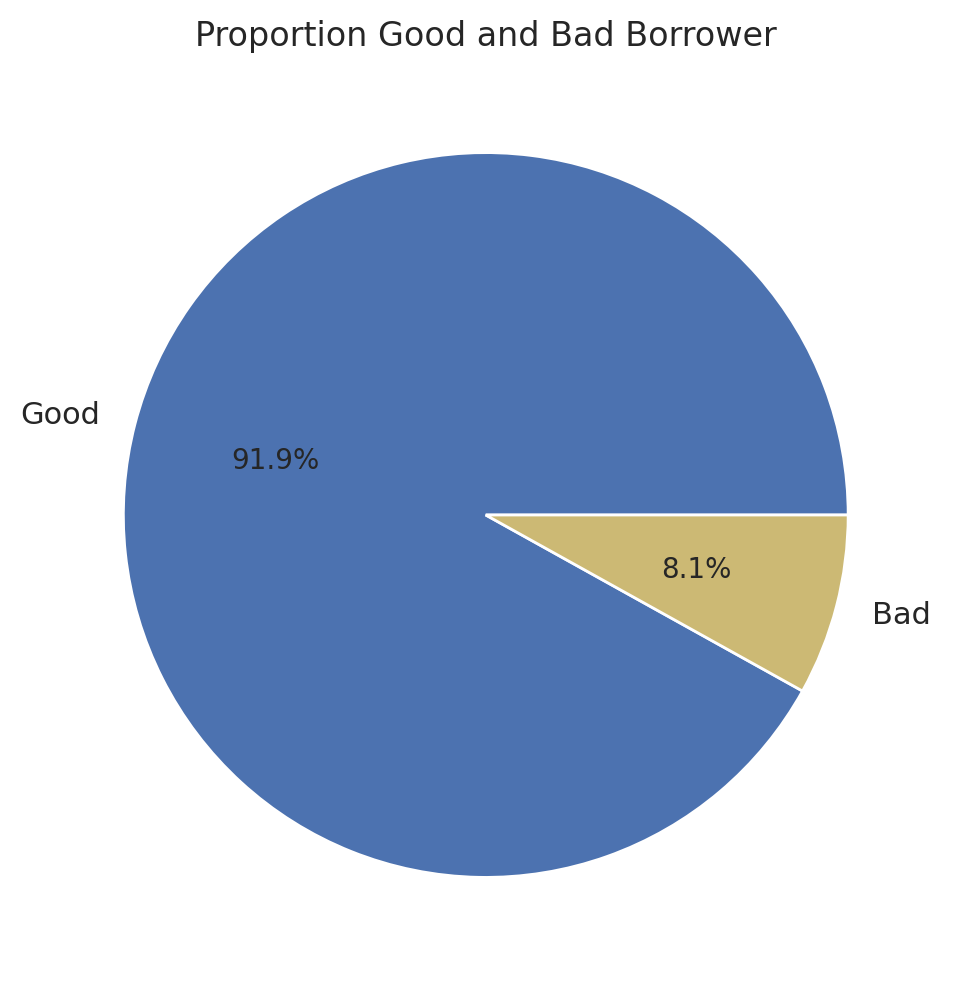

In [166]:
plt.figure(figsize=(8,6),dpi=100)
plt.title("Proportion Good and Bad Borrower",fontsize=12)
plt.pie(df_train['TARGET'].value_counts(),labels=["Good","Bad"],
       autopct='%1.1f%%',colors=["b","y"]);

**WOE** atau Weight of Evidence kita gunakan untuk mengukur antara nasabah baik dan buruk
nilai dari **WOE** ini akan digunakan untuk menghitung **IV** atau Infromation Value

In [167]:
import pandas as pd
import scipy.stats as stats

#categoric fitur dan continuous fiture

class CategoricalFeature():
    def __init__(self, df_train, feature):
        self.df = df_train
        self.feature = feature

    @property
    def df_lite(self):
        df_lite = self.df
        df_lite['bin'] = df_lite[self.feature].fillna('MISSING')
        return df_lite[['bin', 'TARGET']]


class ContinuousFeature():
    def __init__(self, df_train, feature):
        self.df = df_train
        self.feature = feature
        self.bin_min_size = int(len(self.df) * 0.05)

    def __generate_bins(self, bins_num):
        df_train = self.df[[self.feature, 'TARGET']]
        df_train['bin'] = pd.qcut(df_train[self.feature], bins_num, duplicates='drop') \
                    .apply(lambda x: x.left) \
                    .astype(float)
        return df_train

    def __generate_correct_bins(self, bins_max=20):
        for bins_num in range(bins_max, 1, -1):
            df_train = self.__generate_bins(bins_num)
            df_grouped = pd.DataFrame(df_train.groupby('bin') \
                                      .agg({self.feature: 'count',
                                            'TARGET': 'sum'})) \
                                      .reset_index()
            r, p = stats.stats.spearmanr(df_grouped['bin'], df_grouped['TARGET'])

            if (
                    abs(r)==1 and                                                        # periksa apakah WOE untuk tiap bin adalah monotonic
                    df_grouped[self.feature].min() > self.bin_min_size                   # periksa apakah size setiap bin besar dari 5%
                    and not (df_grouped[self.feature] == df_grouped['TARGET']).any()      # periksa apakah label Yes dan No jumlahnya adalah 0
            ):
                break

        return df_train

    @property
    def df_lite(self):
        df_lite = self.__generate_correct_bins()
        df_lite['bin'].fillna('MISSING', inplace=True)
        return df_lite[['bin', 'TARGET']]

Information Value kita gunakan untuk menghitung seberapa penting dan prediktif terhadap target

In [168]:
# Information Value
pd.set_option('mode.chained_assignment', None)

class AttributeRelevance():
    def seq_palette(self, n_colors):
        return sns.cubehelix_palette(n_colors, start=.5, rot=-.75, reverse=True)

    def bulk_iv(self, feats, iv, woe_extremes=False):
        iv_dict = {}
        for f in feats:
            iv_df, iv_value = iv.calculate_iv(f)
            if woe_extremes:
                iv_dict[f.feature] = [iv_value, iv_df['woe'].min(), iv_df['woe'].max()]
                cols = ['iv', 'woe_min', 'woe_max']
            else:
                iv_dict[f.feature] = iv_value
                cols = ['iv']
        df_train = pd.DataFrame.from_dict(iv_dict, orient='index', columns=cols)
        return df_train

    def bulk_stats(self, feats, s):
        stats_dict = {}
        for f in feats:
            p_value, effect_size = s.calculate_chi(f)
            stats_dict[f.feature] = [p_value, effect_size]
        df_train = pd.DataFrame.from_dict(stats_dict, orient='index', columns=['p-value', 'effect_size'])
        return df_train

    def analyze(self, feats, iv, s=None, interpretation=False):
        df_iv = self.bulk_iv(feats, iv).sort_values(by='iv', ascending=False)
        if s is not None:
            df_stats = self.bulk_stats(feats, s)
            df_iv = df_iv.merge(df_stats, left_index=True, right_index=True)
        if interpretation:
            df_iv['iv_interpretation'] = df_iv['iv'].apply(iv.interpretation)
            if s is not None:
                df_iv['es_interpretation'] = df_iv['effect_size'].apply(s.interpretation)
        return df_iv

    def draw_iv(self, feats, iv):
        df_train = self.analyze(feats, iv)
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.barplot(x=df_train.index, y='iv', data=df_train, palette=self.seq_palette(len(feats)))
        ax.set_title('IV values')
        plt.xticks(rotation=90)
        plt.show()

    def draw_woe_extremes(self, feats, iv):
        df_train = self.bulk_iv(feats, iv, woe_extremes=True).sort_values(by='iv', ascending=False)
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.barplot(x=df_train.index, y='woe_min', data=df_train, palette=self.seq_palette(len(feats)))
        sns.barplot(x=df_train.index, y='woe_max', data=df_train, palette=self.seq_palette(len(feats)))
        ax.axhline(y=0, color='black', linewidth=1)
        ax.set_title('Range of WOE values')
        ax.set_ylabel('WOE')
        plt.xticks(rotation=90)
        plt.show()

    def draw_woe_multiplot(self, feats, iv):
        n = len(feats)
        nrows = int(np.ceil(n/3))
        fig, ax = plt.subplots(nrows=nrows, ncols=3, figsize=(15, nrows*4))
        for i in range(n):
            iv_df, iv_value = iv.calculate_iv(feats[i])
            sns.barplot(x=feats[i].feature, y='woe', data=iv_df, color='#455872', ax=fig.axes[i])

        for ax in fig.axes:
            plt.sca(ax)
            plt.xticks(rotation=50)

        plt.tight_layout()
        plt.show()

class Analysis():
    def seq_palette(self, n_colors):
        return sns.cubehelix_palette(n_colors, start=.5, rot=-.75, reverse=True)

    def group_by_feature(self, feat):
        df_train = feat.df_lite \
                            .groupby('bin') \
                            .agg({'TARGET': ['count', 'sum']}) \
                            .reset_index()
        df_train.columns = [feat.feature, 'count', 'good']
        df_train['bad'] = df_train['count'] - df_train['good']
        return df_train

class StatsSignificance(Analysis):
    def calculate_chi(self, feat):
        df_train = self.group_by_feature(feat)
        df_chi = np.array(df_train[['good', 'bad']])
        n = df_train['count'].sum()

        chi = stats.chi2_contingency(df_chi)
        cramers_v = np.sqrt(chi[0] / n)          # assume that k=2 (good, bad)
        return chi[1], cramers_v

    @staticmethod
    def interpretation(cramers_v):
        if cramers_v < 0.1:
            return 'useless'
        elif cramers_v < 0.2:
            return 'weak'
        elif cramers_v < 0.4:
            return 'medium'
        elif cramers_v < 0.6:
            return 'strong'
        else:
            return 'very strong'

    def interpret_chi(self, feat):
        _, cramers_v = self.calculate_chi(feat)
        return self.interpretation(cramers_v)

    def print_chi(self, feat):
        p_value, cramers_v = self.calculate_chi(feat)
        print('P-value: %0.2f\nEffect size: %0.2f' % (p_value, cramers_v))
        print('%s is a %s predictor' % (feat.feature.capitalize(), self.interpretation(cramers_v)))


class IV(Analysis):
    @staticmethod
    def __perc_share(df_train, group_name):
        return df_train[group_name] / df_train[group_name].sum()

    def __calculate_perc_share(self, feat):
        df_train = self.group_by_feature(feat)
        df_train['perc_good'] = self.__perc_share(df_train, 'good')
        df_train['perc_bad'] = self.__perc_share(df_train, 'bad')
        df_train['perc_diff'] = df_train['perc_good'] - df_train['perc_bad']
        return df_train

    def __calculate_woe(self, feat):
        df_train = self.__calculate_perc_share(feat)
        df_train['woe'] = np.log(df_train['perc_good']/df_train['perc_bad'])
        df_train['woe'] = df_train['woe'].replace([np.inf, -np.inf], np.nan).fillna(0)
        return df_train

    def calculate_iv(self, feat):
        df_train = self.__calculate_woe(feat)
        df_train['iv'] = df_train['perc_diff'] * df_train['woe']
        return df_train, df_train['iv'].sum()

    def draw_woe(self, feat):
        iv_df, iv_value = self.calculate_iv(feat)
        fig, ax = plt.subplots(figsize=(10,6))
        sns.barplot(x=feat.feature, y='woe', data=iv_df, palette=self.seq_palette(len(iv_df.index)))
        ax.set_title('WOE visualization for: ' + feat.feature)
        plt.show()
        plt.show()

    @staticmethod
    def interpretation(iv):
        if iv < 0.02:
            return 'useless'
        elif iv < 0.1:
            return 'weak'
        elif iv < 0.3:
            return 'medium'
        elif iv < 0.5:
            return 'strong'
        else:
            return 'suspicious'

    def interpret_iv(self, feat):
        _, iv = self.calculate_iv(feat)
        return self.interpretation(iv)

    def print_iv(self, feat):
        _, iv = self.calculate_iv(feat)
        print('Information value: %0.2f' % iv)
        print('%s is a %s predictor' % (feat.feature.capitalize(), self.interpretation(iv)))

In [169]:
from pandas.core.dtypes.common import is_numeric_dtype
#selection feat
feats_dict = {}

for col in [c for c in df_train.columns if c != 'TARGET']:
  if is_numeric_dtype(df_train[col]):
    feats_dict[col] = ContinuousFeature(df_train,col)
  else :
    feats_dict[col] = CategoricalFeature(df_train,col)

feats = list(feats_dict.values())

In [170]:
iv = IV()
s = StatsSignificance()

ar = AttributeRelevance()


df_analysis = ar.analyze(feats, iv, s, interpretation=True)
display(df_analysis)

,iv,p-value,effect_size,iv_interpretation,es_interpretation
EXT_SOURCE_2,0.318686,0.0,0.163345,strong,weak
EXT_SOURCE_3,0.229972,0.0,0.125682,medium,weak
EXT_SOURCE_1,0.087776,0.0,0.072632,weak,useless
AGE,0.084936,0.0,0.078422,weak,useless
YEARS_EMPLOYED,0.074855,0.0,0.076269,weak,useless
...,...,...,...,...,...
Co-op apartment,0.000000,1.0,0.000000,useless,useless
House / apartment,0.000000,1.0,0.000000,useless,useless
Municipal apartment,0.000000,1.0,0.000000,useless,useless
Office apartment,0.000000,1.0,0.000000,useless,useless


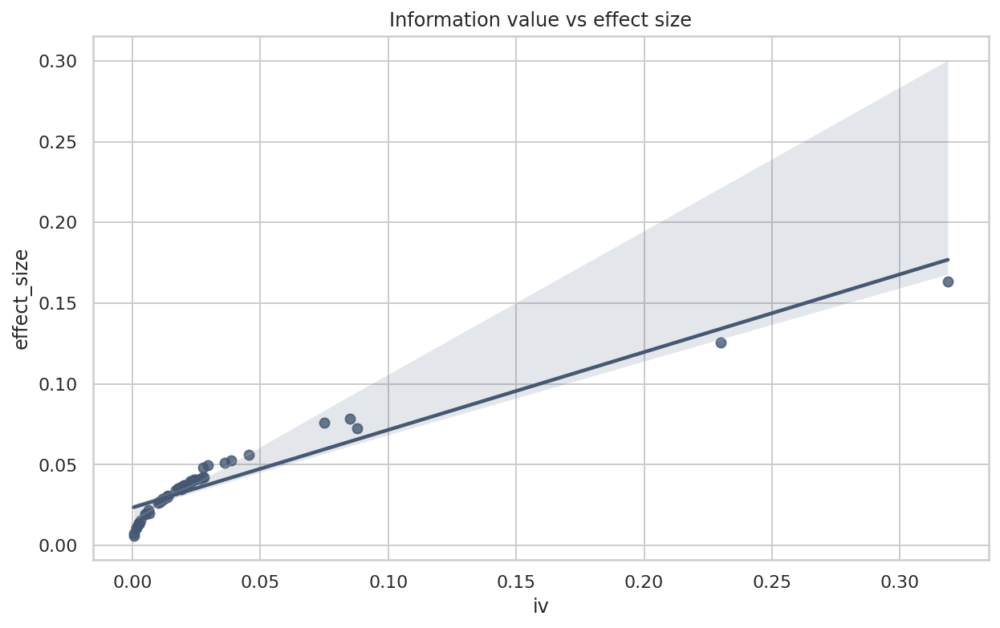

Pearson correlation: 0.95
Spearman correlation: 1.00


In [171]:
df_analysis_sign = df_analysis[df_analysis['p-value']<0.05]

fig, ax = plt.subplots(figsize=(10,6))
sns.regplot(x='iv', y='effect_size', data=df_analysis_sign, color='#455872')
ax.set_title('Information value vs effect size')
plt.show()

print('Pearson correlation: %0.2f' % df_analysis_sign['iv'].corr(df_analysis_sign['effect_size']))
print('Spearman correlation: %0.2f' % df_analysis_sign['iv'].corr(df_analysis_sign['effect_size'], method='spearman'))

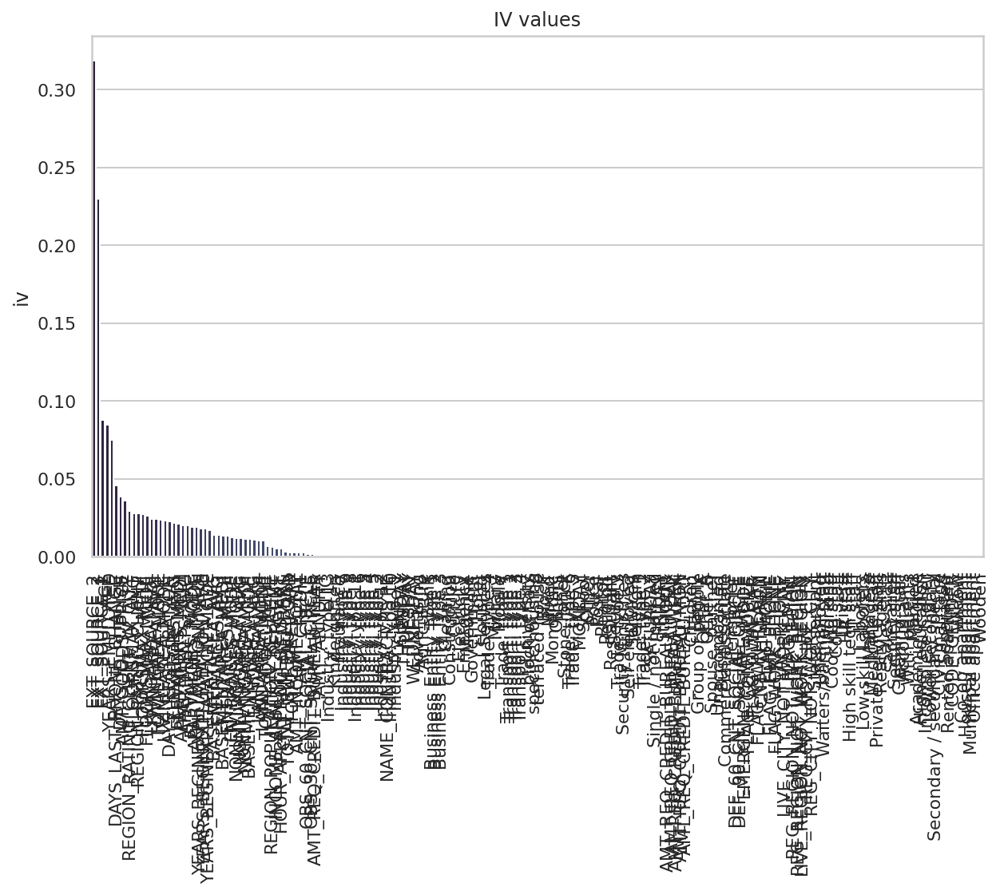

In [172]:
ar.draw_iv(feats, iv)

In [173]:
ar.draw_woe_multiplot(feats,iv)

In [174]:
#select fitur
feature_keep = df_analysis[df_analysis["iv"] > 0.01].index
feature_keep

Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'EXT_SOURCE_1', 'AGE', 'YEARS_EMPLOYED',
       'DAYS_LAST_PHONE_CHANGE', 'DAYS_ID_PUBLISH', 'AMT_GOODS_PRICE',
       'REGION_RATING_CLIENT_W_CITY', 'FLOORSMAX_AVG', 'REGION_RATING_CLIENT',
       'FLOORSMAX_MEDI', 'FLOORSMAX_MODE', 'LIVINGAREA_MEDI', 'LIVINGAREA_AVG',
       'TOTALAREA_MODE', 'LIVINGAREA_MODE', 'DAYS_REGISTRATION',
       'ELEVATORS_AVG', 'ELEVATORS_MEDI', 'APARTMENTS_MEDI', 'APARTMENTS_AVG',
       'ELEVATORS_MODE', 'APARTMENTS_MODE', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE',
       'BASEMENTAREA_AVG', 'ENTRANCES_AVG', 'BASEMENTAREA_MEDI',
       'ENTRANCES_MEDI', 'ENTRANCES_MODE', 'NONLIVINGAREA_MODE',
       'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MEDI', 'BASEMENTAREA_MODE',
       'LANDAREA_AVG', 'LANDAREA_MEDI', 'LANDAREA_MODE'],
      dtype='object')

In [175]:
feature_keep = ['EXT_SOURCE_2', 'EXT_SOURCE_3', 'EXT_SOURCE_1', 'AGE', 'YEARS_EMPLOYED',
       'DAYS_LAST_PHONE_CHANGE', 'DAYS_ID_PUBLISH', 'AMT_GOODS_PRICE',
       'REGION_RATING_CLIENT_W_CITY', 'FLOORSMAX_AVG', 'REGION_RATING_CLIENT',
       'FLOORSMAX_MEDI', 'FLOORSMAX_MODE', 'LIVINGAREA_MEDI', 'LIVINGAREA_AVG',
       'TOTALAREA_MODE', 'LIVINGAREA_MODE', 'DAYS_REGISTRATION',
       'ELEVATORS_AVG', 'ELEVATORS_MEDI', 'APARTMENTS_MEDI', 'APARTMENTS_AVG',
       'ELEVATORS_MODE', 'APARTMENTS_MODE', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE',
       'BASEMENTAREA_AVG', 'ENTRANCES_AVG', 'BASEMENTAREA_MEDI',
       'ENTRANCES_MEDI', 'ENTRANCES_MODE', 'NONLIVINGAREA_MODE',
       'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MEDI', 'BASEMENTAREA_MODE',
       'LANDAREA_AVG', 'LANDAREA_MEDI', 'LANDAREA_MODE','TARGET']

In [176]:
#for splitting
df_train = df_train[feature_keep]

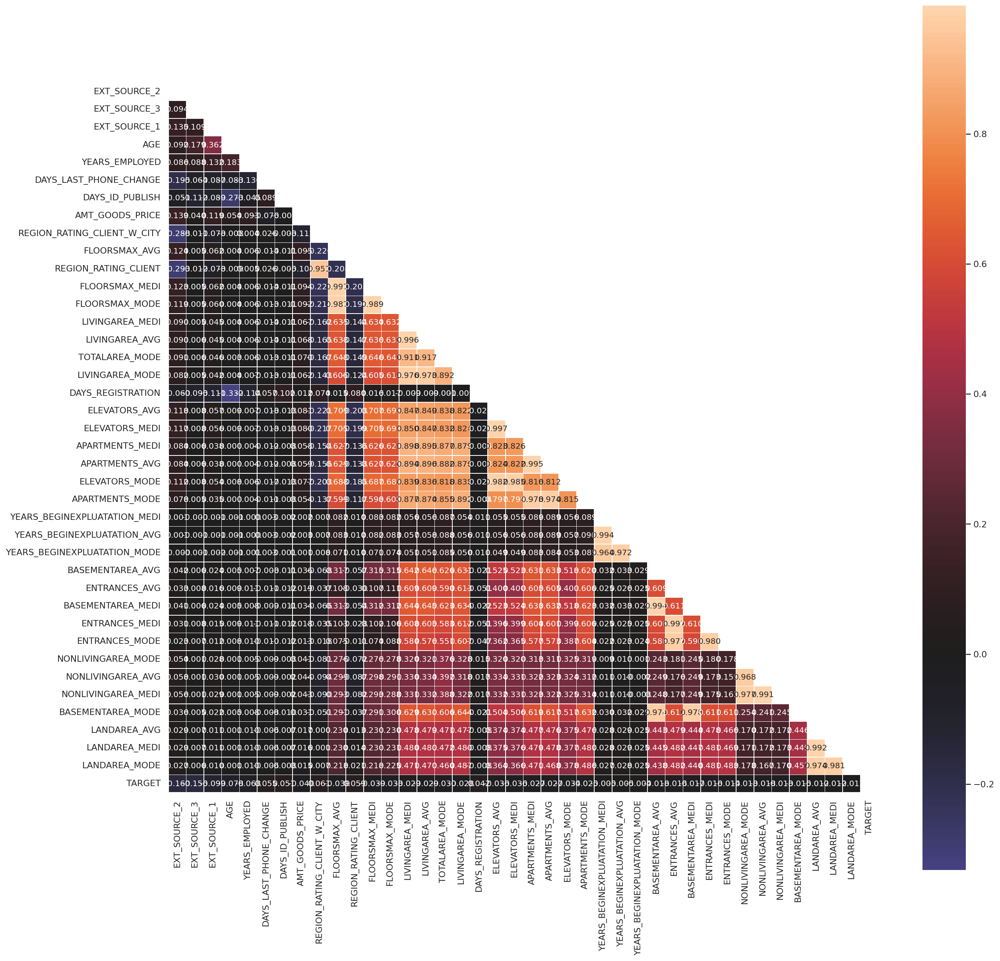

In [177]:
#check correlation
fig = plt.figure(figsize = (20,20))
matrix = np.triu(df_train.corr())
sns.heatmap(df_train.corr(), center = 0,
           fmt='.3f', square = True,
           annot = True, linewidth = 0.3, mask = matrix)
plt.show()

In [180]:
#make a binning data 
target = "TARGET"
bins = sc.woebin(df_train,target,monotonic_trend="auto_asc_desc")

[INFO] creating woe binning ...
Binning on 307511 rows and 40 columns in 00:01:27


{'AGE': <Figure size 432x288 with 2 Axes>,
 'AMT_GOODS_PRICE': <Figure size 432x288 with 2 Axes>,
 'APARTMENTS_AVG': <Figure size 432x288 with 2 Axes>,
 'APARTMENTS_MEDI': <Figure size 432x288 with 2 Axes>,
 'APARTMENTS_MODE': <Figure size 432x288 with 2 Axes>,
 'BASEMENTAREA_AVG': <Figure size 432x288 with 2 Axes>,
 'BASEMENTAREA_MEDI': <Figure size 432x288 with 2 Axes>,
 'BASEMENTAREA_MODE': <Figure size 432x288 with 2 Axes>,
 'DAYS_ID_PUBLISH': <Figure size 432x288 with 2 Axes>,
 'DAYS_LAST_PHONE_CHANGE': <Figure size 432x288 with 2 Axes>,
 'DAYS_REGISTRATION': <Figure size 432x288 with 2 Axes>,
 'ELEVATORS_AVG': <Figure size 432x288 with 2 Axes>,
 'ELEVATORS_MEDI': <Figure size 432x288 with 2 Axes>,
 'ELEVATORS_MODE': <Figure size 432x288 with 2 Axes>,
 'ENTRANCES_AVG': <Figure size 432x288 with 2 Axes>,
 'ENTRANCES_MEDI': <Figure size 432x288 with 2 Axes>,
 'ENTRANCES_MODE': <Figure size 432x288 with 2 Axes>,
 'EXT_SOURCE_1': <Figure size 432x288 with 2 Axes>,
 'EXT_SOURCE_2': <Fi

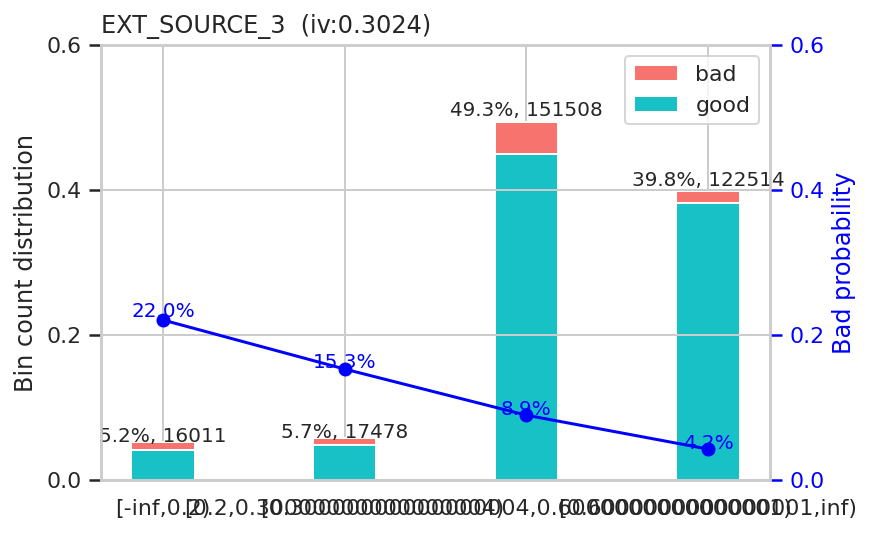

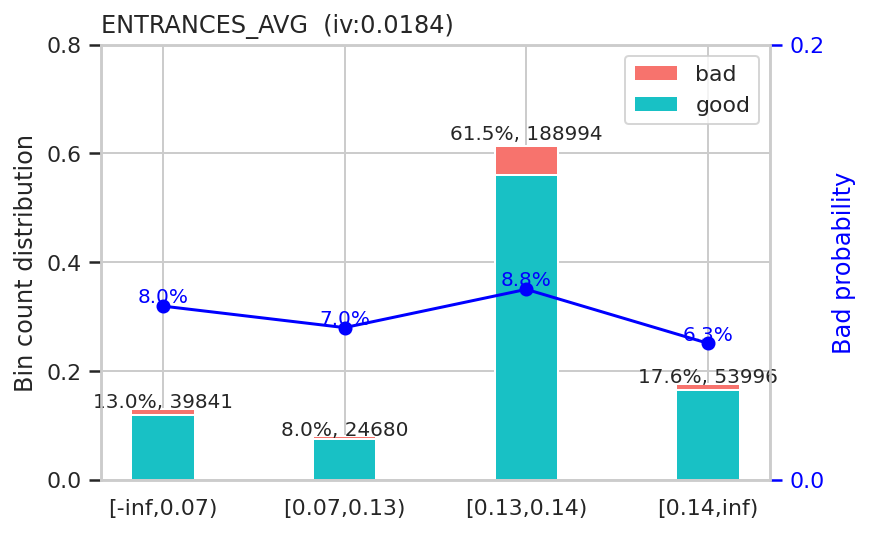

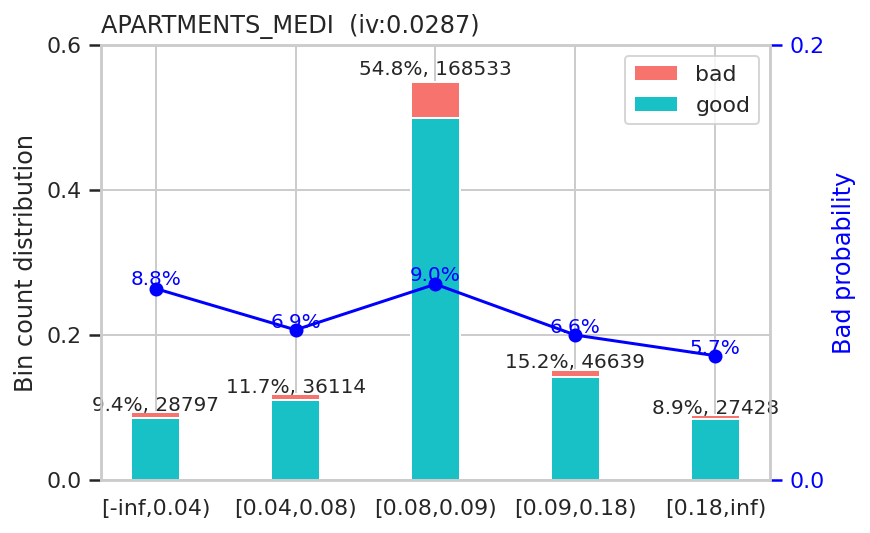

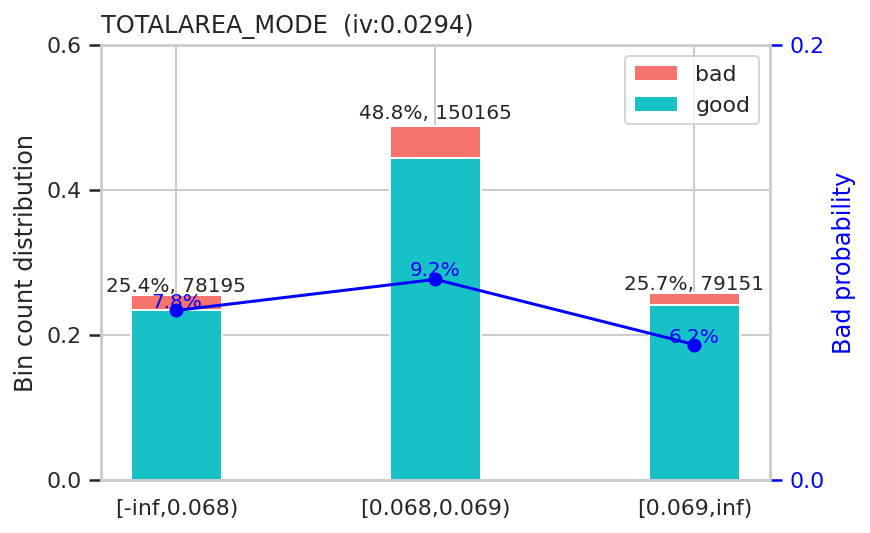

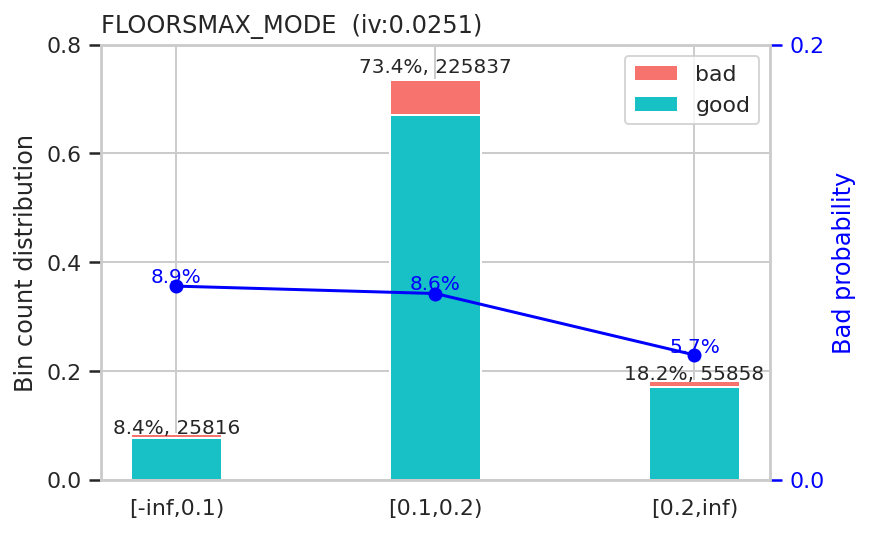

...

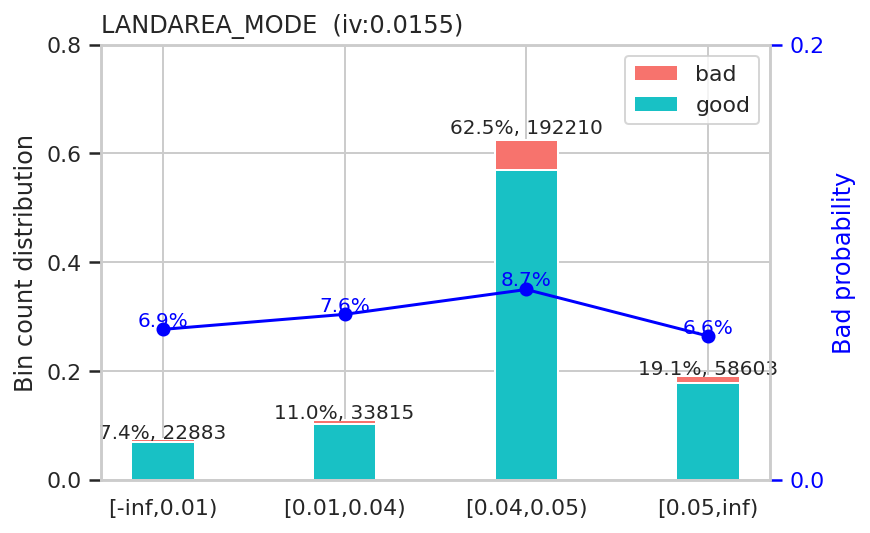

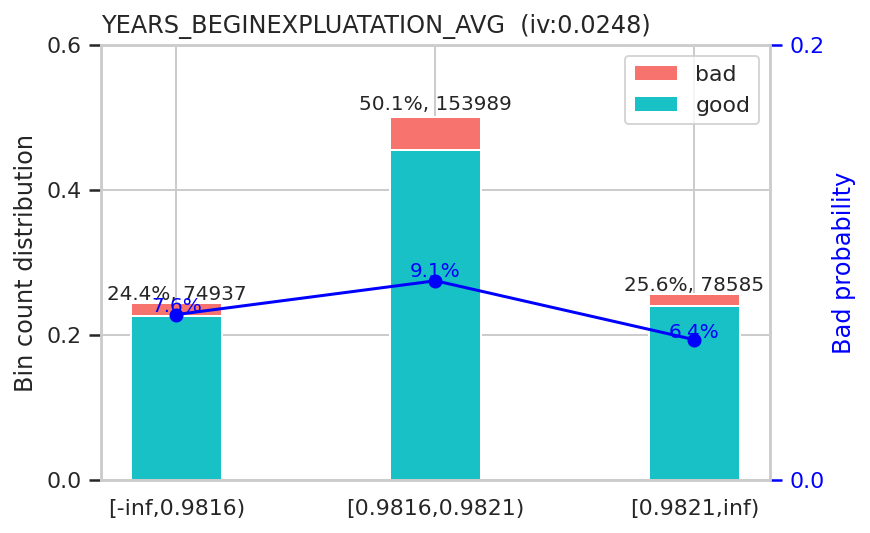

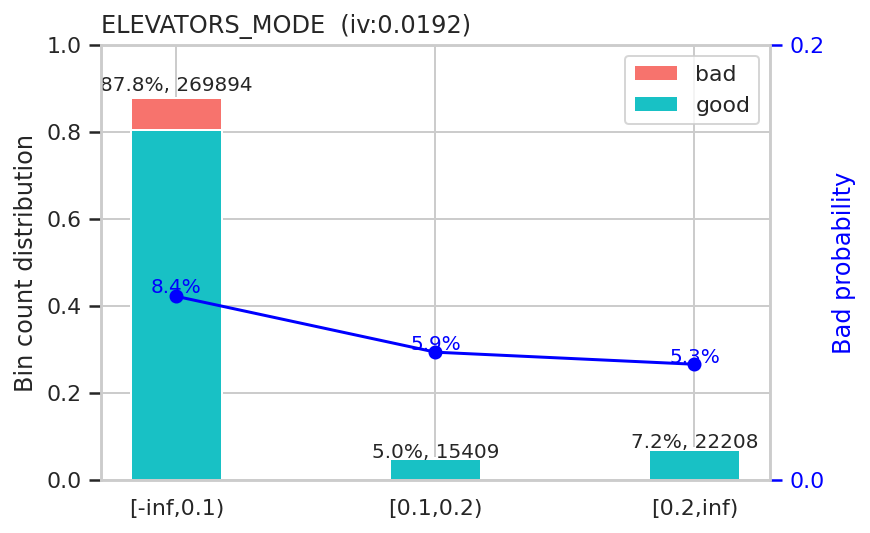

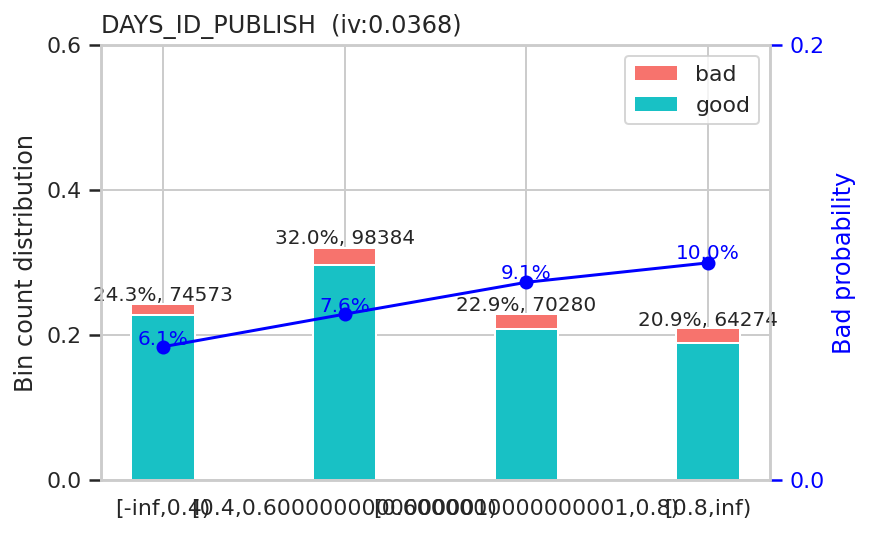

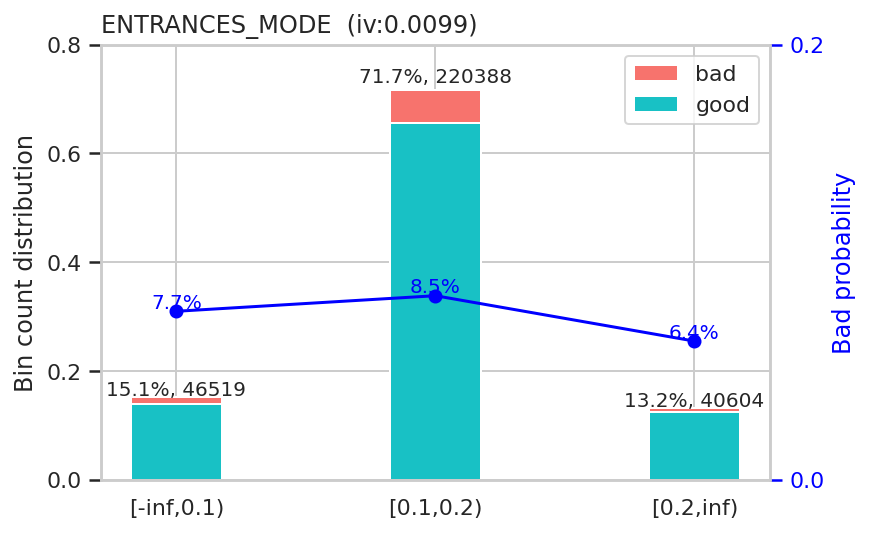

In [181]:
sc.woebin_plot(bins)

In [182]:
def woebin_plot_new(bins, x=None, title=None, show_iv=True):
    
    xs = x
    # bins concat 
    if isinstance(bins, dict):
        bins = pd.concat(bins, ignore_index=True)
    # good bad distr
    def gb_distr(binx):
        binx['good_distr'] = binx['good']/sum(binx['count'])
        binx['bad_distr'] = binx['bad']/sum(binx['count'])
        return binx
    bins = bins.groupby('variable').apply(gb_distr)
    # x variable names
    if xs is None: xs = bins['variable'].unique()
    # plot export
    plotlist = {}
    for i in xs:
        binx = bins[bins['variable'] == i].reset_index()
        plotlist[i] = plot_bin_new(binx, title, show_iv)
    return plotlist

In [183]:
def plot_bin_new(binx, title, show_iv):
  
    # y_right_max
    y_right_max = np.ceil(binx['badprob'].max()*10)
    if y_right_max % 2 == 1: y_right_max=y_right_max+1
    if y_right_max - binx['badprob'].max()*10 <= 0.3: y_right_max = y_right_max+2
    y_right_max = y_right_max/10
    if y_right_max>1 or y_right_max<=0 or y_right_max is np.nan or y_right_max is None: y_right_max=1
    ## y_left_max
    y_left_max = np.ceil(binx['count_distr'].max()*10)/10
    if y_left_max>1 or y_left_max<=0 or y_left_max is np.nan or y_left_max is None: y_left_max=1
    # title
    title_string = binx.loc[0,'variable']+"  (iv:"+str(round(binx.loc[0,'total_iv'],4))+")" if show_iv else binx.loc[0,'variable']
    title_string = title+'-'+title_string if title is not None else title_string
    # param
    ind = np.arange(len(binx.index))    # the x locations for the groups
    width = 0.5       # the width of the bars: can also be len(x) sequence
    ###### plot ###### 
    fig, ax1 = plt.subplots(figsize=(12,6))
    ax2 = ax1.twinx()
    # ax1
    p1 = ax1.bar(ind, binx['good_distr'], width, color=(24/254, 192/254, 196/254))
    p2 = ax1.bar(ind, binx['bad_distr'], width, bottom=binx['good_distr'], color=(246/254, 115/254, 109/254))
    for i in ind:
        ax1.text(i, binx.loc[i,'count_distr']*1.02, str(round(binx.loc[i,'count_distr']*100,1))+'%, '+str(binx.loc[i,'count']), ha='center')
    # ax2
    ax2.plot(ind, binx['badprob'], marker='o', color='blue')
    for i in ind:
        ax2.text(i, binx.loc[i,'badprob']*1.02, str(round(binx.loc[i,'badprob'], 2)) , color='blue', ha='center')
    # settings
    ax1.set_ylabel('Bin count distribution')
    ax2.set_ylabel('Bad Probability', color='blue')
    ax1.set_yticks(np.arange(0, y_left_max+0.2, 0.2))
    ax2.set_yticks(np.arange(0, y_right_max+0.2, 0.2))
    ax2.tick_params(axis='y', colors='blue')
    ax1.tick_params(axis='x', rotation=45)
    plt.xticks(ind, binx['bin'])
#     plt.xticks(rotation = 45)
#     plt.figure(figsize=(12,6))
    plt.rcParams['font.size'] = '14'
    plt.title(title_string, loc='left')
    plt.legend((p2[0], p1[0]), ('bad', 'good'), loc='upper right')
    # show plot 
    # plt.show()
    return fig

{'AGE': <Figure size 864x432 with 2 Axes>,
 'AMT_GOODS_PRICE': <Figure size 864x432 with 2 Axes>,
 'APARTMENTS_AVG': <Figure size 864x432 with 2 Axes>,
 'APARTMENTS_MEDI': <Figure size 864x432 with 2 Axes>,
 'APARTMENTS_MODE': <Figure size 864x432 with 2 Axes>,
 'BASEMENTAREA_AVG': <Figure size 864x432 with 2 Axes>,
 'BASEMENTAREA_MEDI': <Figure size 864x432 with 2 Axes>,
 'BASEMENTAREA_MODE': <Figure size 864x432 with 2 Axes>,
 'DAYS_ID_PUBLISH': <Figure size 864x432 with 2 Axes>,
 'DAYS_LAST_PHONE_CHANGE': <Figure size 864x432 with 2 Axes>,
 'DAYS_REGISTRATION': <Figure size 864x432 with 2 Axes>,
 'ELEVATORS_AVG': <Figure size 864x432 with 2 Axes>,
 'ELEVATORS_MEDI': <Figure size 864x432 with 2 Axes>,
 'ELEVATORS_MODE': <Figure size 864x432 with 2 Axes>,
 'ENTRANCES_AVG': <Figure size 864x432 with 2 Axes>,
 'ENTRANCES_MEDI': <Figure size 864x432 with 2 Axes>,
 'ENTRANCES_MODE': <Figure size 864x432 with 2 Axes>,
 'EXT_SOURCE_1': <Figure size 864x432 with 2 Axes>,
 'EXT_SOURCE_2': <Fi

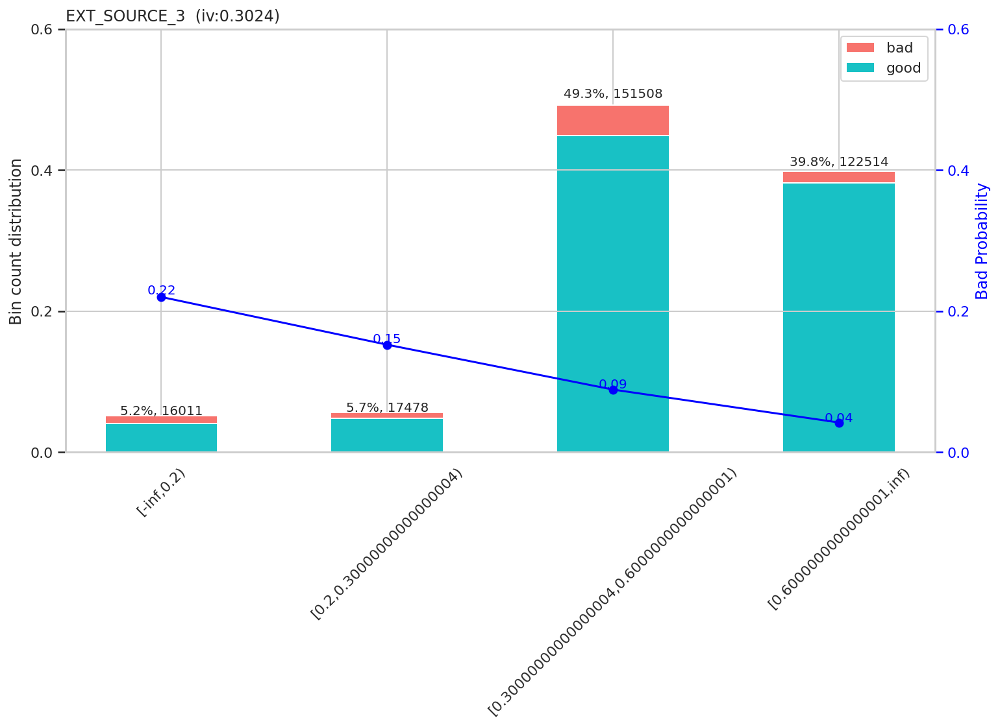

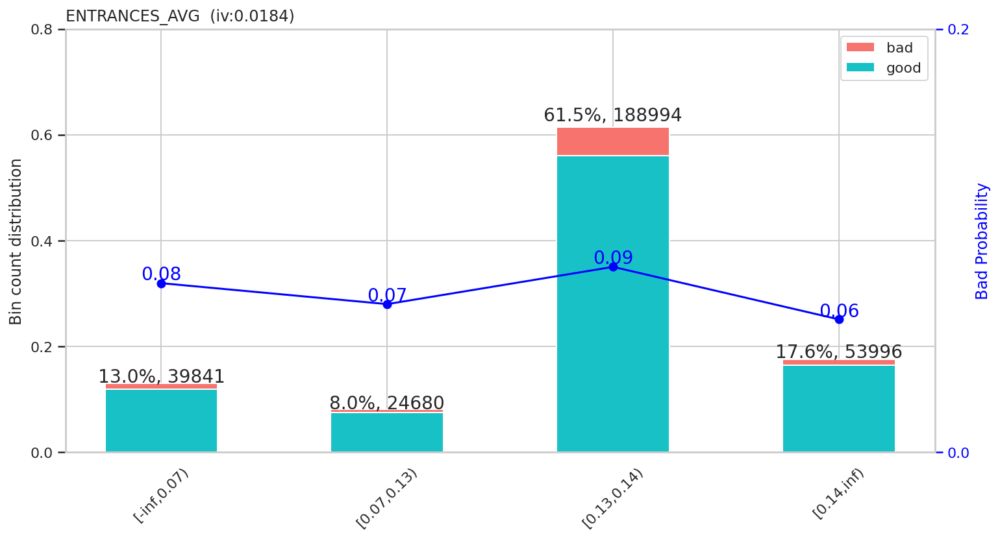

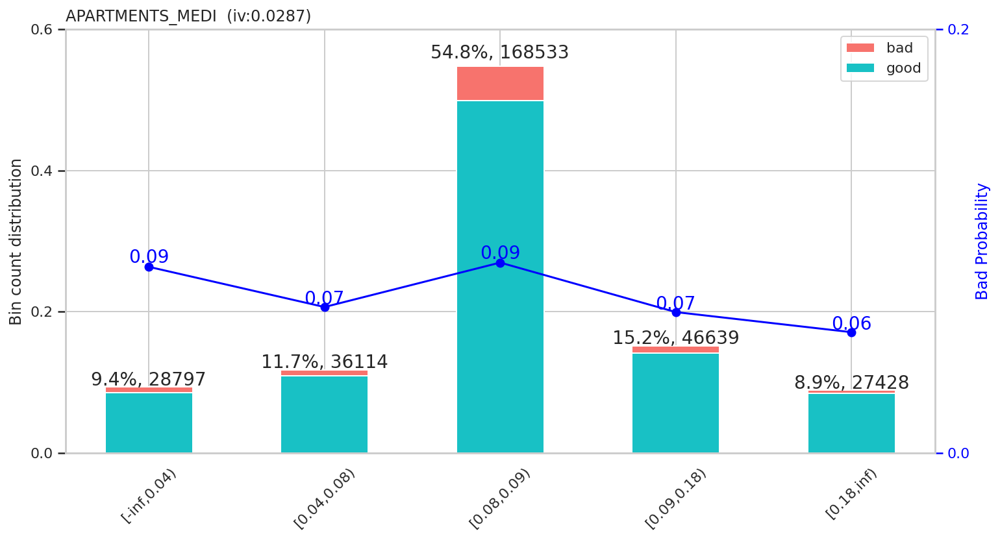

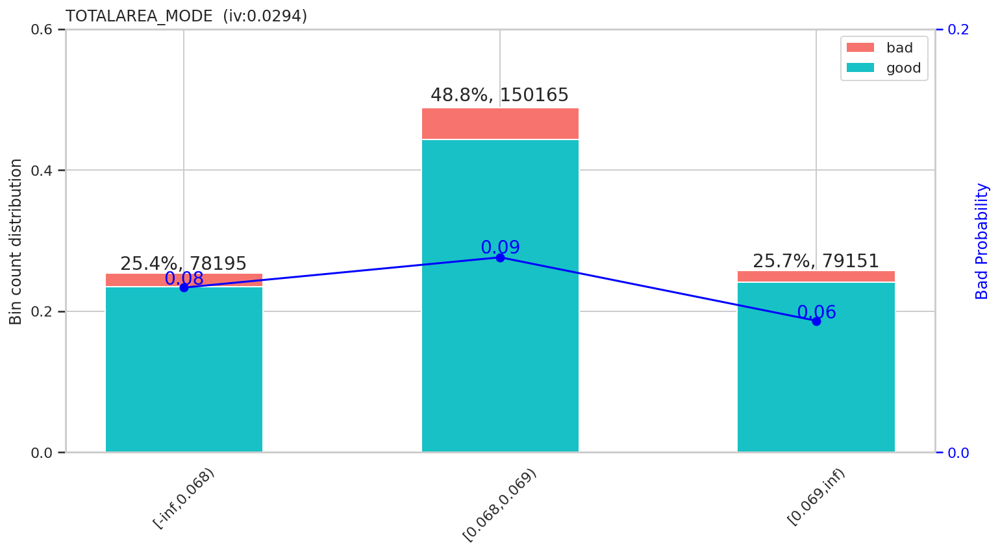

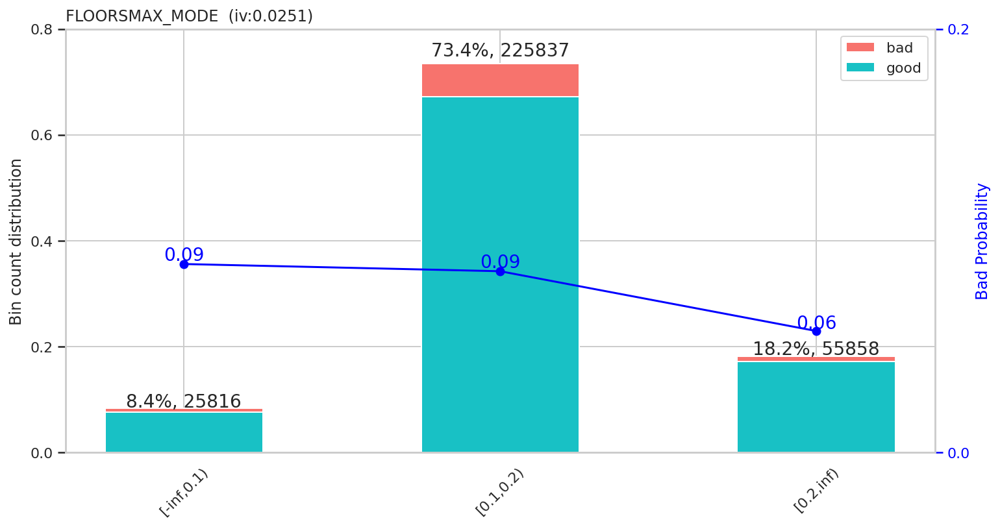

...

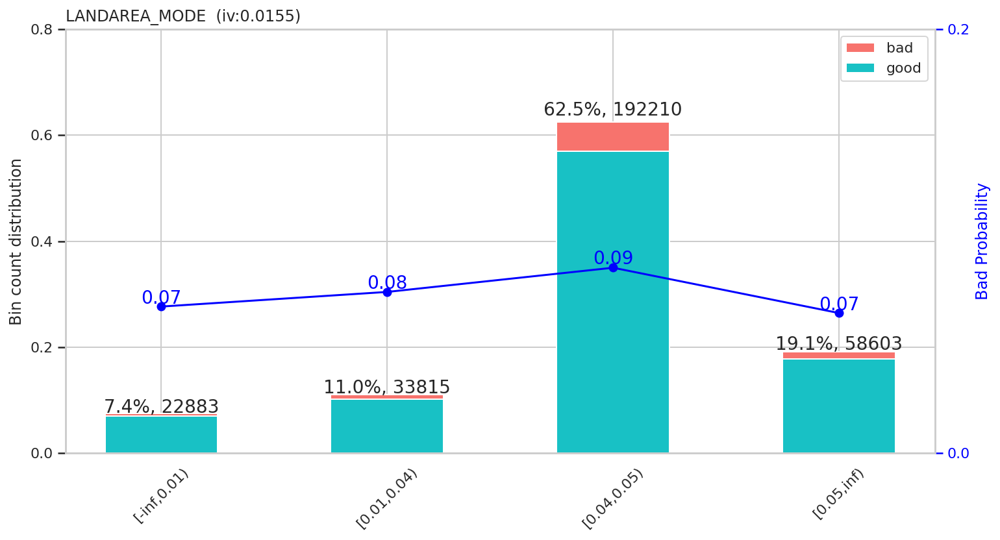

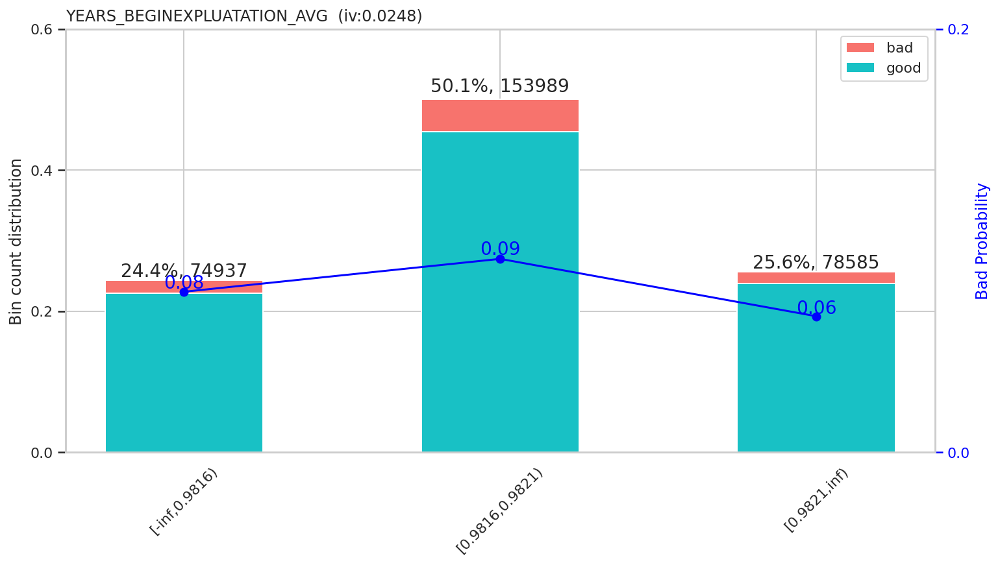

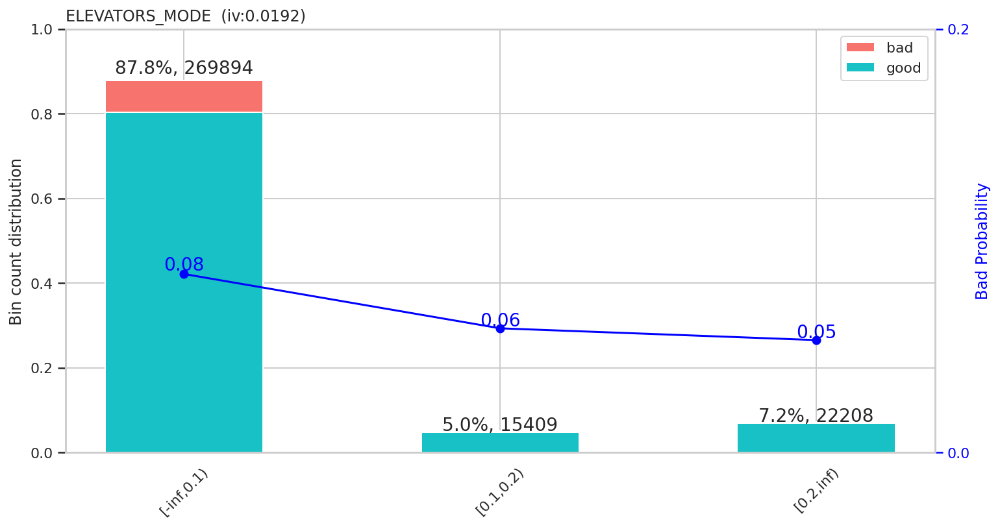

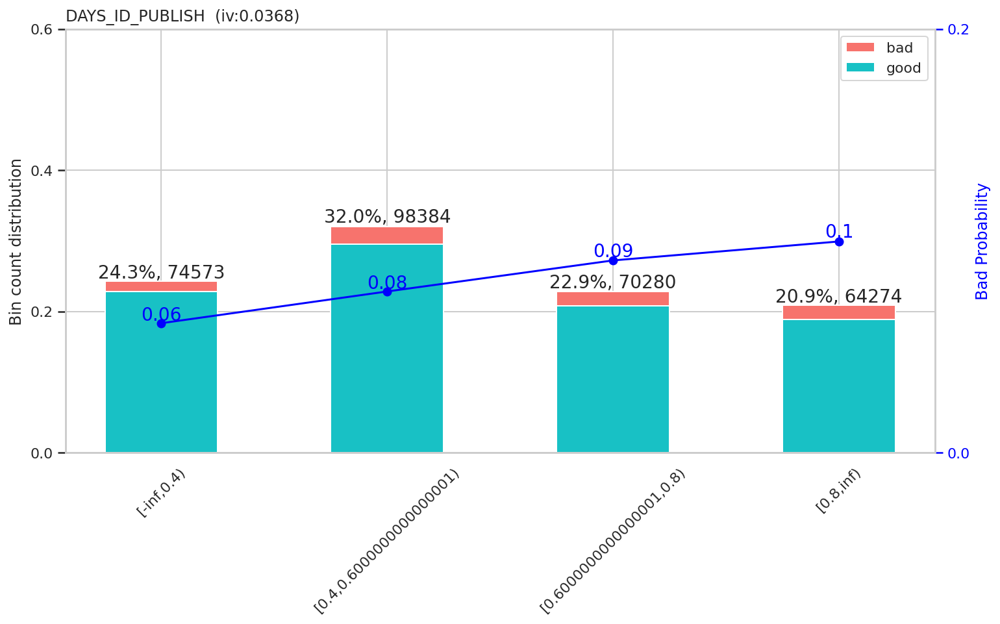

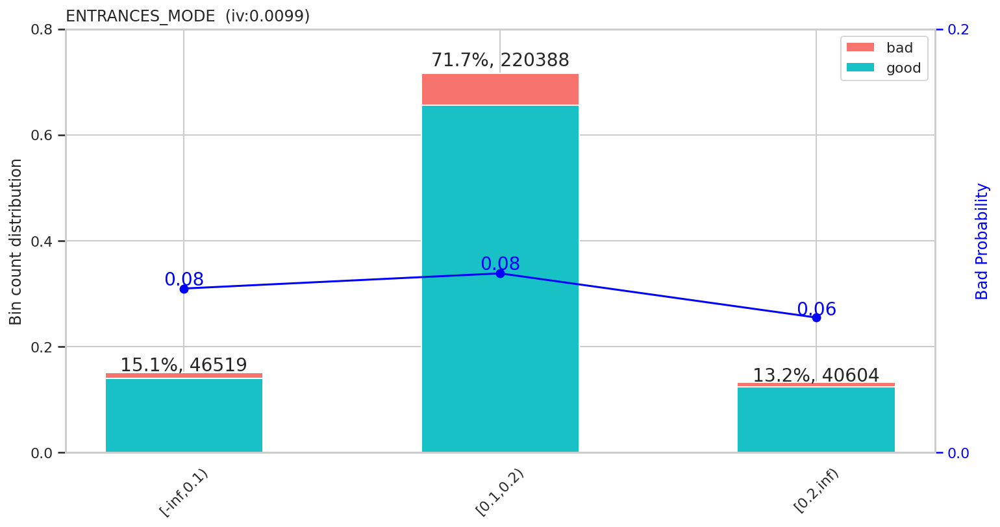

In [185]:
woebin_plot_new(bins)

In [188]:
#transsform to woe
df_train = sc.woebin_ply(df_train, bins)

[INFO] converting into woe values ...
Woe transformating on 307511 rows and 39 columns in 00:01:01


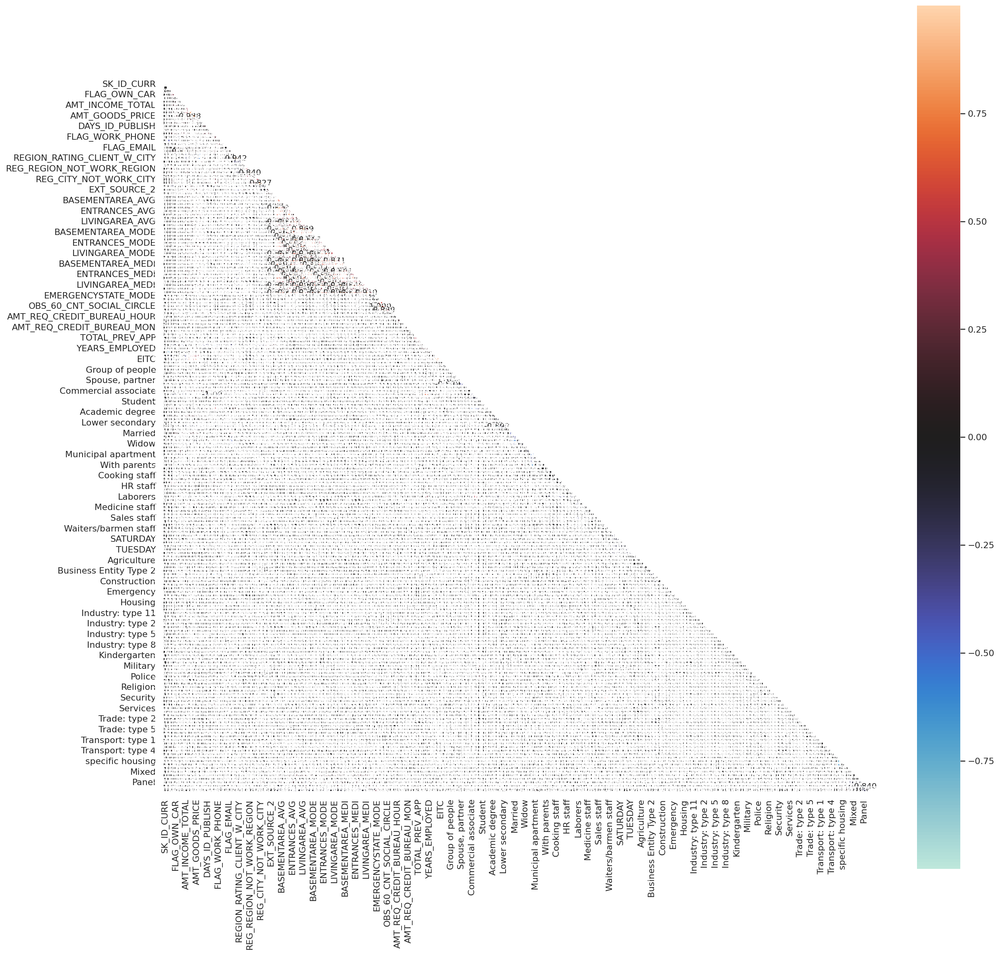

In [184]:
fig = plt.figure(figsize = (20,20))
matrix = np.triu(df.corr())
sns.heatmap(df.corr(), center = 0,
           fmt='.3f', square = True,
           annot = True, linewidth = 0.3, mask = matrix)
plt.show()

## Model Building

### Split Data

In [189]:
X = df_train.drop(columns = ['TARGET'])
Y = df_train[['TARGET']]
X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size = 0.2,random_state = 42)

In [190]:
X_train.shape

(246008, 39)

In [191]:
X_test.shape

(61503, 39)

In [192]:
y_train.shape

(246008, 1)

In [193]:
y_test.shape

(61503, 1)

### Imbalance Dataset

In [194]:
y_train['TARGET'].value_counts()

0    226132
1     19876
Name: TARGET, dtype: int64

In [195]:
x = X_train[[col for col in X_train.columns if (str(X_train[col].dtype) != 'object')]]
y = y_train['TARGET'].values
print(x.shape)
print(y.shape)

(246008, 39)
(246008,)


In [196]:
from imblearn.over_sampling import SMOTE
x_over_SMOTE, y_over_SMOTE = SMOTE(0.5).fit_resample(x, y)
print('SMOTE')
print(pd.Series(y_over_SMOTE).value_counts())

SMOTE
0    226132
1    113066
dtype: int64


In [197]:
data_train = x_over_SMOTE
data_train['TARGET'] = pd.DataFrame(y_over_SMOTE)

In [198]:
print('Original')
print(pd.Series(y).value_counts())
print('')
print('SMOTE')
print(pd.Series(y_over_SMOTE).value_counts())

Original
0    226132
1     19876
dtype: int64

SMOTE
0    226132
1    113066
dtype: int64


In [199]:
X_train = data_train.drop(columns = ['TARGET'])
y_train = data_train[['TARGET']]

In [200]:
def eval_classification(model, pred, xtrain, ytrain, xtest, ytest):
    print("Accuracy (Test Set): %.2f" % accuracy_score(ytest, pred))
    print("Precision (Test Set): %.2f" % precision_score(ytest, pred))
    print("Recall (Test Set): %.2f" % recall_score(ytest, pred))
    print("F1-Score (Test Set): %.2f" % f1_score(ytest, pred))
    
    fpr, tpr, thresholds = roc_curve(ytest, pred, pos_label=1) # pos_label: label yang kita anggap positive
    print("AUC: %.2f" % auc(fpr, tpr))

### Logistic Regression

In [201]:
logreg = LogisticRegression(random_state=42)
logreg.fit(X_train,y_train)

preds = logreg.predict(X_train)

accuracy = accuracy_score(preds,y_train)
print(accuracy)

0.7133650552184859


In [202]:
preds_test = logreg.predict(X_test)

accuracy = accuracy_score(preds_test,y_test)
print(accuracy)

0.8446092060549892


In [203]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_train,logreg.predict_proba(X_train)[:,1])
roc_auc_value = roc_auc_score(y_train, logreg.predict_proba(X_train)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC for Logistic Regression on val data: ', round(roc_auc_value*100, 2), '%')
print('Gini for Logistic Regression on val data: ', round(gini_value*100, 2), '%')

AUC for Logistic Regression on val data:  73.18 %
Gini for Logistic Regression on val data:  46.36 %


In [204]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,logreg.predict_proba(X_test)[:,1])
roc_auc_value = roc_auc_score(y_test, logreg.predict_proba(X_test)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC for Logistic Regression on val data: ', round(roc_auc_value*100, 2), '%')
print('Gini for Logistic Regression on val data: ', round(gini_value*100, 2), '%')

AUC for Logistic Regression on val data:  72.59 %
Gini for Logistic Regression on val data:  45.18 %


              precision    recall  f1-score   support

           0       0.74      0.89      0.81    226132
           1       0.62      0.36      0.46    113066

    accuracy                           0.71    339198
   macro avg       0.68      0.63      0.63    339198
weighted avg       0.70      0.71      0.69    339198



Text(30.5, 0.5, 'Realita')

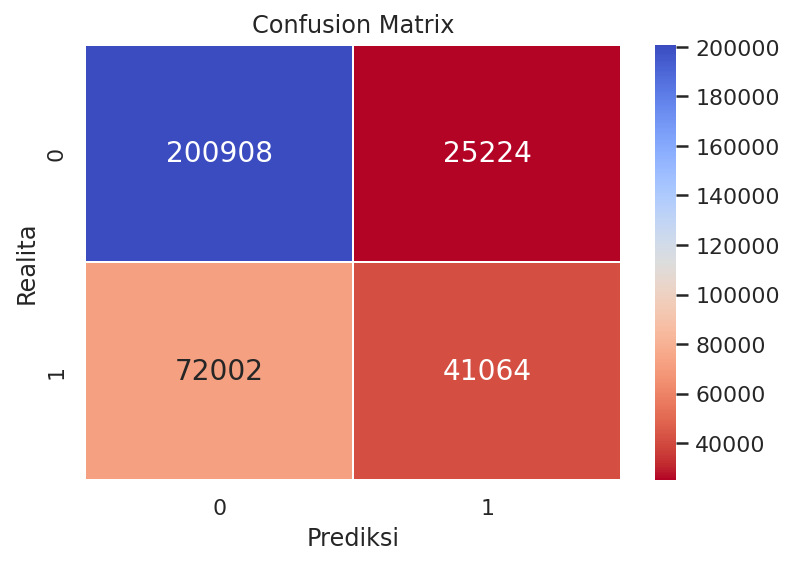

In [205]:
y_train_pred = logreg.predict(X_train)
cnf_matrix = metrics.confusion_matrix(y_train, y_train_pred)
print(metrics.classification_report(y_train, y_train_pred))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Prediksi')
plt.ylabel('Realita')

              precision    recall  f1-score   support

           0       0.94      0.89      0.91     56554
           1       0.22      0.35      0.27      4949

    accuracy                           0.84     61503
   macro avg       0.58      0.62      0.59     61503
weighted avg       0.88      0.84      0.86     61503



Text(30.5, 0.5, 'Realita')

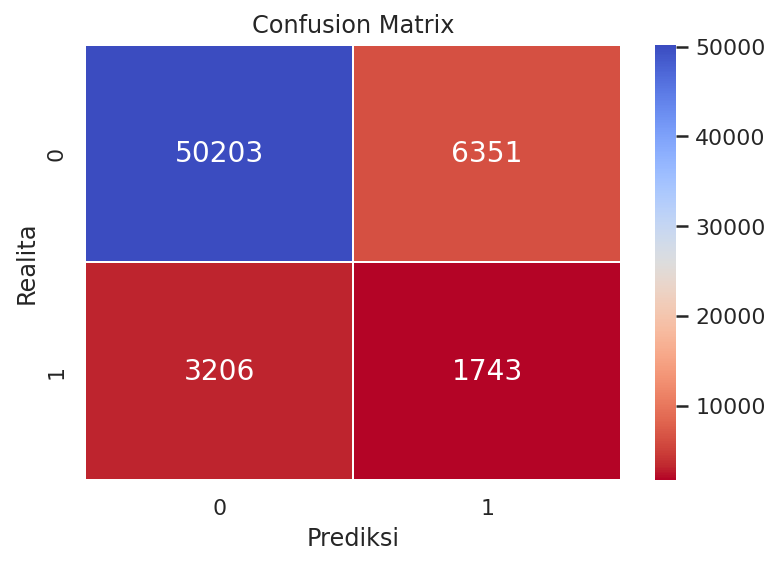

In [206]:
y_test_pred = logreg.predict(X_test)
cnf_matrix = metrics.confusion_matrix(y_test, y_test_pred)
print(metrics.classification_report(y_test,y_test_pred))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Prediksi')
plt.ylabel('Realita')

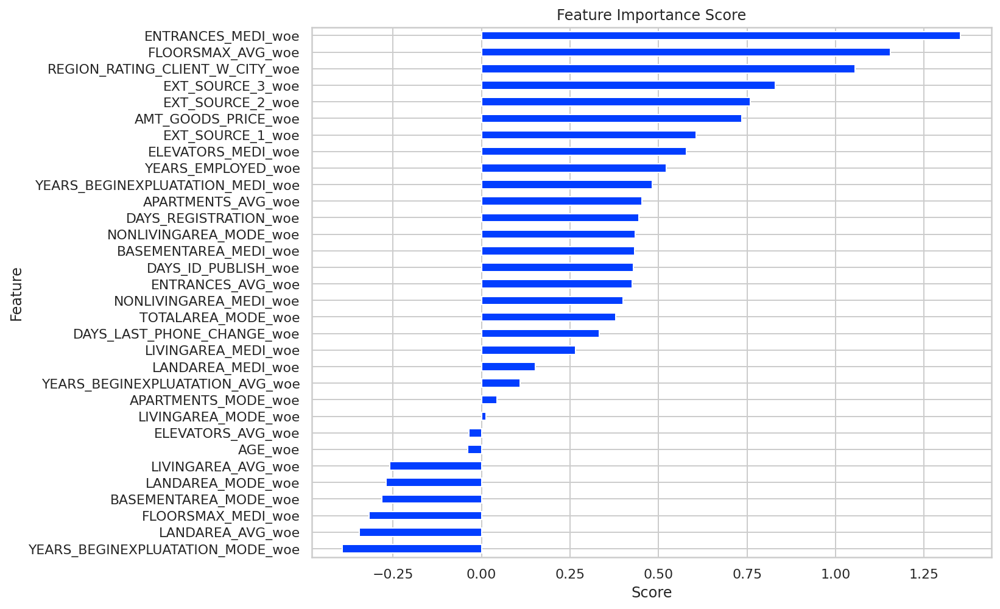

In [207]:
feat_importances = pd.Series(logreg.coef_[0], index=X.columns)
ax = feat_importances.nlargest(32).plot(kind='barh', figsize=(10, 8))
ax.invert_yaxis()

plt.xlabel('Score')
plt.ylabel('Feature')
plt.title('Feature Importance Score')
plt.show()

In [208]:
feat_importances.abs().sort_values(ascending = False)

ENTRANCES_MODE_woe                  1.488602
ENTRANCES_MEDI_woe                  1.352591
FLOORSMAX_AVG_woe                   1.155247
REGION_RATING_CLIENT_W_CITY_woe     1.055132
EXT_SOURCE_3_woe                    0.829525
REGION_RATING_CLIENT_woe            0.826863
EXT_SOURCE_2_woe                    0.759423
AMT_GOODS_PRICE_woe                 0.734589
ELEVATORS_MODE_woe                  0.697644
FLOORSMAX_MODE_woe                  0.609892
EXT_SOURCE_1_woe                    0.605830
ELEVATORS_MEDI_woe                  0.578991
YEARS_EMPLOYED_woe                  0.522165
APARTMENTS_MEDI_woe                 0.495646
YEARS_BEGINEXPLUATATION_MEDI_woe    0.483108
NONLIVINGAREA_AVG_woe               0.477457
APARTMENTS_AVG_woe                  0.453817
DAYS_REGISTRATION_woe               0.444327
NONLIVINGAREA_MODE_woe              0.434896
BASEMENTAREA_MEDI_woe               0.431814
DAYS_ID_PUBLISH_woe                 0.428268
ENTRANCES_AVG_woe                   0.425840
BASEMENTAR

In [209]:
#recursive Elimination
from sklearn.feature_selection import RFE
model = LogisticRegression(solver='lbfgs', max_iter=500)
rfe = RFE(model)
rfe = rfe.fit(X_train, y_train)

In [210]:
X_train.columns[rfe.support_]

Index(['EXT_SOURCE_3_woe', 'ENTRANCES_AVG_woe', 'FLOORSMAX_MODE_woe',
       'NONLIVINGAREA_MEDI_woe', 'ELEVATORS_MEDI_woe', 'EXT_SOURCE_1_woe',
       'REGION_RATING_CLIENT_W_CITY_woe', 'EXT_SOURCE_2_woe',
       'NONLIVINGAREA_AVG_woe', 'YEARS_EMPLOYED_woe', 'ENTRANCES_MEDI_woe',
       'NONLIVINGAREA_MODE_woe', 'FLOORSMAX_AVG_woe', 'AMT_GOODS_PRICE_woe',
       'DAYS_REGISTRATION_woe', 'REGION_RATING_CLIENT_woe',
       'ELEVATORS_MODE_woe', 'DAYS_ID_PUBLISH_woe', 'ENTRANCES_MODE_woe'],
      dtype='object')

In [211]:
X_train_new = X_train[X_train.columns[rfe.support_]]
X_test_new = X_test[X_test.columns[rfe.support_]]

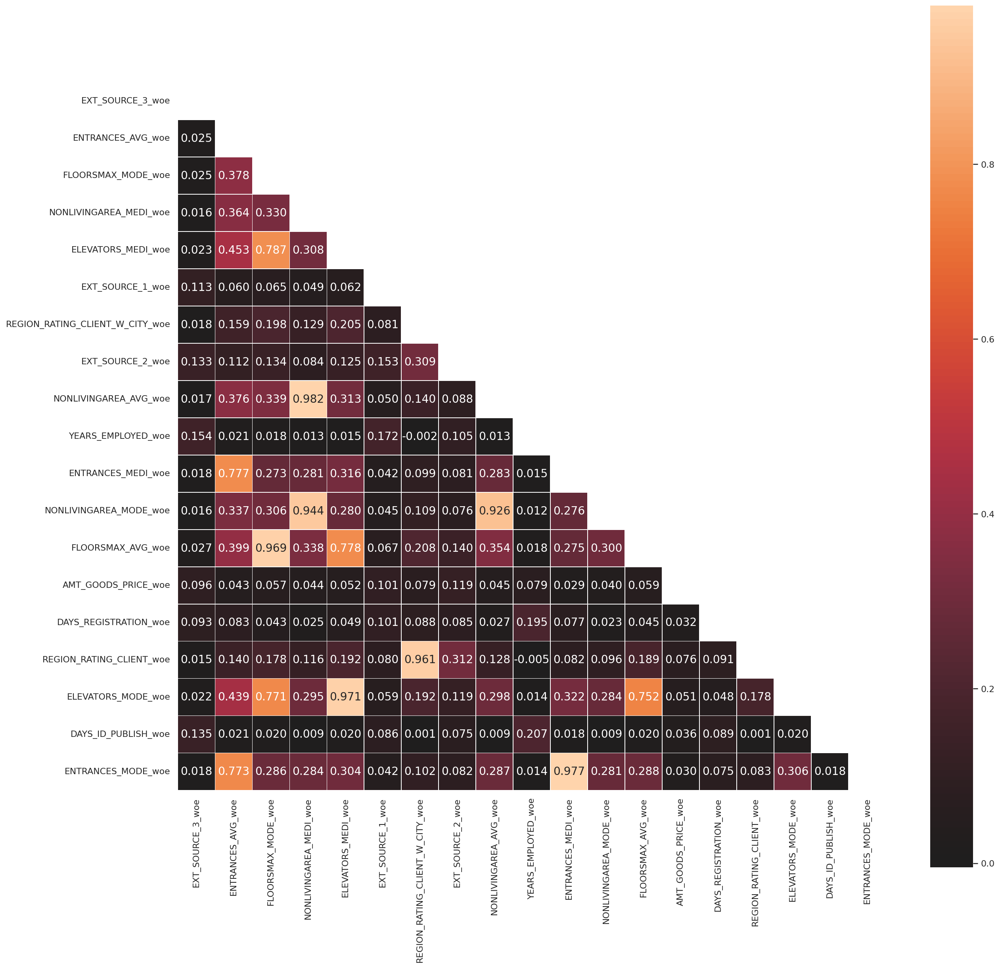

In [212]:
fig = plt.figure(figsize = (20,20))
matrix = np.triu(X_train_new.corr())
sns.heatmap(X_train_new.corr(), center = 0,
           fmt='.3f', square = True,
           annot = True, linewidth = 0.3, mask = matrix)
plt.show()

In [213]:
param_grid = {"penalty": ["l1","l2"],
             'C' : [1.0,2.0,3.0],
             'max_iter':[100,200,300,500],
             'solver' : ['newton-cg','lbfgs','sag','saga','liblinear'],
             }

model = LogisticRegression()#class_weight="balanced")
grid_search = RandomizedSearchCV(model,param_grid,cv=5)
grid_search.fit(X_train_new,y_train)

RandomizedSearchCV(cv=5, estimator=LogisticRegression(),
                   param_distributions={'C': [1.0, 2.0, 3.0],
                                        'max_iter': [100, 200, 300, 500],
                                        'penalty': ['l1', 'l2'],
                                        'solver': ['newton-cg', 'lbfgs', 'sag',
                                                   'saga', 'liblinear']})

In [214]:
grid_search.best_params_

{'C': 2.0, 'max_iter': 100, 'penalty': 'l2', 'solver': 'sag'}

In [215]:
y_train_pred = grid_search.best_estimator_.predict(X_train_new)
y_test_pred = grid_search.best_estimator_.predict(X_test_new)

In [216]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_train,grid_search.predict_proba(X_train_new)[:,1])
roc_auc_value = roc_auc_score(y_train, grid_search.predict_proba(X_train_new)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC for Logistic Regression on val data: ', round(roc_auc_value*100, 2), '%')
print('Gini for Logistic Regression on val data: ', round(gini_value*100, 2), '%')

AUC for Logistic Regression on val data:  73.06 %
Gini for Logistic Regression on val data:  46.12 %


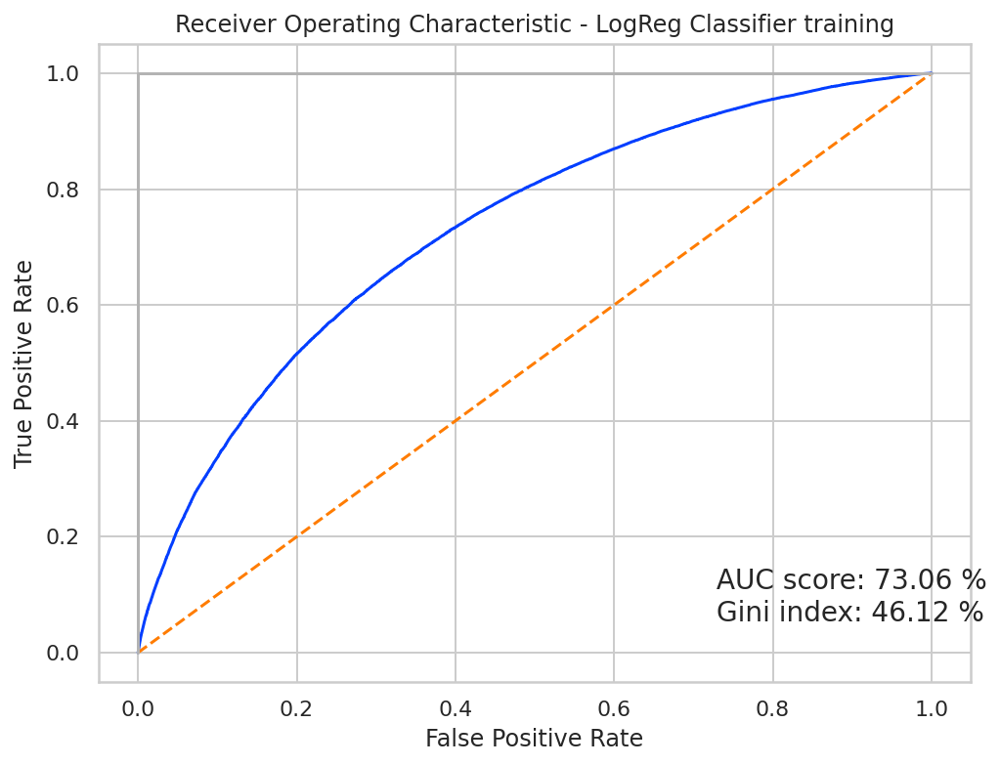

In [217]:
fig, ax = plt.subplots(1, figsize=(8,6))
plt.title('Receiver Operating Characteristic - LogReg Classifier training')
plt.plot(false_positive_rate, true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.text(ax.get_xlim()[1]*6/10, 
         0, 
         f"""\n
         AUC score: {round(roc_auc_value*100, 2)} %
         Gini index: {round(gini_value*100, 2)} %
         """)

plt.show()

In [218]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,grid_search.predict_proba(X_test_new)[:,1])
roc_auc_value = roc_auc_score(y_test, grid_search.predict_proba(X_test_new)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC for Logistic Regression on val data: ', round(roc_auc_value*100, 2), '%')
print('Gini for Logistic Regression on val data: ', round(gini_value*100, 2), '%')

AUC for Logistic Regression on val data:  72.59 %
Gini for Logistic Regression on val data:  45.18 %


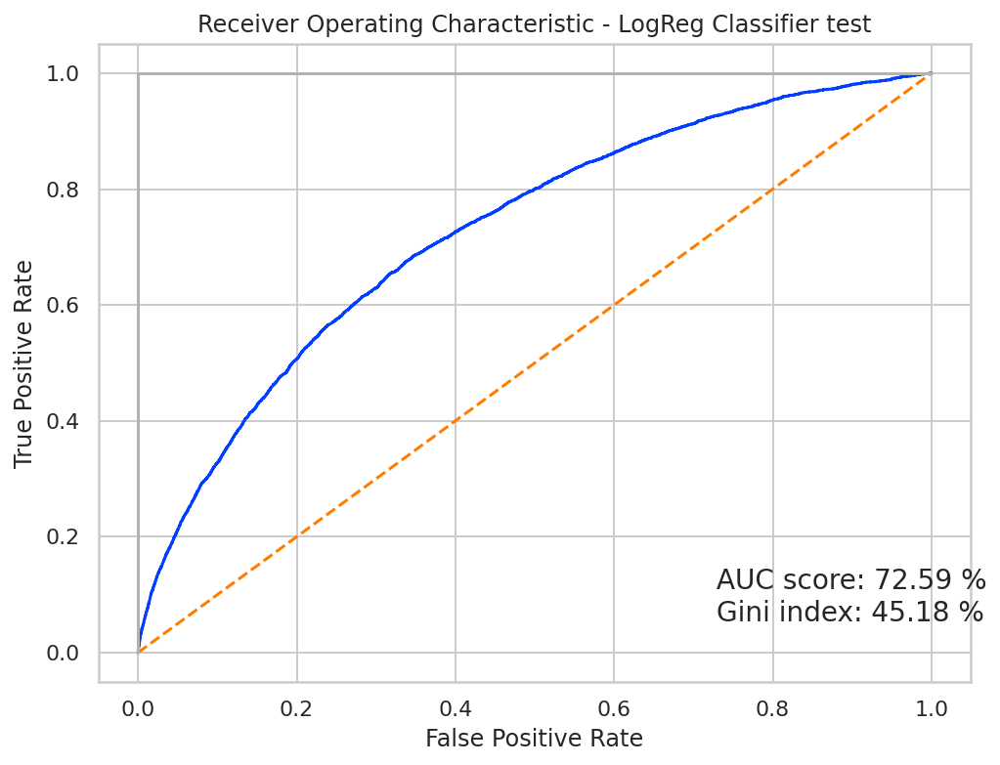

In [219]:
fig, ax = plt.subplots(1, figsize=(8,6))
plt.title('Receiver Operating Characteristic - LogReg Classifier test')
plt.plot(false_positive_rate, true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.text(ax.get_xlim()[1]*6/10, 
         0, 
         f"""\n
         AUC score: {round(roc_auc_value*100, 2)} %
         Gini index: {round(gini_value*100, 2)} %
         """)

plt.show()

              precision    recall  f1-score   support

           0       0.74      0.89      0.80    226132
           1       0.62      0.36      0.45    113066

    accuracy                           0.71    339198
   macro avg       0.68      0.62      0.63    339198
weighted avg       0.70      0.71      0.69    339198



Text(30.5, 0.5, 'Realita')

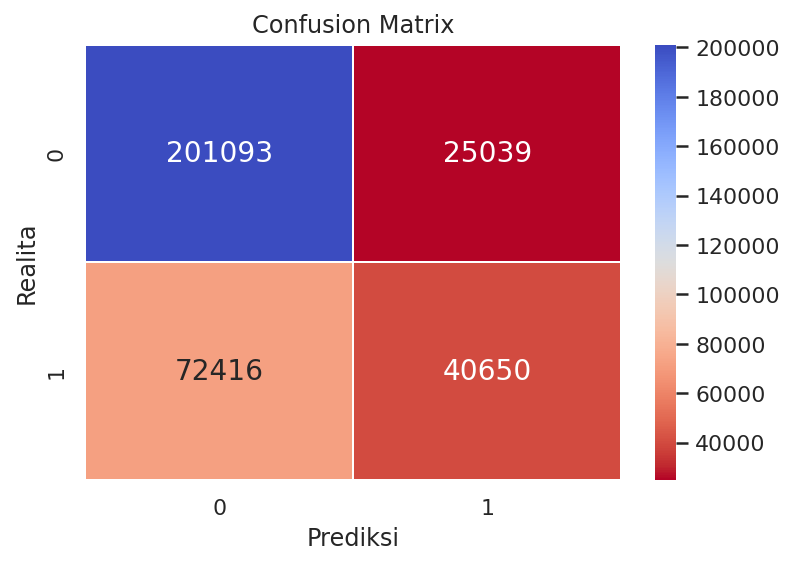

In [220]:
y_train_pred = grid_search.predict(X_train_new)
cnf_matrix = metrics.confusion_matrix(y_train, y_train_pred)
print(metrics.classification_report(y_train, y_train_pred))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Prediksi')
plt.ylabel('Realita')

              precision    recall  f1-score   support

           0       0.94      0.89      0.91     56554
           1       0.22      0.35      0.27      4949

    accuracy                           0.85     61503
   macro avg       0.58      0.62      0.59     61503
weighted avg       0.88      0.85      0.86     61503



Text(30.5, 0.5, 'Realita')

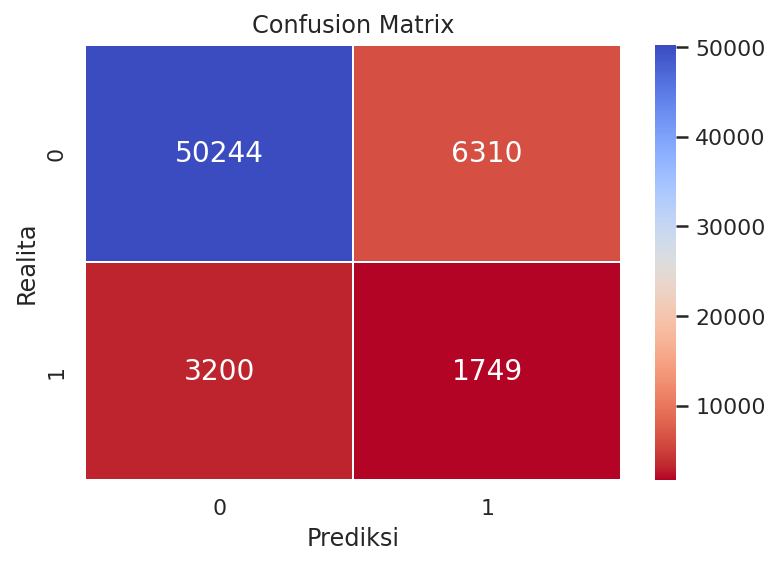

In [221]:
y_test_pred = grid_search.predict(X_test_new)
cnf_matrix = metrics.confusion_matrix(y_test, y_test_pred)
print(metrics.classification_report(y_test,y_test_pred))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Prediksi')
plt.ylabel('Realita')

Dari hasil model, terlihat bahwa Bad borrower masih cukup banyak yang terhitung sebagai good borrowe sehingga kita perlu menurunkan hal ini, dengan cara mencari cut proba terbaik untuk meningkatkan recall dari model

### CUT OFF

In [222]:
data_train = pd.DataFrame()
data_test = pd.DataFrame()

In [223]:
data_train["proba"] = grid_search.predict_proba(X_train_new)[:,1]
data_test["proba"] = grid_search.predict_proba(X_test_new)[:,1]

In [224]:
data_train["label"] = pd.DataFrame(y_train).reset_index(drop=True)
data_test["label"] = pd.DataFrame(y_test).reset_index(drop=True)

In [225]:
data_test_split_proba = data_test[['label', 'proba']]
data_test_split_proba['bins'] = pd.qcut(data_test_split_proba['proba'], q=8)
#data_test_split_proba['bins'] = pd.cut(data_test_split_proba['proba'], bins=[0.010499999999999999, 0.085, 0.188, 0.331, 0.4,0.548, 0.943])
data_test_split_proba.head()

,label,proba,bins
0,0,0.502872,"(0.399, 0.507]"
1,0,0.248032,"(0.213, 0.264]"
2,0,0.545812,"(0.507, 0.9]"
3,0,0.074064,"(0.011099999999999999, 0.119]"
4,0,0.167511,"(0.166, 0.213]"


In [226]:
cnt_per_bin2 = data_test_split_proba.bins.value_counts().to_frame().reset_index().rename(columns={'bins':'cnt_debtors'}).sort_values('index')
cnt_per_bin2.head()

,index,cnt_debtors
1,"(0.011099999999999999, 0.119]",7689
5,"(0.119, 0.166]",7687
2,"(0.166, 0.213]",7688
0,"(0.213, 0.264]",7694
7,"(0.264, 0.325]",7682


In [227]:
bad_per_bin2 = data_test_split_proba.groupby(['bins','label']).count().reset_index().rename(columns={'proba':'cnt_bad_debtors'})
bad_per_bin2 = bad_per_bin2[bad_per_bin2['label']==0]
bad_per_bin2.head()

,bins,label,cnt_bad_debtors
0,"(0.011099999999999999, 0.119]",0,7550
2,"(0.119, 0.166]",0,7471
4,"(0.166, 0.213]",0,7376
6,"(0.213, 0.264]",0,7281
8,"(0.264, 0.325]",0,7202


In [228]:
summary2 = bad_per_bin2.merge(cnt_per_bin2, how='inner', right_on='index', left_on='bins')
summary2['pct_bad_average'] = round((summary2['cnt_bad_debtors'] / summary2['cnt_debtors'])*100 , 2)
summary2.head()

,bins,label,cnt_bad_debtors,index,cnt_debtors,pct_bad_average
0,"(0.011099999999999999, 0.119]",0,7550,"(0.011099999999999999, 0.119]",7689,98.19
1,"(0.119, 0.166]",0,7471,"(0.119, 0.166]",7687,97.19
2,"(0.166, 0.213]",0,7376,"(0.166, 0.213]",7688,95.94
3,"(0.213, 0.264]",0,7281,"(0.213, 0.264]",7694,94.63
4,"(0.264, 0.325]",0,7202,"(0.264, 0.325]",7682,93.75


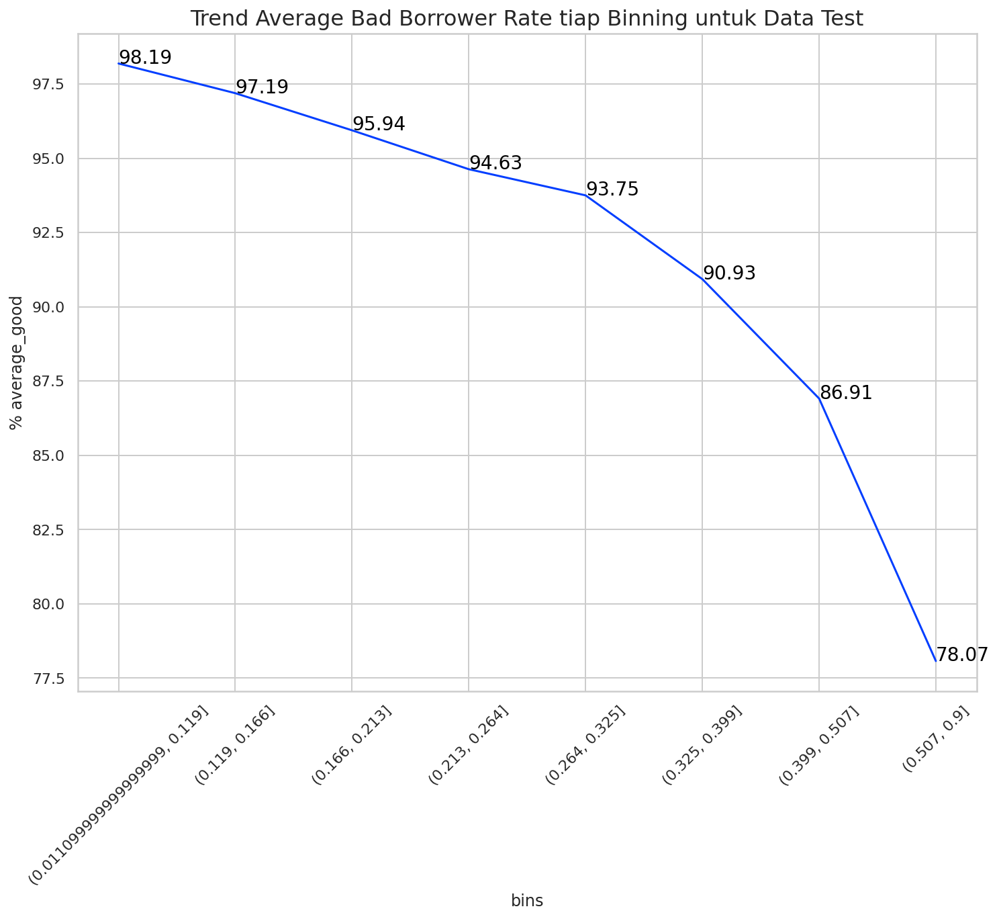

In [229]:
summary2['bins'] = summary2.bins.astype(str)
plt.figure(figsize=(12,9))
sns.lineplot(data = summary2, x='bins', y='pct_bad_average')
plt.xticks(rotation=45)
plt.ylabel('% average_good')
plt.title("Trend Average Bad Borrower Rate tiap Binning untuk Data Test", size=16)
# label points on the plot
for x, y in zip(summary2['bins'], summary2['pct_bad_average']):# the position of the data label relative to the data point can be adjusted by adding/subtracting a value from the x &/ y coordinates
    plt.text(x = x, # x-coordinate position of data label
             y = y+0.001,
             s = '{:.2f}'.format(y), # data label, formatted to ignore decimals
             color = 'black') # set colour of line# y

              precision    recall  f1-score   support

           0       0.87      0.34      0.49    226132
           1       0.41      0.90      0.56    113066

    accuracy                           0.53    339198
   macro avg       0.64      0.62      0.53    339198
weighted avg       0.72      0.53      0.51    339198



Text(30.5, 0.5, 'Realita')

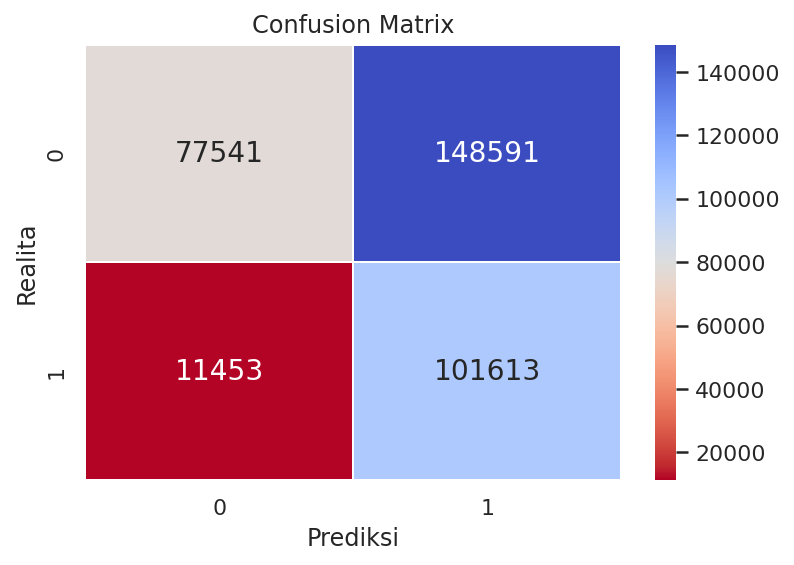

In [230]:
tr = 0.193
y_train_pred = np.where(grid_search.predict_proba(X_train_new)[:,1]> tr,1,0)
cnf_matrix = metrics.confusion_matrix(y_train, y_train_pred)
print(metrics.classification_report(y_train, y_train_pred))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Prediksi')
plt.ylabel('Realita')

              precision    recall  f1-score   support

           0       0.95      0.77      0.85     56554
           1       0.17      0.56      0.26      4949

    accuracy                           0.75     61503
   macro avg       0.56      0.66      0.56     61503
weighted avg       0.89      0.75      0.80     61503



Text(30.5, 0.5, 'Realita')

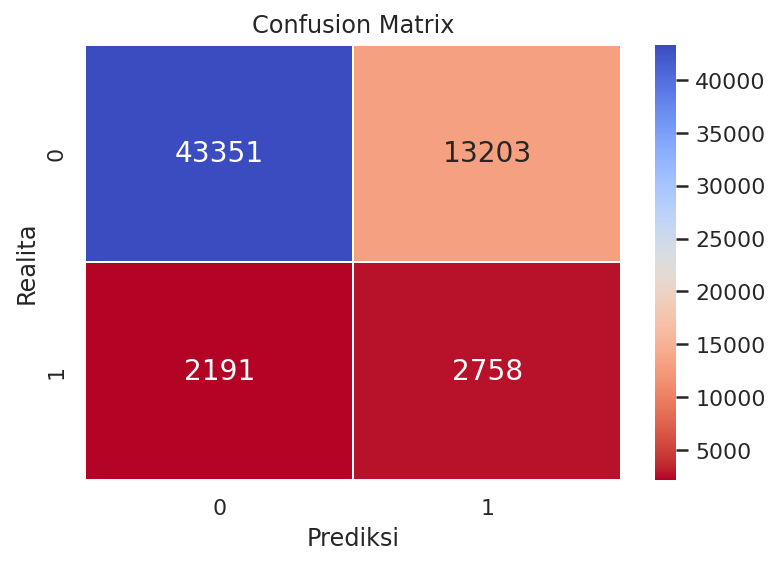

In [231]:
tr = 0.392
y_test_pred = np.where(grid_search.predict_proba(X_test_new)[:,1]> tr,1,0)
cnf_matrix = metrics.confusion_matrix(y_test, y_test_pred)
print(metrics.classification_report(y_test,y_test_pred))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Prediksi')
plt.ylabel('Realita')

dengan mengambil titik cut off proba di 0.132, model telah berhasil menurukan nilai dari bad borrower yang terhitung sebagai good borrower dengan sangat baik. hal ini sangat diperlukan mengingat ketika perusahaan telah memiliki nama yang besar maka akan banyak orang yang akan melakukan peminjaman pada perusahaan tersebut jadi kita memerlukan ML yang sangat baik untuk dapat memisahkan mana peminjam yang **Good** dan **Bad** dengan sangat baik

(0.0, 1.0)

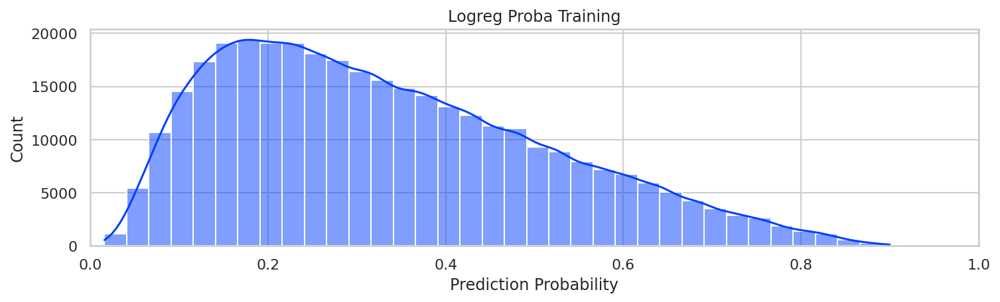

In [232]:
fig, ax = plt.subplots(figsize=(12,3))
sns.histplot(x=grid_search.predict_proba(X_train_new)[:,1],
             binwidth=0.025,
             kde=True,
             ax=ax)

ax.set_title('Logreg Proba Training')
ax.set_xlabel('Prediction Probability')
ax.set_xlim(0,1)

(0.0, 1.0)

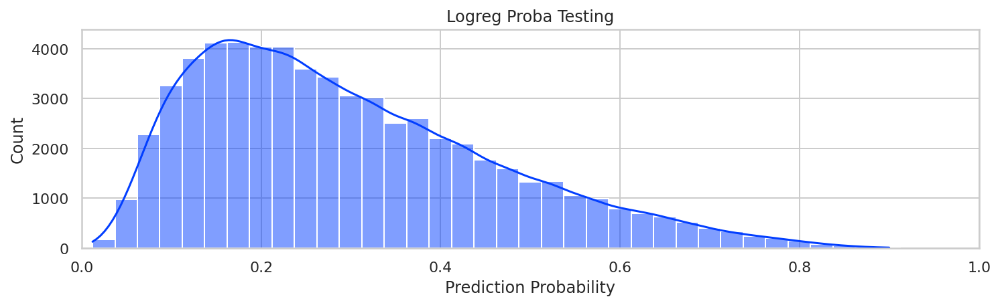

In [233]:
fig, ax = plt.subplots(figsize=(12,3))
sns.histplot(x=grid_search.predict_proba(X_test_new)[:,1],
             binwidth=0.025,
             kde=True,
             ax=ax)

ax.set_title('Logreg Proba Testing')
ax.set_xlabel('Prediction Probability')
ax.set_xlim(0,1)

### Random Forest

In [234]:
from sklearn.ensemble import RandomForestClassifier
rfc = RandomForestClassifier()
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [235]:
rfc_pred_train = rfc.predict(X_train)
rfc_pred_test = rfc.predict(X_test)

In [236]:
# View accuracy score
accuracy_score(y_test, rfc_pred_test)

0.8988342032095995

              precision    recall  f1-score   support

           0       0.92      0.97      0.95     56554
           1       0.20      0.09      0.12      4949

    accuracy                           0.90     61503
   macro avg       0.56      0.53      0.53     61503
weighted avg       0.87      0.90      0.88     61503



Text(30.5, 0.5, 'Realita')

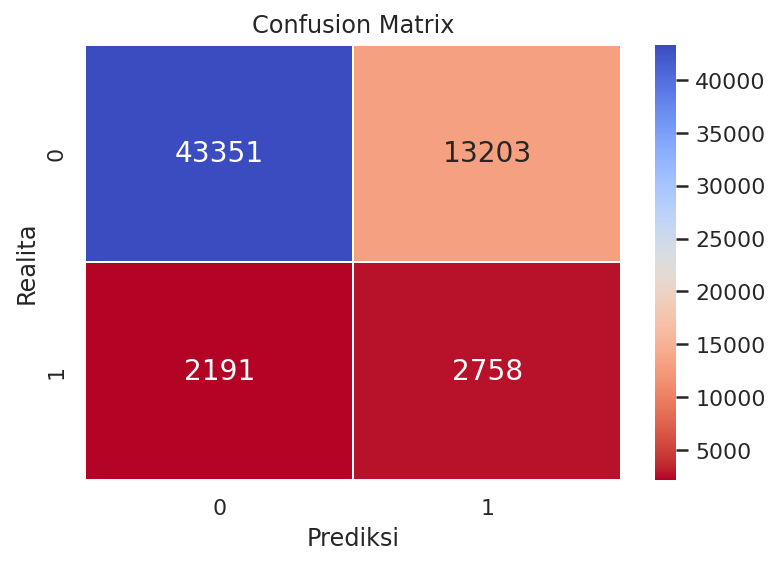

In [237]:
print(classification_report(y_test,rfc_pred_test))
sns.heatmap(cnf_matrix,cmap='coolwarm_r',annot=True,linewidth=0.5,fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Prediksi')
plt.ylabel('Realita')

In [238]:
false_positive_rate, true_positive_rate, threshold = roc_curve(y_test,rfc.predict_proba(X_test)[:,1])
roc_auc_value = roc_auc_score(y_test, rfc.predict_proba(X_test)[:,1]).round(4)
gini_value = ((2*roc_auc_value)-1).round(4)

print('AUC for Random Forest on val data: ', round(roc_auc_value*100, 2), '%')
print('Gini for Random Forest on val data: ', round(gini_value*100, 2), '%')

AUC for Random Forest on val data:  64.61 %
Gini for Random Forest on val data:  29.22 %


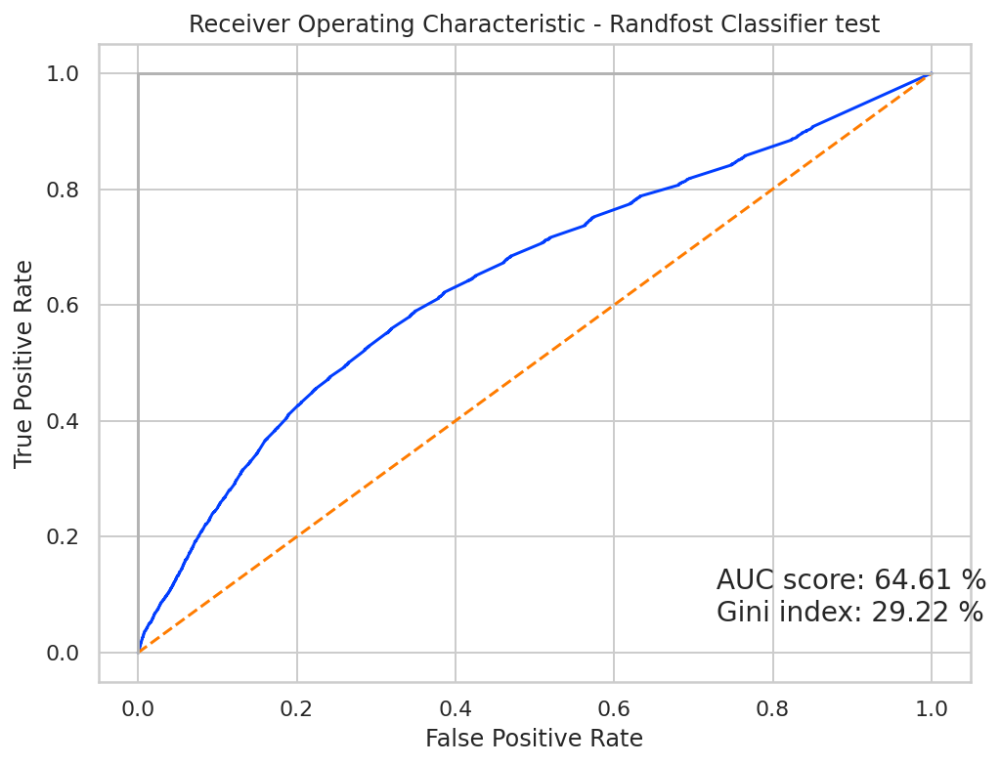

In [239]:
fig, ax = plt.subplots(1, figsize=(8,6))
plt.title('Receiver Operating Characteristic - Randfost Classifier test')
plt.plot(false_positive_rate, true_positive_rate)
plt.plot([0, 1], ls="--")
plt.plot([0, 0], [1, 0] , c=".7"), plt.plot([1, 1] , c=".7")
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

plt.text(ax.get_xlim()[1]*6/10, 
         0, 
         f"""\n
         AUC score: {round(roc_auc_value*100, 2)} %
         Gini index: {round(gini_value*100, 2)} %
         """)

plt.show()

In [240]:
#List Hyperparameters yang akan diuji
hyperparameters = dict(
                       n_estimators = [int(x) for x in np.linspace(start = 10, stop = 20, num = 5)], # Jumlah subtree 
                       bootstrap = [True], # Apakah pakai bootstrapping atau tidak
                       criterion = ['gini','entropy'],
                       max_depth = [int(x) for x in np.linspace(10, 20, num = 6)],  # Maximum kedalaman tree
                       min_samples_split = [int(x) for x in np.linspace(start = 2, stop = 10, num = 5)], # Jumlah minimum samples pada node agar boleh di split menjadi leaf baru
                       min_samples_leaf = [int(x) for x in np.linspace(start = 1, stop = 10, num = 5)], # Jumlah minimum samples pada leaf agar boleh terbentuk leaf baru
                       max_features = ['auto', 'sqrt', 'log2'], # Jumlah feature yg dipertimbangkan pada masing-masing split
                       n_jobs = [-1], # Core untuk parallel computation. -1 untuk menggunakan semua core
                      )

# Init
rfc = RandomForestClassifier(random_state=42)
rfc_tuned = RandomizedSearchCV(rfc, hyperparameters, cv=5, random_state=42, scoring='roc_auc')
rfc_tuned.fit(X_train,y_train)

# Predict
y_pred_proba_rfc_tuned = rfc_tuned.predict_proba(X_test)
y_pred_test_rfc_tuned = rfc_tuned.predict(X_test)

In [241]:
print('Best n_estimators:', rfc_tuned.best_estimator_.get_params()['n_estimators'])
print('Best bootstrap:', rfc_tuned.best_estimator_.get_params()['bootstrap'])
print('Best criterion:', rfc_tuned.best_estimator_.get_params()['criterion'])
print('Best max_depth:', rfc_tuned.best_estimator_.get_params()['max_depth'])
print('Best min_samples_split:', rfc_tuned.best_estimator_.get_params()['min_samples_split'])
print('Best min_samples_leaf:', rfc_tuned.best_estimator_.get_params()['min_samples_leaf'])
print('Best max_features:', rfc_tuned.best_estimator_.get_params()['max_features'])
print('Best n_jobs:', rfc_tuned.best_estimator_.get_params()['n_jobs'])

Best n_estimators: 15
Best bootstrap: True
Best criterion: entropy
Best max_depth: 18
Best min_samples_split: 10
Best min_samples_leaf: 1
Best max_features: auto
Best n_jobs: -1


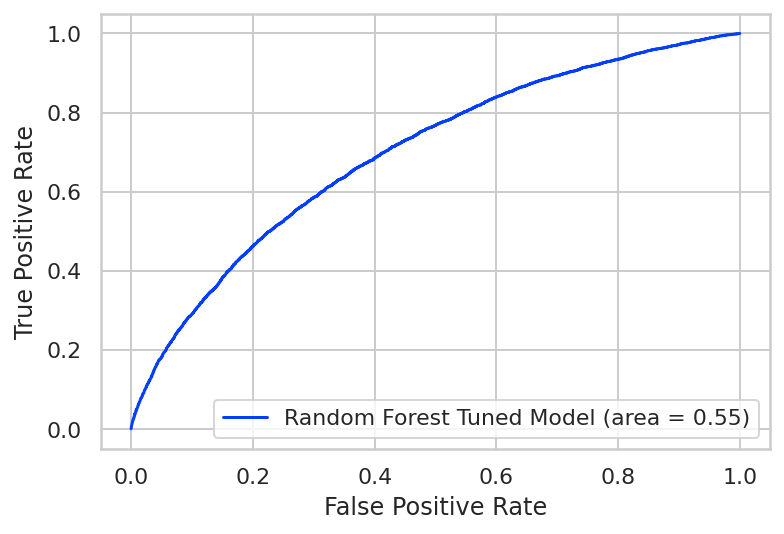

In [242]:
Log_ROC_auc = roc_auc_score(y_test, y_pred_test_rfc_tuned)
fpr, tpr, thresholds = roc_curve(y_test, y_pred_proba_rfc_tuned [:, 1])

plt.figure()
plt.plot(fpr, tpr, label = "Random Forest Tuned Model (area = %0.2f)" % Log_ROC_auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.show()

## Business Metrics Calculation

### Loss Given Default

In [243]:
DF_TRAIN.shape

(307511, 206)

In [244]:
DF_TRAIN.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,DOC_PROVIDED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW,EITC,Children,Family,Group of people,Other_A,Other_B,"Spouse, partner",Unaccompanied,Businessman,Commercial associate,Maternity leave,Pensioner,State servant,Student,Unemployed,Working,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special,Civil marriage,Married,Separated,Single / not married,Unknown,Widow,Co-op apartment,House / apartment,Municipal apartment,Office apartment,Rented apartment,With parents,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business Entity Type 1,Business Entity Type 2,Business Entity Type 3,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry: type 1,Industry: type 10,Industry: type 11,Industry: type 12,Industry: type 13,Industry: type 2,Industry: type 3,Industry: type 4,Industry: type 5,Industry: type 6,Industry: type 7,Industry: type 8,Industry: type 9,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade: type 1,Trade: type 2,Trade: type 3,Trade: type 4,Trade: type 5,Trade: type 6,Trade: type 7,Transport: type 1,Transport: type 2,Transport: type 3,Transport: type 4,University,XNA,block of flats,specific housing,terraced house,Block,Mixed,Monolithic,Others,Panel,"Stone, brick",Wooden
0,1,0,1,0,1,0.0,0.001512,0.090287,0.090032,0.077441,0.256321,0.852140,0.705433,1.0,1.0,0.0,1.0,1.0,0.0,0.000000,0.5,0.5,0.434783,0.0,0.0,0.0,0.0,0.0,0.0,0.072215,0.307542,0.155054,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0252,0.0383,0.9722,0.0000,0.0690,0.0833,0.0377,0.0198,0.0000,0.0250,0.0369,0.9722,0.00,0.0690,0.0833,0.0375,0.0193,0.0000,0.0149,0,0.005747,0.058824,0.005814,0.083333,0.735788,0.0,0.0,0.0,0.0,0.0,0.04,0.000000,0.060870,0.111161,0.035563,0.25,1.0,0.064910,0.081181,0.023640,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0.0,0.002089,0.311736,0.132924,0.271605,0.045016,0.951929,0.959566,1.0,1.0,0.0,1.0,1.0,0.0,0.052632,0.0,0.0,0.478261,0.0,0.0,0.0,0

In [245]:
DF_TRAIN['AMT_CREDIT'] = scaler_AMT_CREDIT.inverse_transform(DF_TRAIN['AMT_CREDIT'].values.reshape(len(DF_TRAIN), 1))

In [246]:
DF_TRAIN.head()

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,DOC_PROVIDED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW,EITC,Children,Family,Group of people,Other_A,Other_B,"Spouse, partner",Unaccompanied,Businessman,Commercial associate,Maternity leave,Pensioner,State servant,Student,Unemployed,Working,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special,Civil marriage,Married,Separated,Single / not married,Unknown,Widow,Co-op apartment,House / apartment,Municipal apartment,Office apartment,Rented apartment,With parents,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business Entity Type 1,Business Entity Type 2,Business Entity Type 3,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry: type 1,Industry: type 10,Industry: type 11,Industry: type 12,Industry: type 13,Industry: type 2,Industry: type 3,Industry: type 4,Industry: type 5,Industry: type 6,Industry: type 7,Industry: type 8,Industry: type 9,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade: type 1,Trade: type 2,Trade: type 3,Trade: type 4,Trade: type 5,Trade: type 6,Trade: type 7,Transport: type 1,Transport: type 2,Transport: type 3,Transport: type 4,University,XNA,block of flats,specific housing,terraced house,Block,Mixed,Monolithic,Others,Panel,"Stone, brick",Wooden
0,1,0,1,0,1,0.0,0.001512,406597.5,0.090032,0.077441,0.256321,0.852140,0.705433,1.0,1.0,0.0,1.0,1.0,0.0,0.000000,0.5,0.5,0.434783,0.0,0.0,0.0,0.0,0.0,0.0,0.072215,0.307542,0.155054,0.0247,0.0369,0.9722,0.00,0.0690,0.0833,0.0369,0.0190,0.0000,0.0252,0.0383,0.9722,0.0000,0.0690,0.0833,0.0377,0.0198,0.0000,0.0250,0.0369,0.9722,0.00,0.0690,0.0833,0.0375,0.0193,0.0000,0.0149,0,0.005747,0.058824,0.005814,0.083333,0.735788,0.0,0.0,0.0,0.0,0.0,0.04,0.000000,0.060870,0.111161,0.035563,0.25,1.0,0.064910,0.081181,0.023640,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0.0,0.002089,1293502.5,0.132924,0.271605,0.045016,0.951929,0.959566,1.0,1.0,0.0,1.0,1.0,0.0,0.052632,0.0,0.0,0.478261,0.0,0.0,0.0,

In [247]:
X = DF_TRAIN.drop(columns = ['TARGET'])
Y = DF_TRAIN[['TARGET']]
XTrain, XTest, yTrain, yTest = train_test_split(X,Y,test_size = 0.2,random_state = 42)

In [248]:
DF_TRAIN.shape

(307511, 206)

In [249]:
preds_test.shape

(61503,)

In [250]:
XTest.shape

(61503, 205)

In [251]:
XTest['TARGET_PRED_RESULT'] = preds_test
XTest['TARGET'] = yTest

In [252]:
XTest.shape

(61503, 207)

In [253]:
XTest.head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,LANDAREA_AVG,LIVINGAREA_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,LANDAREA_MODE,LIVINGAREA_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,LANDAREA_MEDI,LIVINGAREA_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,TOTAL_PREV_APP,TOTAL_BUREAU_LOAN,AGE,YEARS_EMPLOYED,TOTAL_DOCUMENT,DOC_PROVIDED,INCOME_ANNUITY_PERCENT,INCOME_ANNUITY_PERCENT_NEW,EITC,Children,Family,Group of people,Other_A,Other_B,"Spouse, partner",Unaccompanied,Businessman,Commercial associate,Maternity leave,Pensioner,State servant,Student,Unemployed,Working,Academic degree,Higher education,Incomplete higher,Lower secondary,Secondary / secondary special,Civil marriage,Married,Separated,Single / not married,Unknown,Widow,Co-op apartment,House / apartment,Municipal apartment,Office apartment,Rented apartment,With parents,Accountants,Cleaning staff,Cooking staff,Core staff,Drivers,HR staff,High skill tech staff,IT staff,Laborers,Low-skill Laborers,Managers,Medicine staff,Private service staff,Realty agents,Sales staff,Secretaries,Security staff,Waiters/barmen staff,FRIDAY,MONDAY,SATURDAY,SUNDAY,THURSDAY,TUESDAY,WEDNESDAY,Advertising,Agriculture,Bank,Business Entity Type 1,Business Entity Type 2,Business Entity Type 3,Cleaning,Construction,Culture,Electricity,Emergency,Government,Hotel,Housing,Industry: type 1,Industry: type 10,Industry: type 11,Industry: type 12,Industry: type 13,Industry: type 2,Industry: type 3,Industry: type 4,Industry: type 5,Industry: type 6,Industry: type 7,Industry: type 8,Industry: type 9,Insurance,Kindergarten,Legal Services,Medicine,Military,Mobile,Other,Police,Postal,Realtor,Religion,Restaurant,School,Security,Security Ministries,Self-employed,Services,Telecom,Trade: type 1,Trade: type 2,Trade: type 3,Trade: type 4,Trade: type 5,Trade: type 6,Trade: type 7,Transport: type 1,Transport: type 2,Transport: type 3,Transport: type 4,University,XNA,block of flats,specific housing,terraced house,Block,Mixed,Monolithic,Others,Panel,"Stone, brick",Wooden,TARGET_PRED_RESULT,TARGET
245895,0,1,1,0,0.105263,0.001550,465457.5,0.199000,0.094276,0.129331,0.974181,0.401556,1.0,1.0,0.0,1.0,0.0,0.0,0.157895,0.5,0.5,0.478261,0.0,0.0,0.0,0.0,1.0,1.0,0.697493,0.707479,0.000000,0.0876,0.0763,0.9816,0.00,0.1379,0.1667,0.0481,0.0745,0.0036,0.0840,0.0746,0.9816,0.0000,0.1379,0.1667,0.0458,0.0731,0.0011,0.0864,0.0758,0.9816,0.00,0.1379,0.1667,0.0487,0.0749,0.0031,0.0688,0,0.000000,0.0,0.000000,0.0,0.999534,0.0,0.0,0.0,0.037037,0.0,0.04,0.055556,0.052174,0.327396,0.042541,0.25,1.0,0.135456,0.169412,0.026481,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
98194,0,0,1,1,0.000000,0.001897,1281712.5,0.184591,0.283951,0.090864,0.934744,0.368348,1.0,1.0,0.0,1.0,0.0,1.0,0.000

### Loss Given Default Before Using Model

In [254]:
Defaulters = XTest.groupby(['TARGET'])['AMT_CREDIT'].sum().reset_index()
Defaulters

,TARGET,AMT_CREDIT
0,0,3.390997e+10
1,1,2.780554e+09


In [255]:
Total_Defaulters = XTest.groupby(['TARGET'])['AMT_CREDIT'].count().reset_index()
Total_Defaulters

,TARGET,AMT_CREDIT
0,0,56554
1,1,4949


In [256]:
LGDBefore = Defaulters['AMT_CREDIT'].loc[Defaulters['TARGET'] == 1]
LGDBefore

1    2.780554e+09
Name: AMT_CREDIT, dtype: float64

### Loss Given Default After Using Model

In [257]:
FalseNegative = (XTest.loc[(XTest['TARGET'] == 1) & (XTest['TARGET_PRED_RESULT'] == 0)])

In [258]:
FalseNegative.shape

(3206, 207)

In [259]:
LGDAfter = FalseNegative['AMT_CREDIT'].sum()
LGDAfter

1951274416.5

In [260]:
LGDAfter - LGDBefore

1   -829279737.0
Name: AMT_CREDIT, dtype: float64

In [261]:
LGD_Decreased_Percentage = ((LGDAfter-LGDBefore)/LGDBefore)*100
LGD_Decreased_Percentage

1   -29.824261
Name: AMT_CREDIT, dtype: float64

## Predict Data Test Using Model

Untuk melakukan predict data tes kita akan menggunakan feature berdasar IV > 0.01

In [277]:
#select fitur
feature_keep = df_analysis[df_analysis["iv"] > 0.01].index
feature_keep

Index(['EXT_SOURCE_2', 'EXT_SOURCE_3', 'EXT_SOURCE_1', 'AGE', 'YEARS_EMPLOYED',
       'DAYS_LAST_PHONE_CHANGE', 'DAYS_ID_PUBLISH', 'AMT_GOODS_PRICE',
       'REGION_RATING_CLIENT_W_CITY', 'FLOORSMAX_AVG', 'REGION_RATING_CLIENT',
       'FLOORSMAX_MEDI', 'FLOORSMAX_MODE', 'LIVINGAREA_MEDI', 'LIVINGAREA_AVG',
       'TOTALAREA_MODE', 'LIVINGAREA_MODE', 'DAYS_REGISTRATION',
       'ELEVATORS_AVG', 'ELEVATORS_MEDI', 'APARTMENTS_MEDI', 'APARTMENTS_AVG',
       'ELEVATORS_MODE', 'APARTMENTS_MODE', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE',
       'BASEMENTAREA_AVG', 'ENTRANCES_AVG', 'BASEMENTAREA_MEDI',
       'ENTRANCES_MEDI', 'ENTRANCES_MODE', 'NONLIVINGAREA_MODE',
       'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MEDI', 'BASEMENTAREA_MODE',
       'LANDAREA_AVG', 'LANDAREA_MEDI', 'LANDAREA_MODE'],
      dtype='object')

In [278]:
feature_keep1 = ['EXT_SOURCE_2', 'EXT_SOURCE_3', 'EXT_SOURCE_1', 'AGE', 'YEARS_EMPLOYED',
       'DAYS_LAST_PHONE_CHANGE', 'DAYS_ID_PUBLISH', 'AMT_GOODS_PRICE',
       'REGION_RATING_CLIENT_W_CITY', 'FLOORSMAX_AVG', 'REGION_RATING_CLIENT',
       'FLOORSMAX_MEDI', 'FLOORSMAX_MODE', 'LIVINGAREA_MEDI', 'LIVINGAREA_AVG',
       'TOTALAREA_MODE', 'LIVINGAREA_MODE', 'DAYS_REGISTRATION',
       'ELEVATORS_AVG', 'ELEVATORS_MEDI', 'APARTMENTS_MEDI', 'APARTMENTS_AVG',
       'ELEVATORS_MODE', 'APARTMENTS_MODE', 'YEARS_BEGINEXPLUATATION_MEDI',
       'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE',
       'BASEMENTAREA_AVG', 'ENTRANCES_AVG', 'BASEMENTAREA_MEDI',
       'ENTRANCES_MEDI', 'ENTRANCES_MODE', 'NONLIVINGAREA_MODE',
       'NONLIVINGAREA_AVG', 'NONLIVINGAREA_MEDI', 'BASEMENTAREA_MODE',
       'LANDAREA_AVG', 'LANDAREA_MEDI', 'LANDAREA_MODE']

In [279]:
df_test = df_test[feature_keep1]

In [280]:
logres = LogisticRegression()
logres.fit(X_train, y_train)

LogisticRegression()

In [281]:
y_pred_proba_logres_df_test = logres.predict_proba(df_test)
y_pred_proba_logres_df_test

array([[0.14385919, 0.85614081],
       [0.15307443, 0.84692557],
       [0.10907555, 0.89092445],
       ...,
       [0.10027513, 0.89972487],
       [0.0638707 , 0.9361293 ],
       [0.15117725, 0.84882275]])

In [282]:
df_test.shape

(48744, 39)

In [283]:
apptes.shape

(48744, 121)

In [284]:
PredictResultTest = apptes['SK_ID_CURR'].reset_index()
PredictResultTest['TARGET'] = round(pd.DataFrame(y_pred_proba_logres_df_test[:,1]),1)
PredictResultTest.drop('index', axis=1, inplace=True)
PredictResultTest.head()

,SK_ID_CURR,TARGET
0,100001,0.9
1,100005,0.8
2,100013,0.9
3,100028,0.9
4,100038,0.9


In [285]:
PredictResultTest.shape

(48744, 2)

In [286]:
PredictResultTest.to_csv("result.txt", sep=',', header=True, index=False) 